In [2]:
import numpy as np
import h5py
import os
import glob
from utilityFunctions import load_csv_to_matrix, load_csv_to_matrix_batch, compute_color_preference_raw_batch, compute_color_preference_distance_batch, show_heatmaps, compute_color_similarity_distance_batch, compute_correlations, RSA, split_and_average_matrices, perform_mds_and_plot
from utilityFunctions_GWOT import GWD_and_find_best, GWD_and_plot
import itertools
from scipy.stats import ttest_ind, mannwhitneyu 

In [3]:
unique_colours = np.array(['#d2b700', '#db8b08', '#c7512c', '#c13547', '#a03663', '#753a7a', '#4b488e', '#005692', '#006a8b', '#007b75', '#008a52', '#9aa400'])
colour_index = {colour: idx for idx, colour in enumerate(unique_colours)}
matrix_size = len(unique_colours)
folder_path = 'raw_data/202411_data'
response_type = 'preference'

In [4]:
def load_clusters_from_mat_v73(file_path):
    with h5py.File(file_path, 'r') as f:
        print("Keys:", list(f.keys()))  # Inspect available variables

        clusters = f['clusters']
        # Assume it's a 2x1 cell array, and each cell points to a dataset
        cluster1_ref = clusters[0][0]
        cluster2_ref = clusters[1][0]

        cluster1 = np.array(f[cluster1_ref]).astype(int).flatten()
        cluster2 = np.array(f[cluster2_ref]).astype(int).flatten()

        return cluster1, cluster2

In [5]:
cluster1, cluster2 = load_clusters_from_mat_v73('raw_data/clusters_preference_raw.mat')
print(cluster1)
print(cluster2)

Keys: ['#refs#', 'clusters', 'participants', 'process_type', 'rating_type']
[ 1 15 12  7 11  5  8 10  4 13 18]
[ 2 19  6  3 16  9 14 17]


In [6]:
cluster_1_matrices = []
for subject_id in cluster1:
    # Construct glob pattern
    subject_pattern = f"subject_{subject_id:02d}_*.csv"
    search_path = os.path.join(folder_path, subject_pattern)

    matched_files = glob.glob(search_path)

    if not matched_files:
        print(f"No file found for subject {subject_id}")
        continue  # Skip if no match

    file_path = matched_files[0]  # Use the first match
    matrix = load_csv_to_matrix(file_path, response_type, colour_index, matrix_size)
    cluster_1_matrices.append(matrix)

cluster_1_matrices_raw_preference = compute_color_preference_raw_batch(cluster_1_matrices, value_range_max = 3.5)
cluster_1_matrices_preference_distance = compute_color_preference_distance_batch(cluster_1_matrices, value_range_max = 3.5)

cluster_2_matrices = []
for subject_id in cluster2:
    # Construct glob pattern
    subject_pattern = f"subject_{subject_id:02d}_*.csv"
    search_path = os.path.join(folder_path, subject_pattern)

    matched_files = glob.glob(search_path)

    if not matched_files:
        print(f"No file found for subject {subject_id}")
        continue  # Skip if no match

    file_path = matched_files[0]  # Use the first match
    matrix = load_csv_to_matrix(file_path, response_type, colour_index, matrix_size)
    cluster_2_matrices.append(matrix)

cluster_2_matrices_raw_preference = compute_color_preference_raw_batch(cluster_2_matrices, value_range_max = 3.5)
cluster_2_matrices_preference_distance = compute_color_preference_distance_batch(cluster_2_matrices, value_range_max = 3.5)

In [13]:
n_eps = 15  # number of epsilon values tried
epsilons = np.logspace(-2, 1, n_eps)

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.016378937069540637, Minimum GWD: 1.643


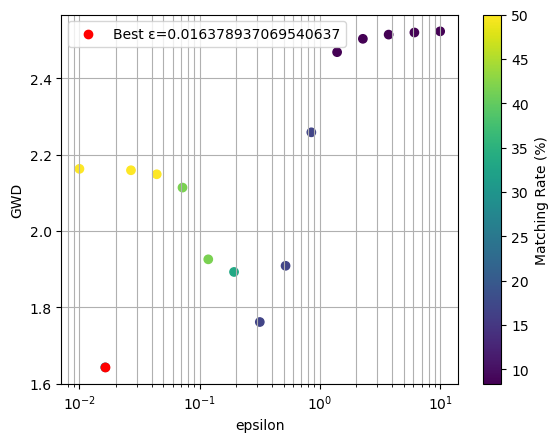

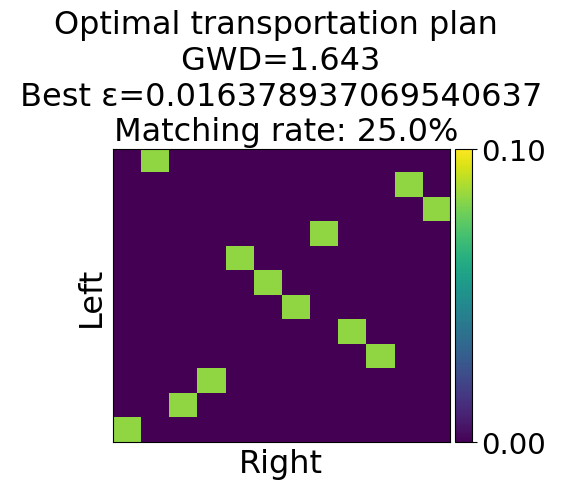

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07196856730011521, Minimum GWD: 0.899


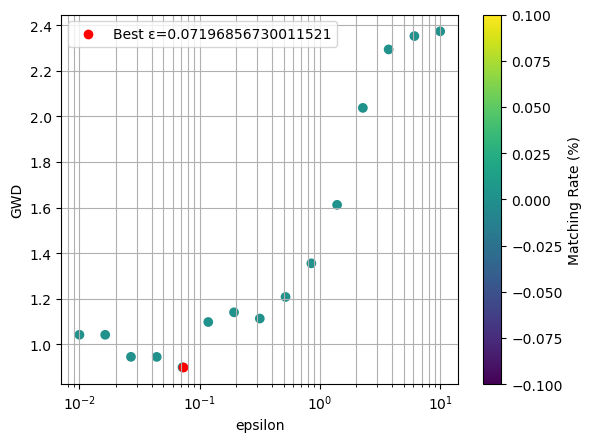

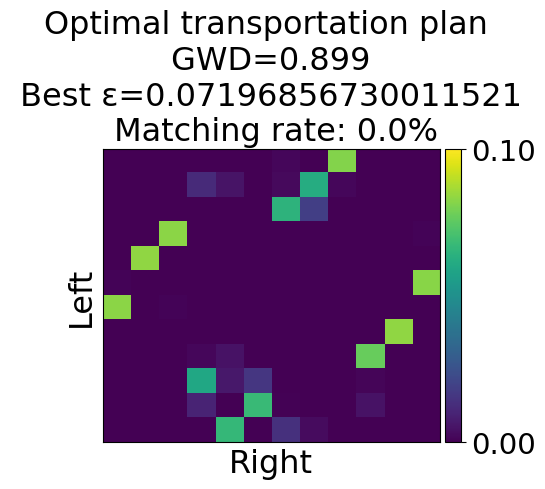

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 1.383


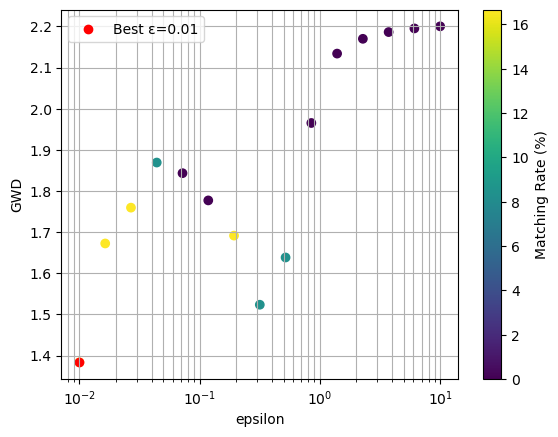

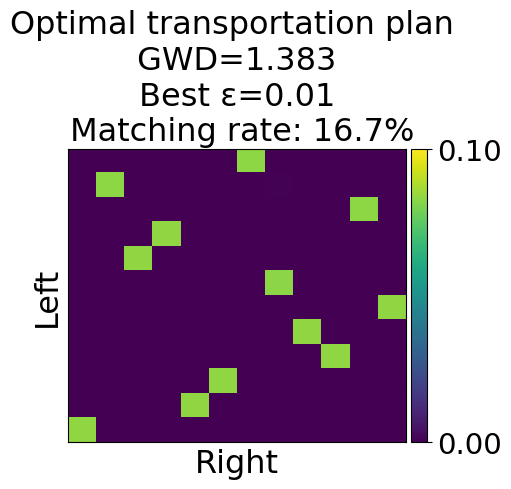

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.11787686347935872, Minimum GWD: 1.176


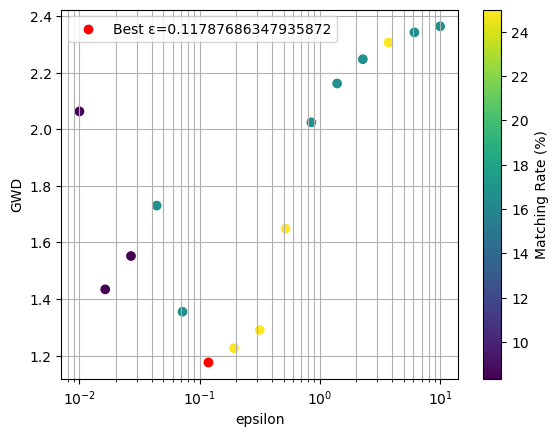

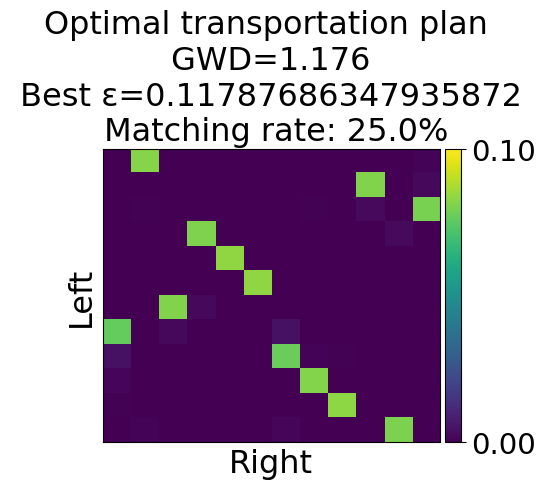

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07196856730011521, Minimum GWD: 1.474


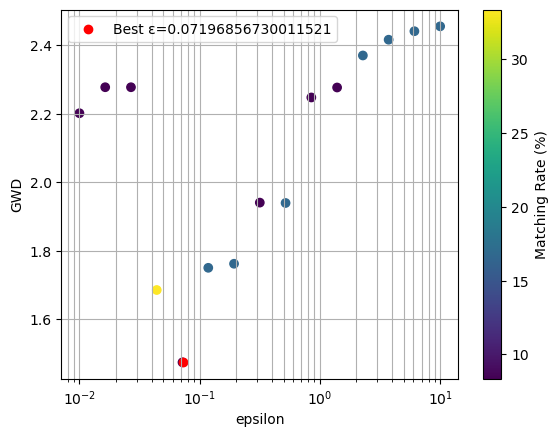

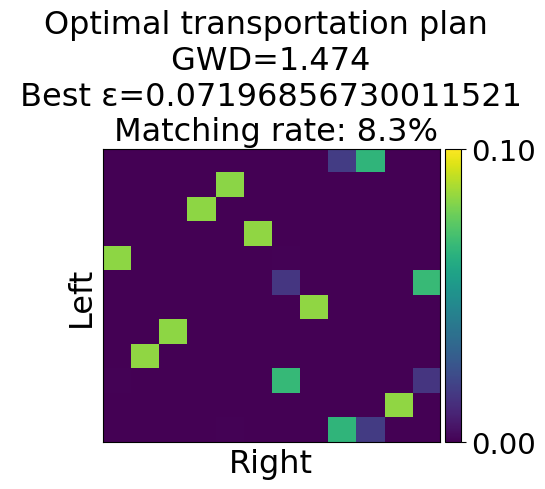

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07196856730011521, Minimum GWD: 0.893


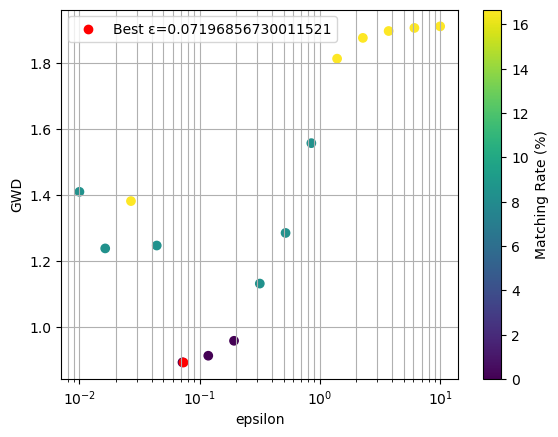

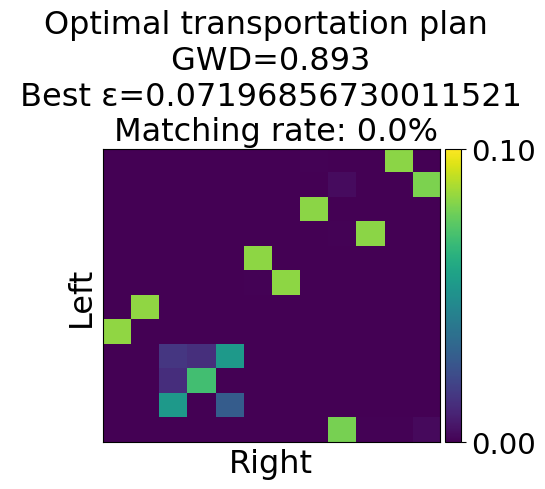

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.043939705607607904, Minimum GWD: 2.248


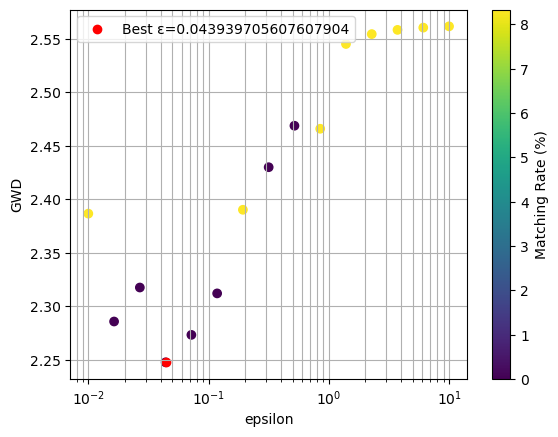

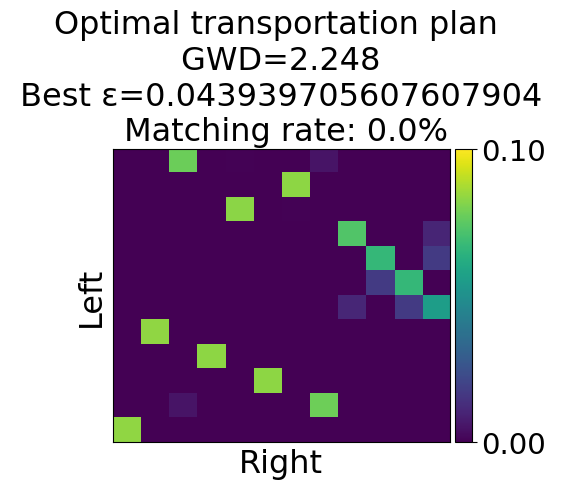

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.11787686347935872, Minimum GWD: 1.446


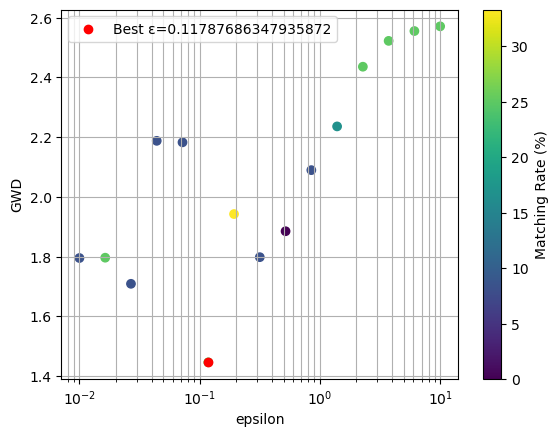

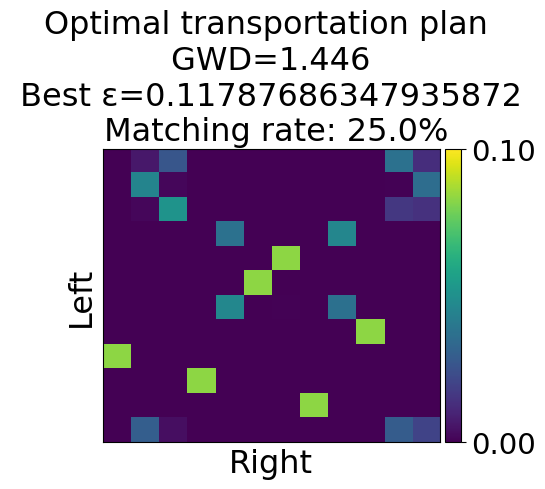

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.043939705607607904, Minimum GWD: 1.593


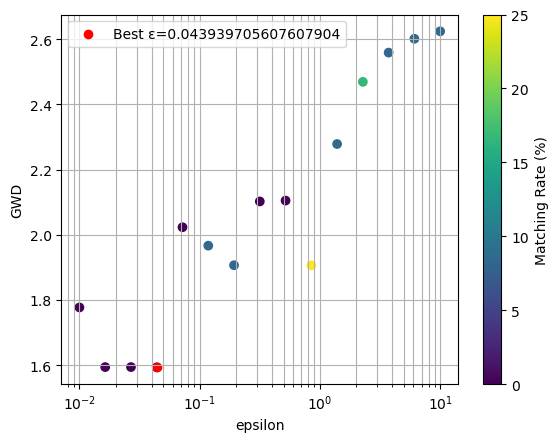

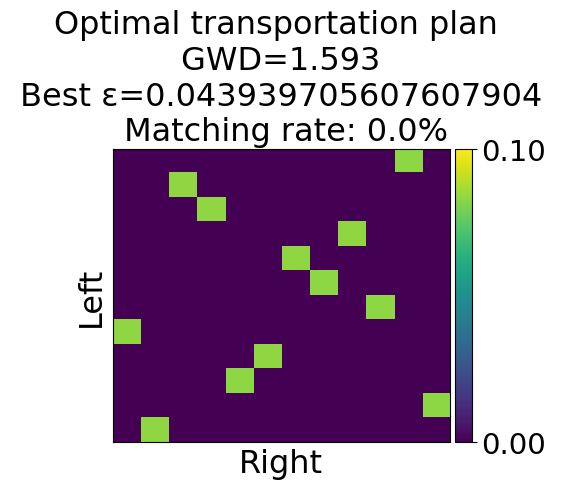

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 1.317


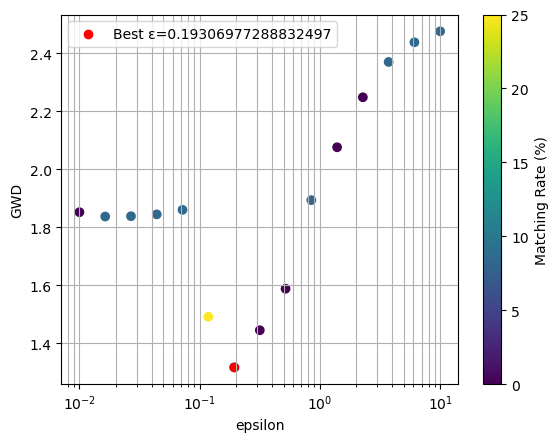

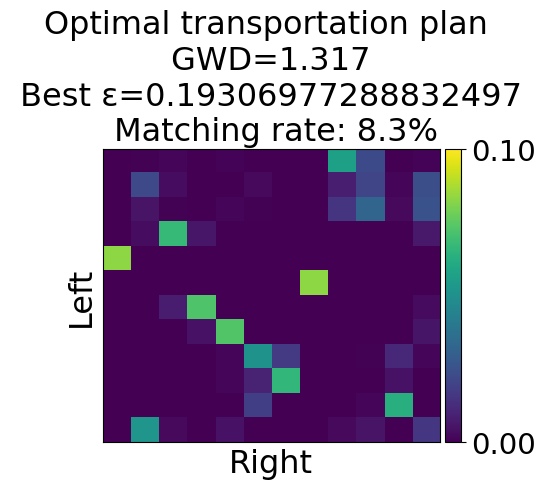

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.11787686347935872, Minimum GWD: 1.860


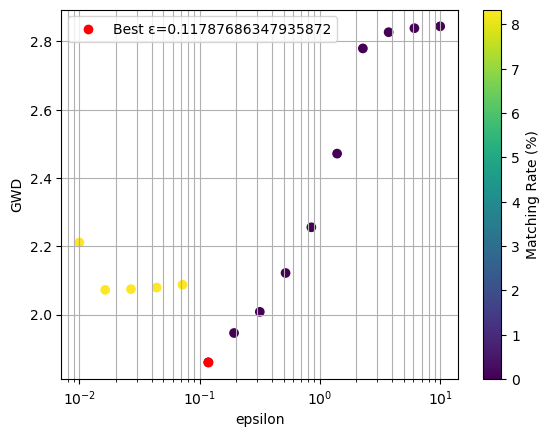

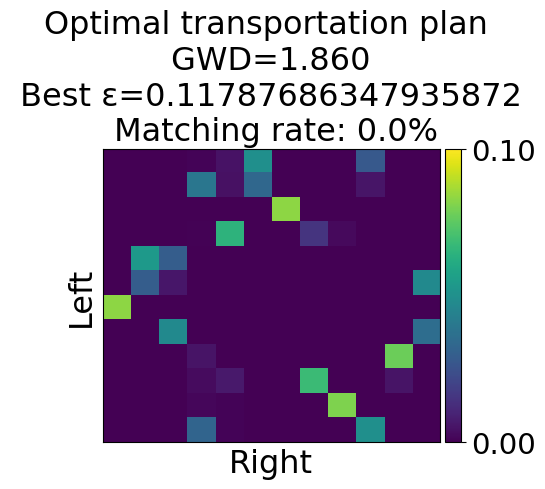

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31622776601683794, Minimum GWD: 0.687


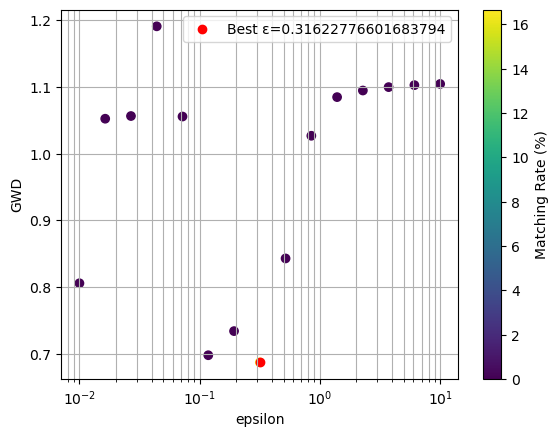

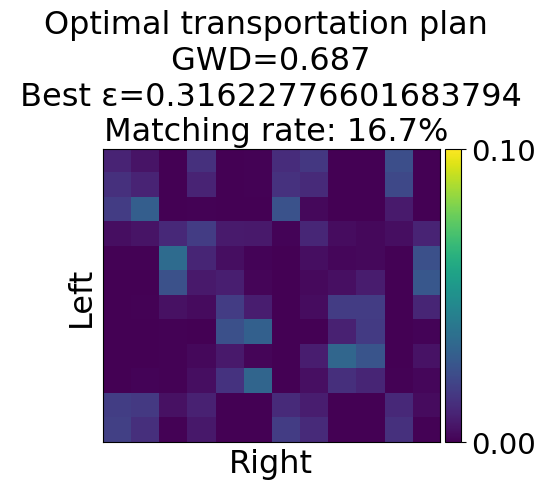

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 1.032


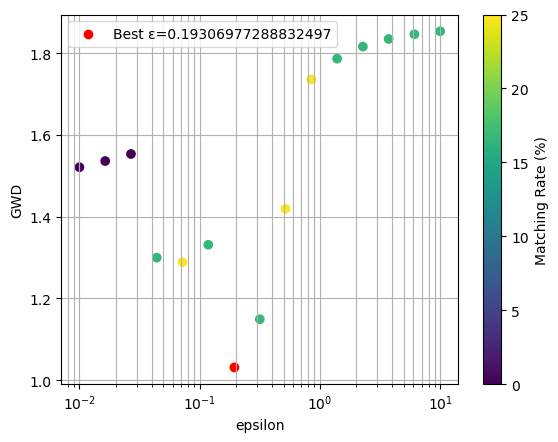

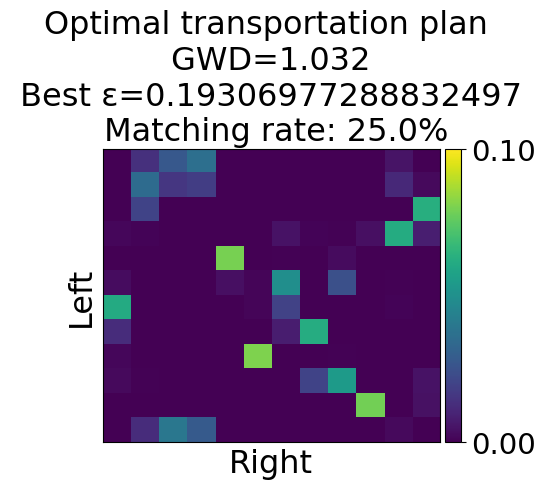

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 64
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07196856730011521, Minimum GWD: 2.021


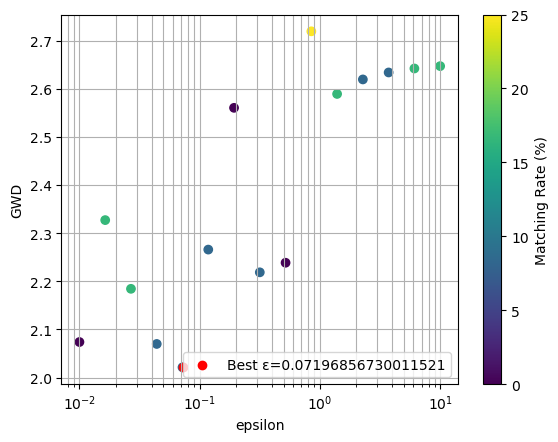

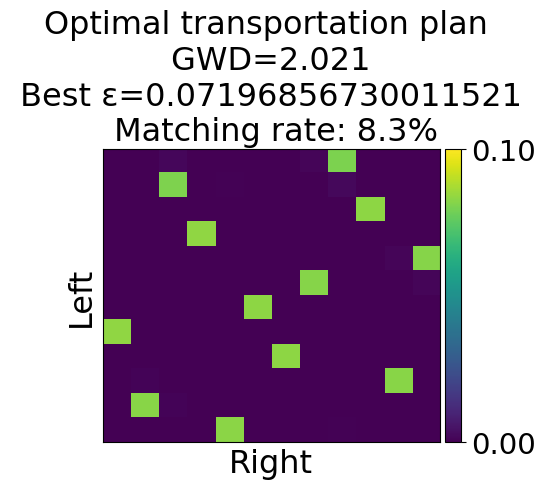

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07196856730011521, Minimum GWD: 0.801


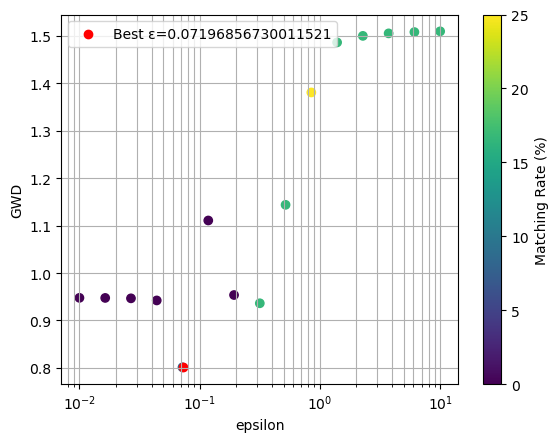

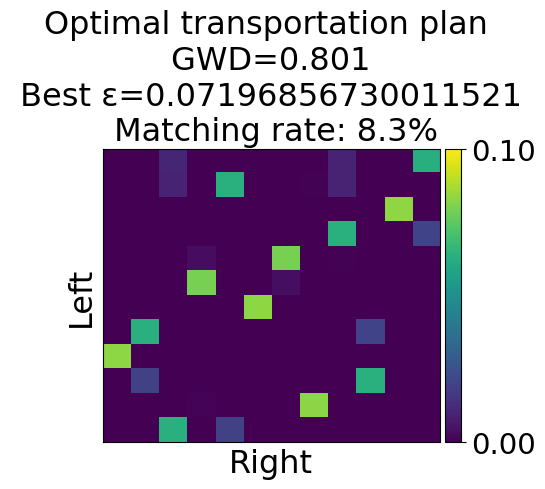

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 0.535


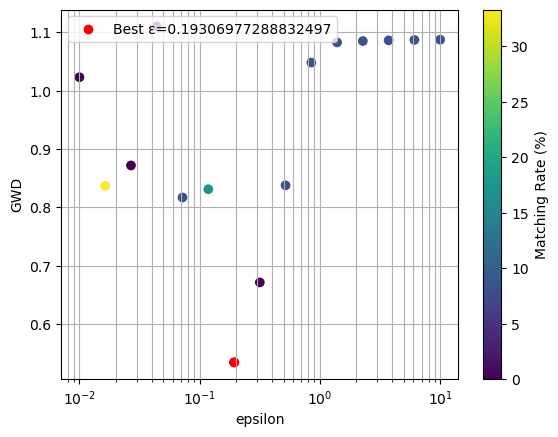

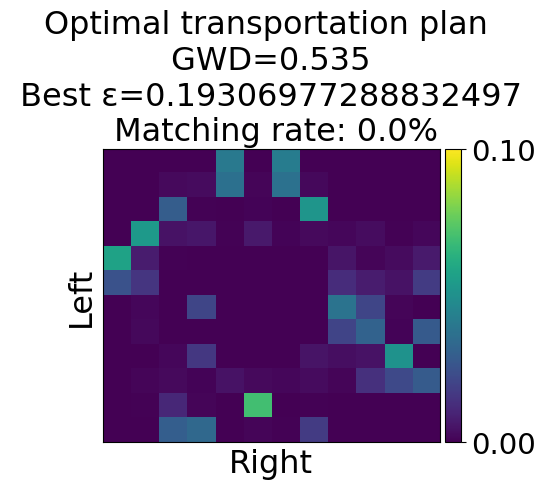

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31622776601683794, Minimum GWD: 0.998


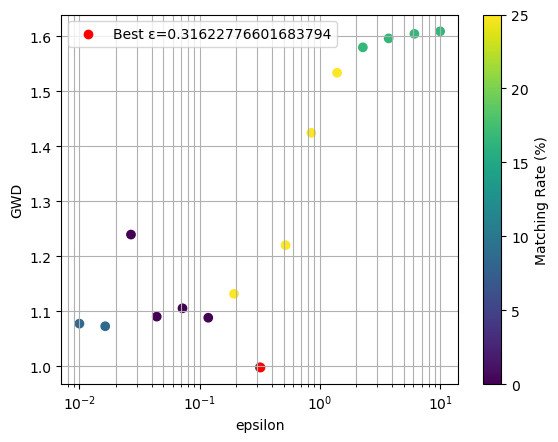

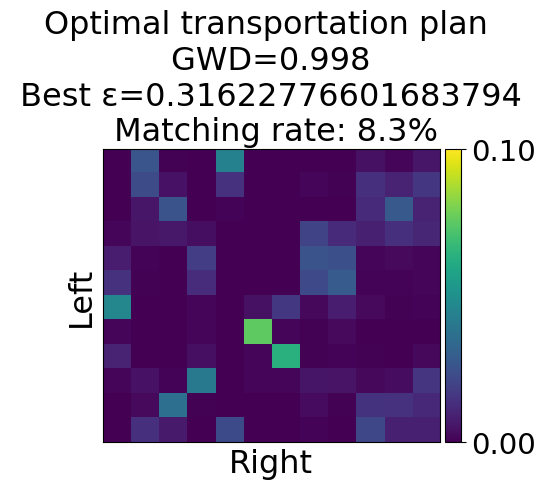

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.517947467923121, Minimum GWD: 1.805


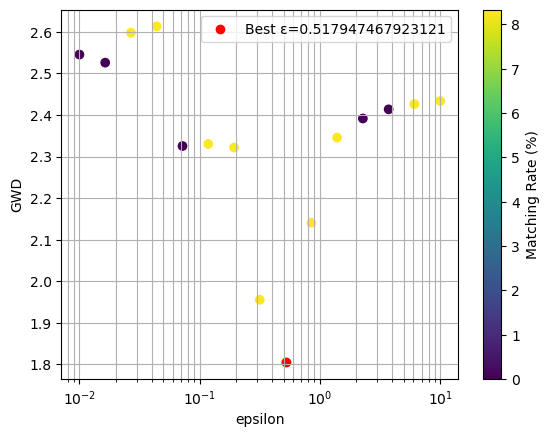

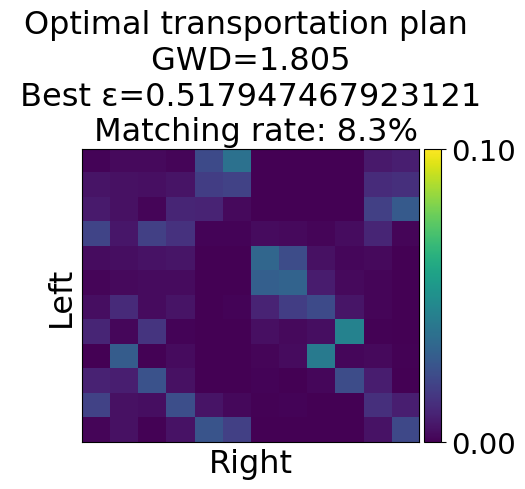

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Skipping epsilon=0.01 because it results in a zero transportation matrix.
Best epsilon: 0.043939705607607904, Minimum GWD: 1.197


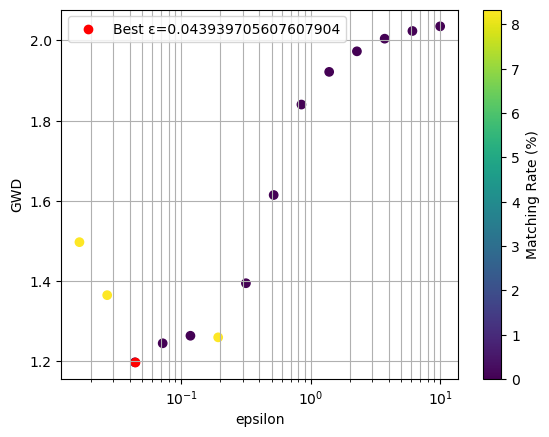

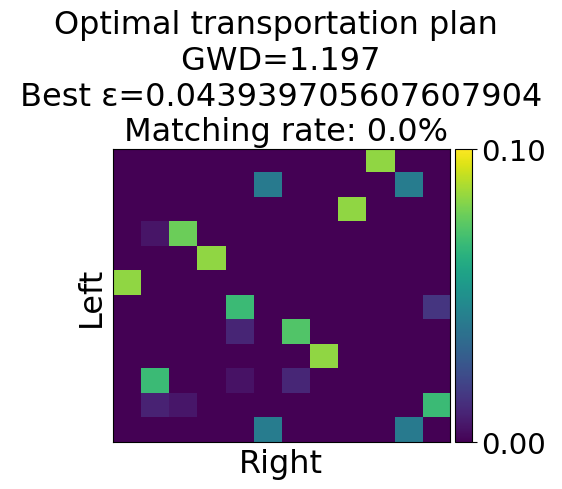

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.016378937069540637, Minimum GWD: 1.653


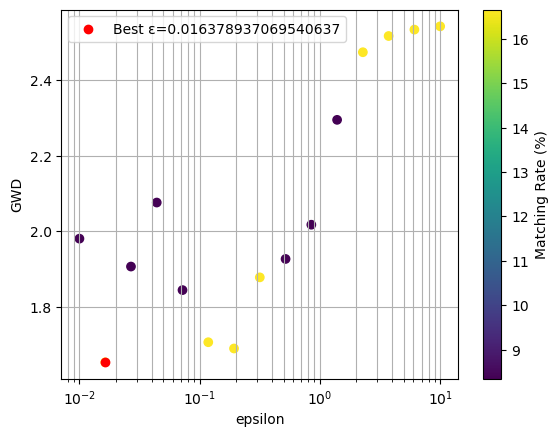

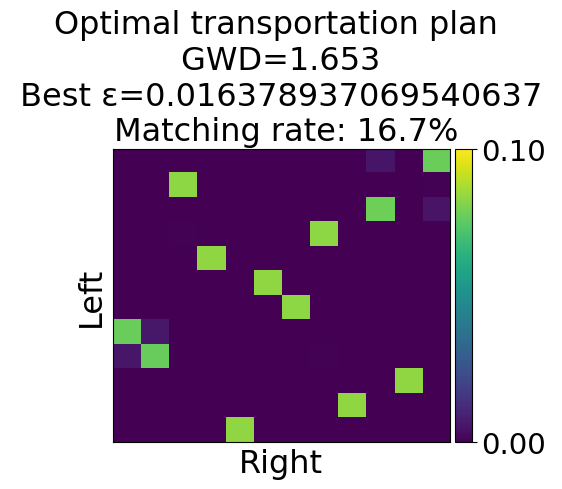

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.11787686347935872, Minimum GWD: 1.624


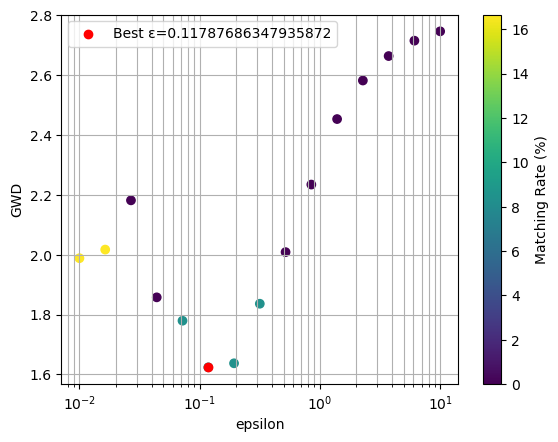

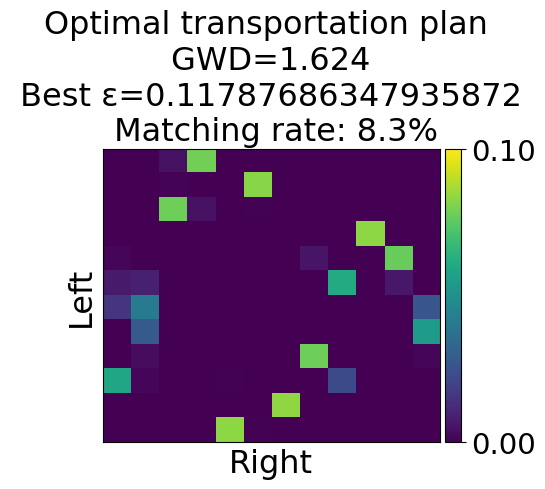

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.016378937069540637, Minimum GWD: 2.709


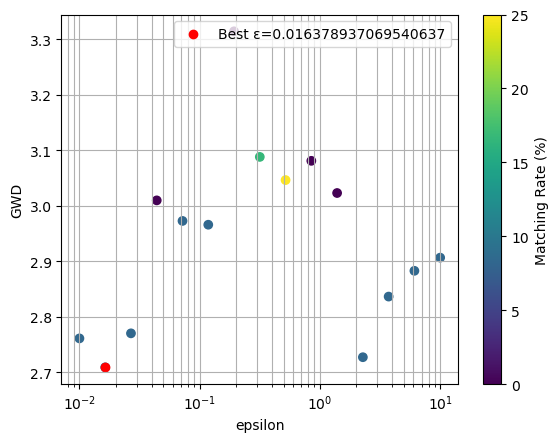

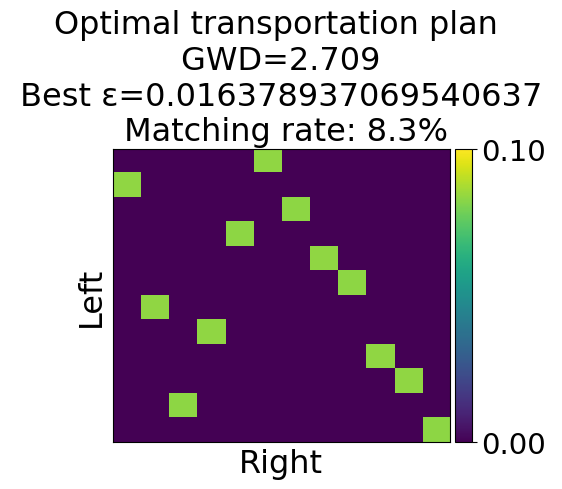

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.11787686347935872, Minimum GWD: 1.053


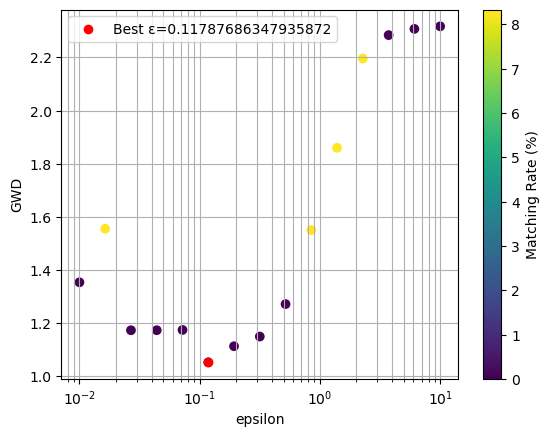

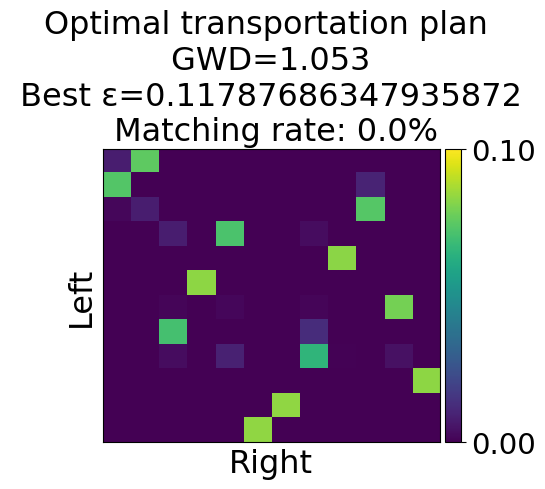

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07196856730011521, Minimum GWD: 2.007


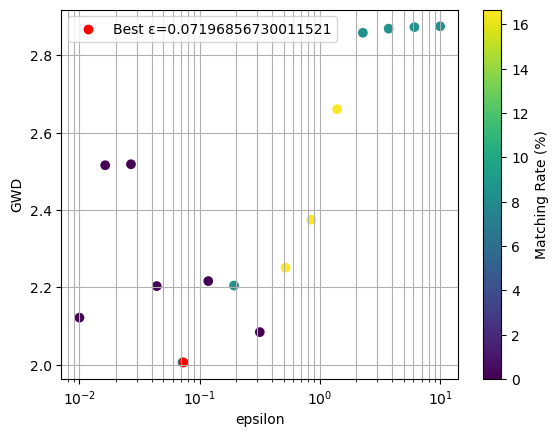

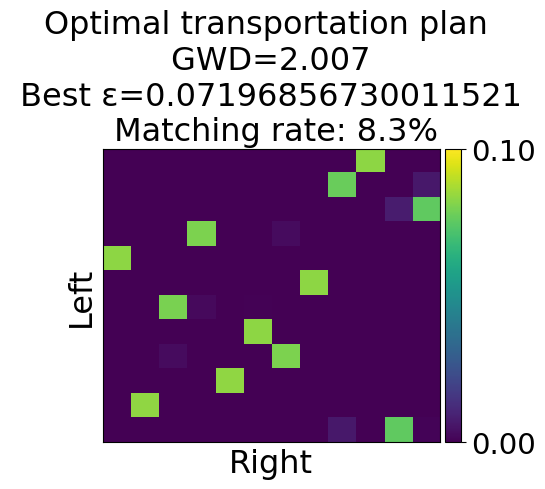

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 1.531


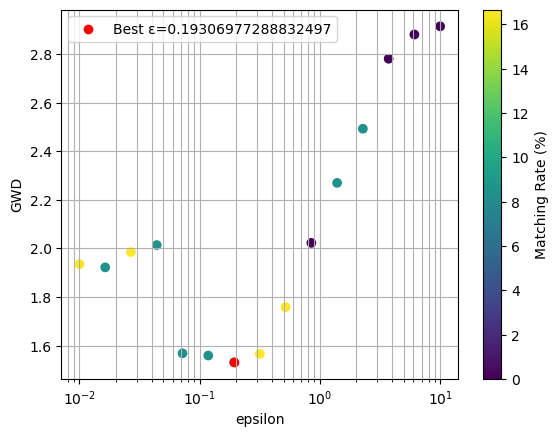

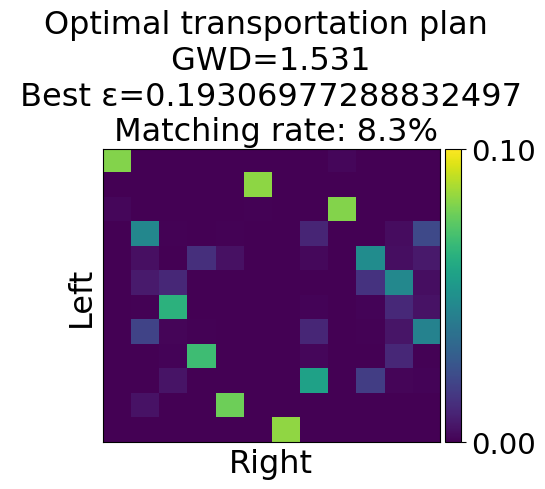

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.043939705607607904, Minimum GWD: 1.715


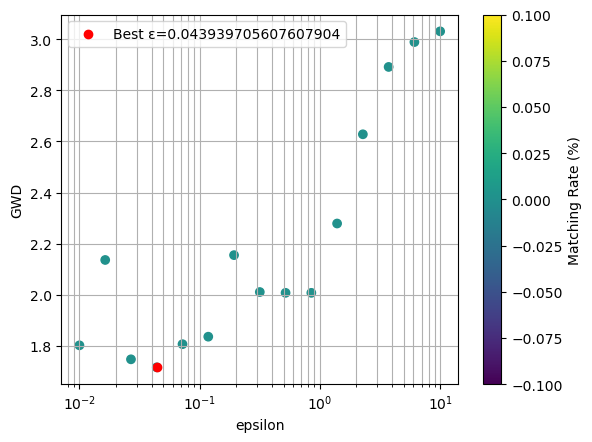

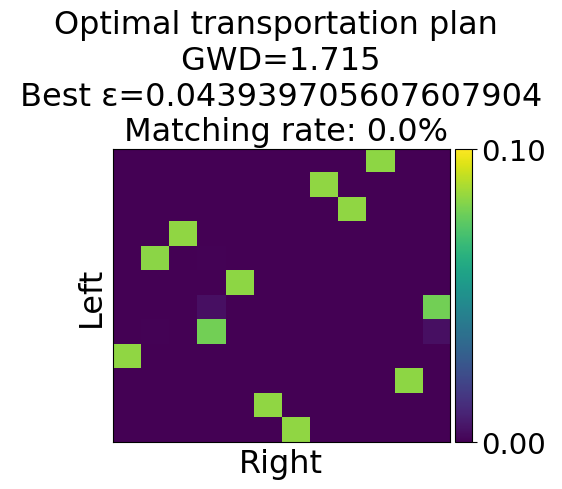

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 1.605


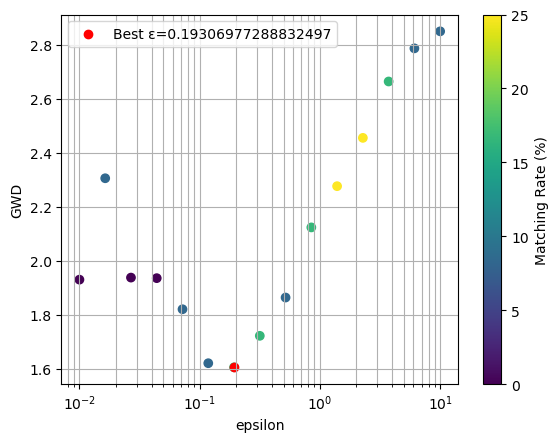

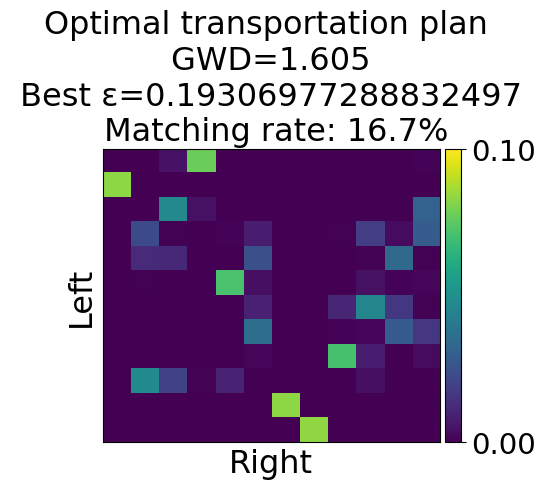

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.043939705607607904, Minimum GWD: 0.902


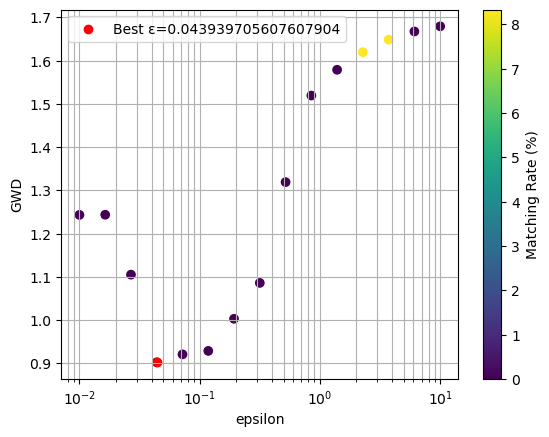

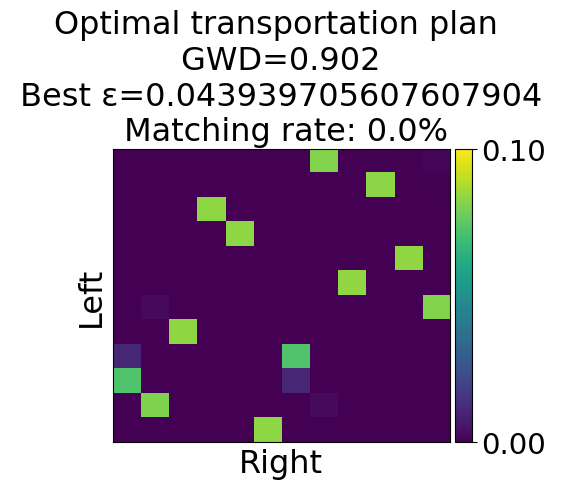

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.11787686347935872, Minimum GWD: 2.083


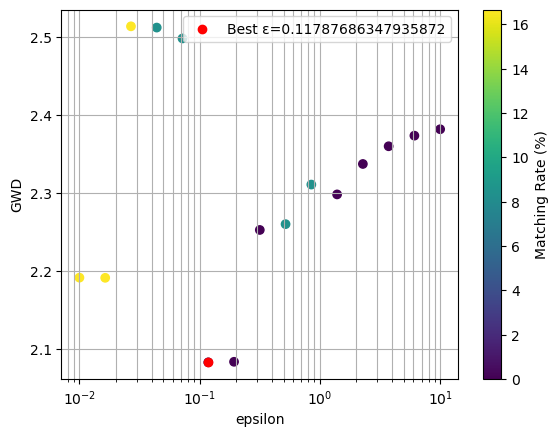

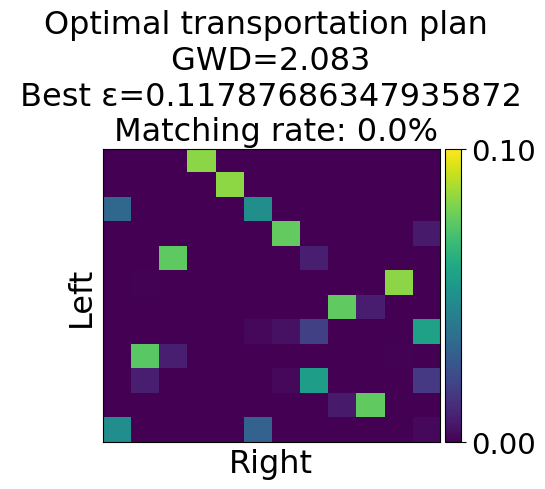

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07196856730011521, Minimum GWD: 0.659


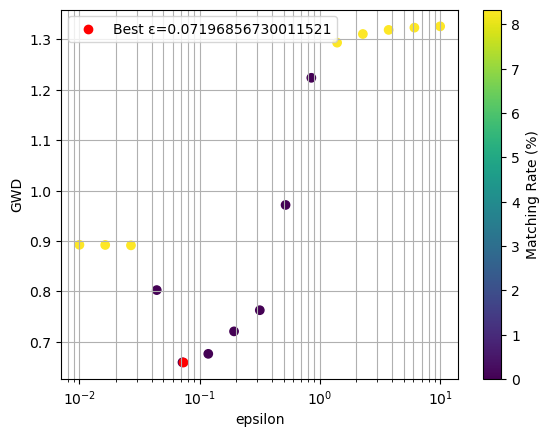

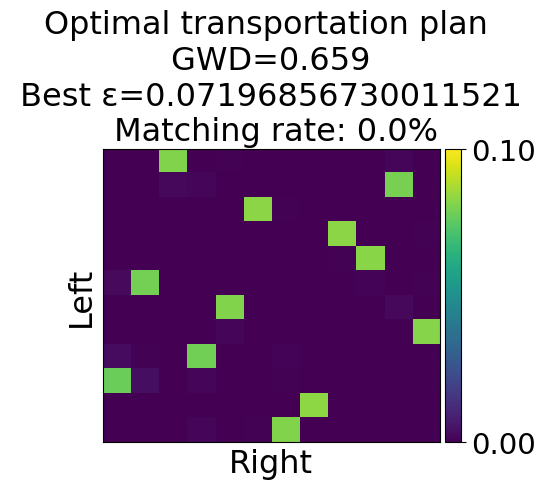

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.016378937069540637, Minimum GWD: 0.524


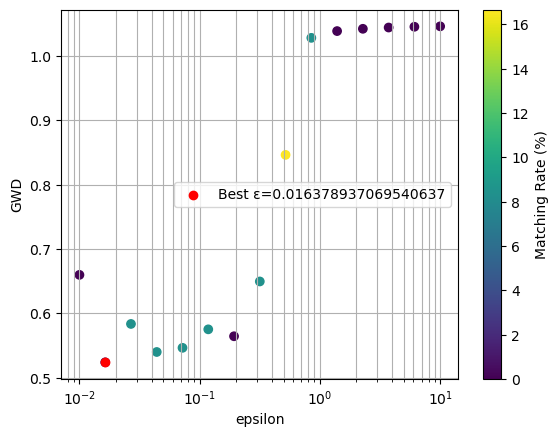

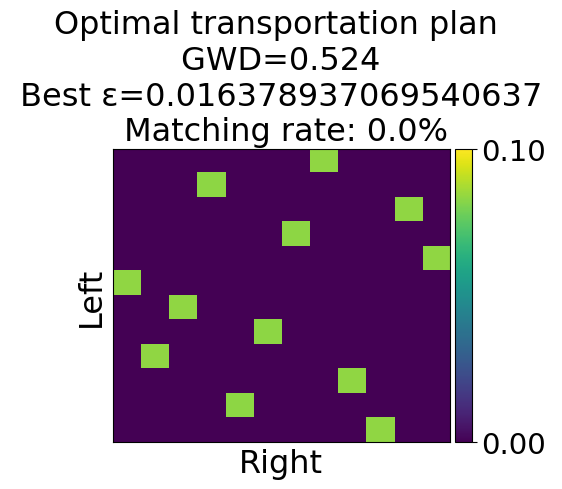

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.016378937069540637, Minimum GWD: 0.879


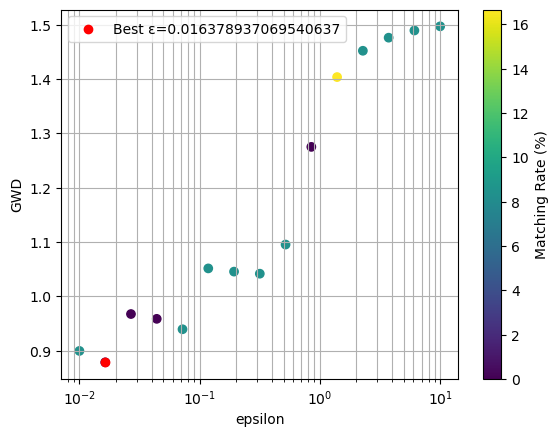

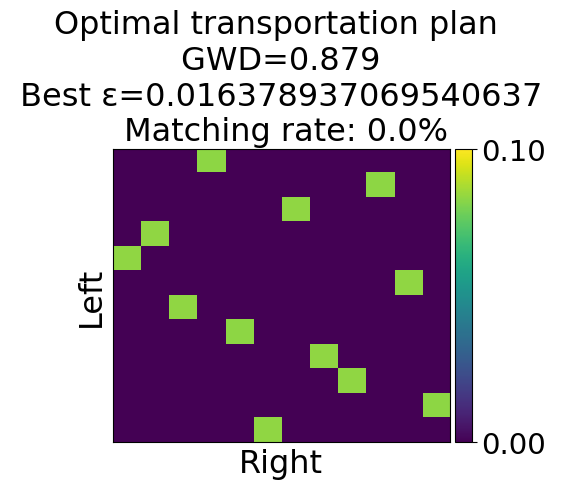

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07196856730011521, Minimum GWD: 1.389


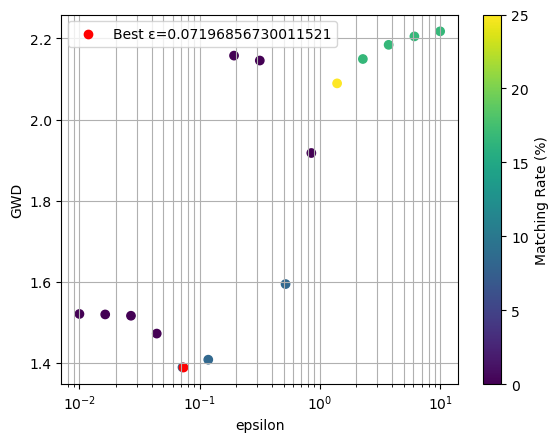

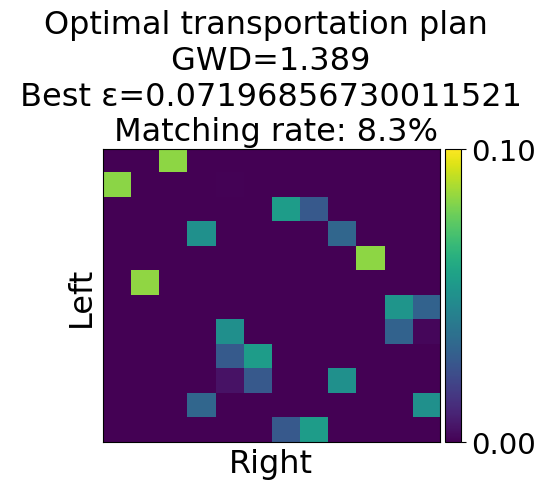

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.043939705607607904, Minimum GWD: 0.969


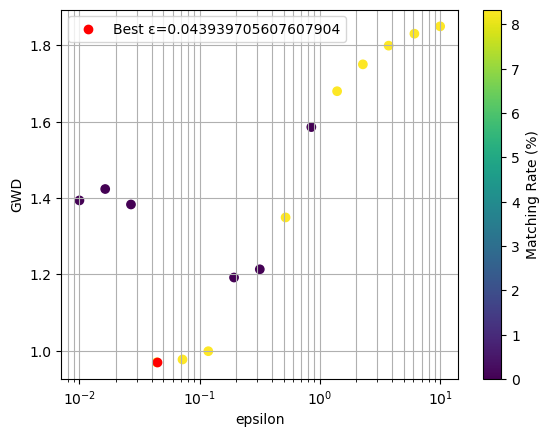

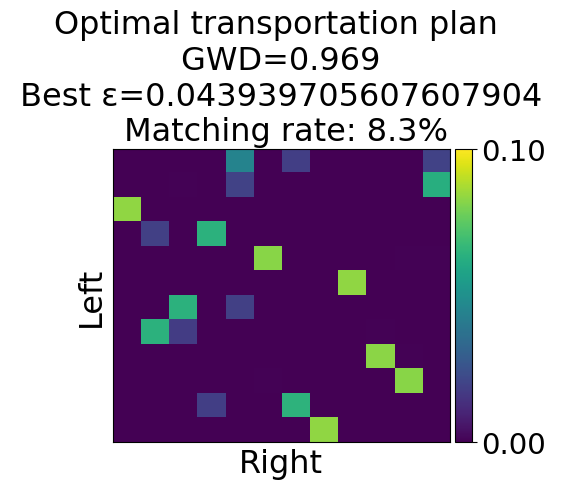

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.02682695795279726, Minimum GWD: 1.248


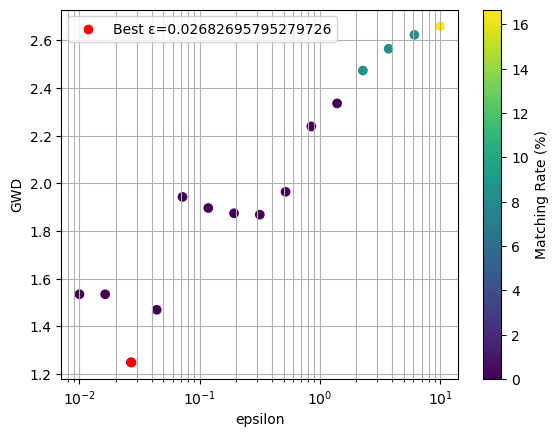

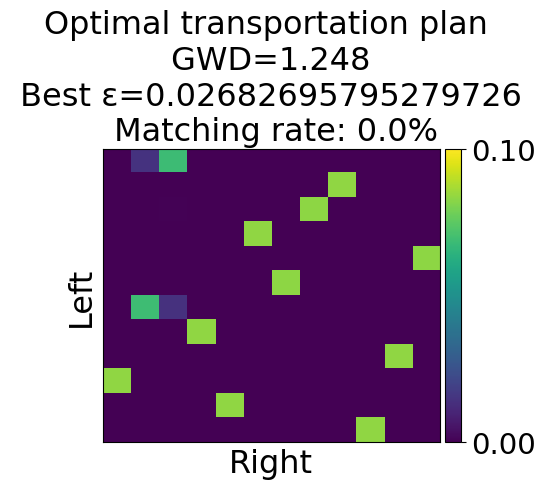

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31622776601683794, Minimum GWD: 0.865


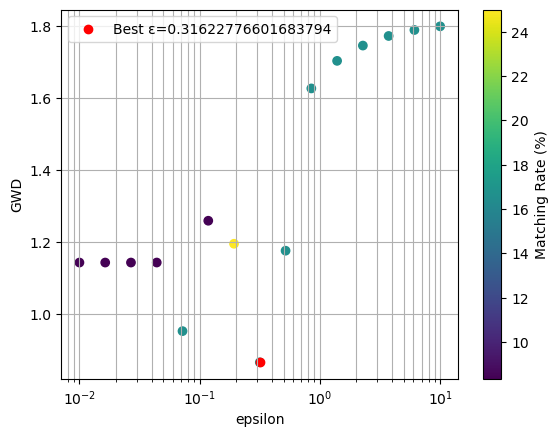

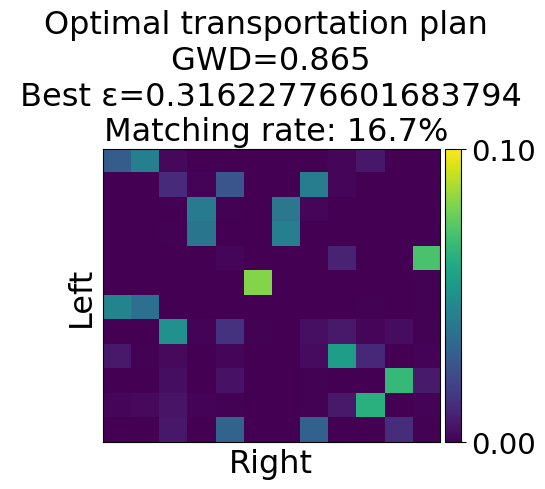

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 1.310


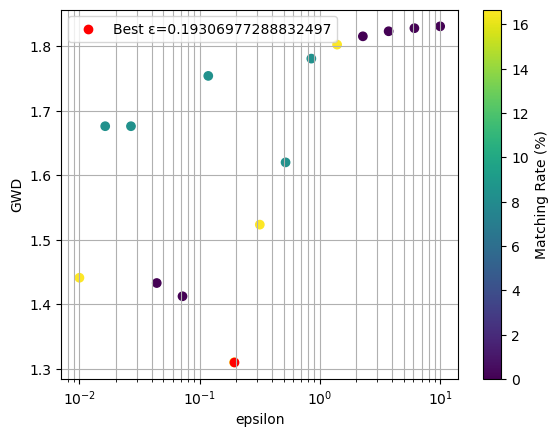

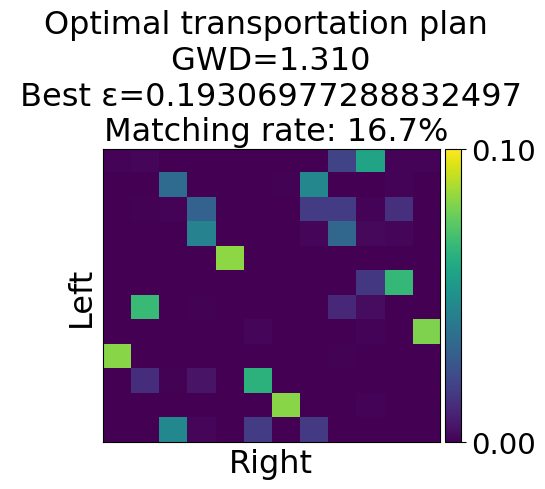

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.02682695795279726, Minimum GWD: 0.894


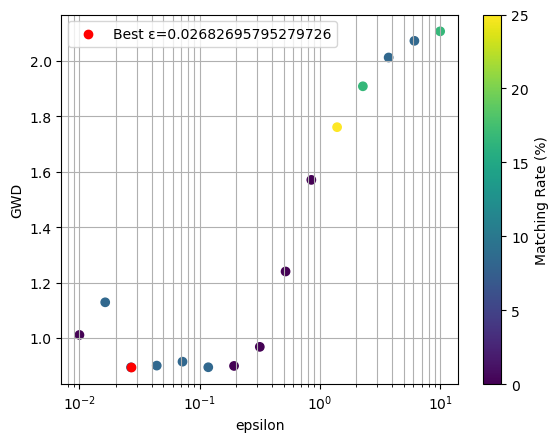

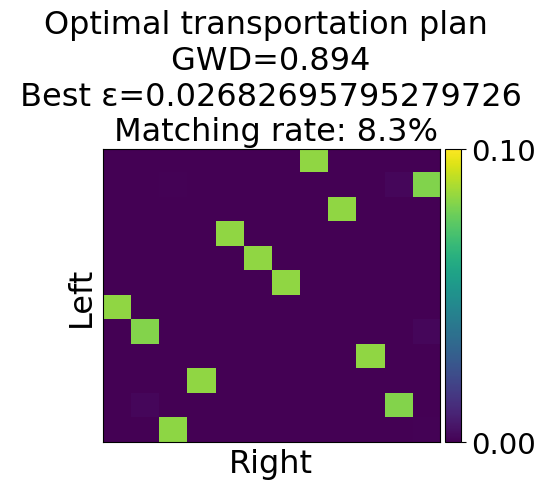

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.517947467923121, Minimum GWD: 1.548


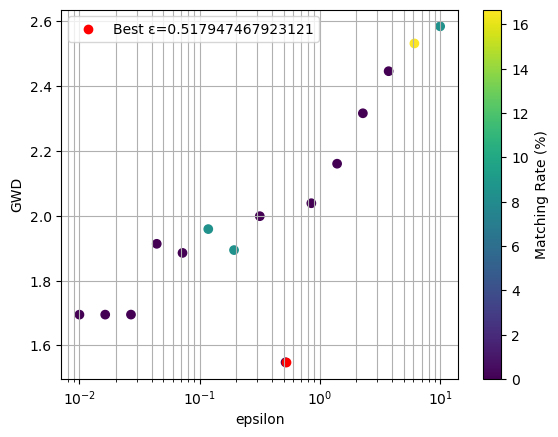

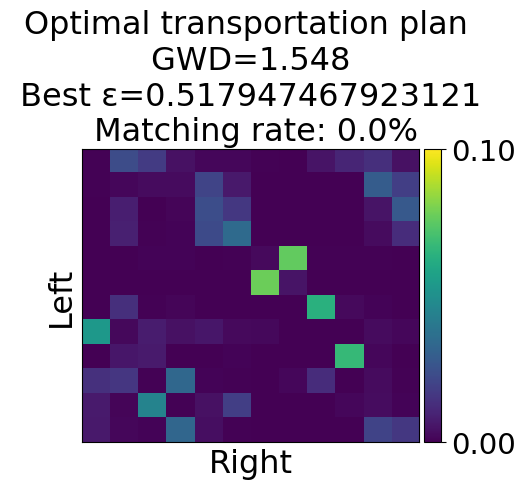

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 0.723


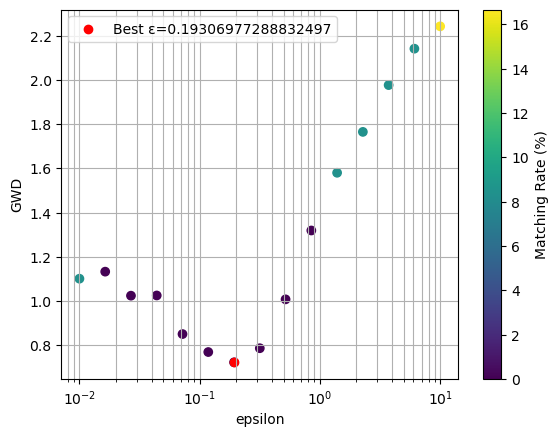

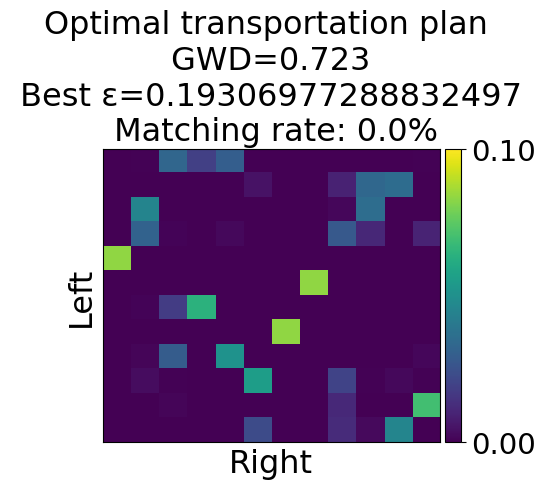

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.043939705607607904, Minimum GWD: 1.464


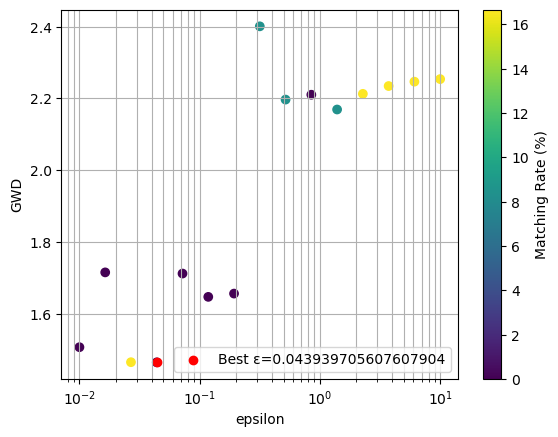

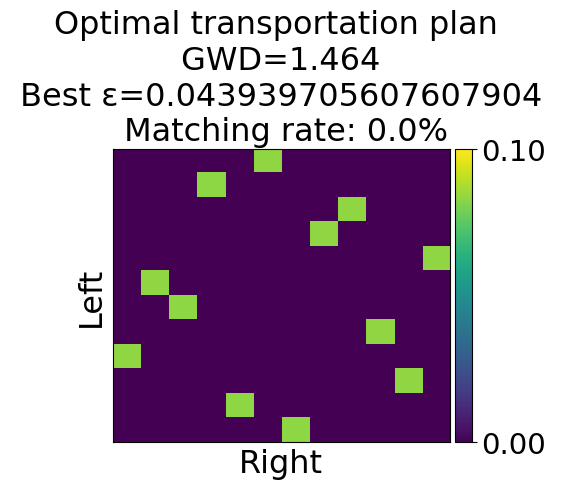

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.02682695795279726, Minimum GWD: 2.245


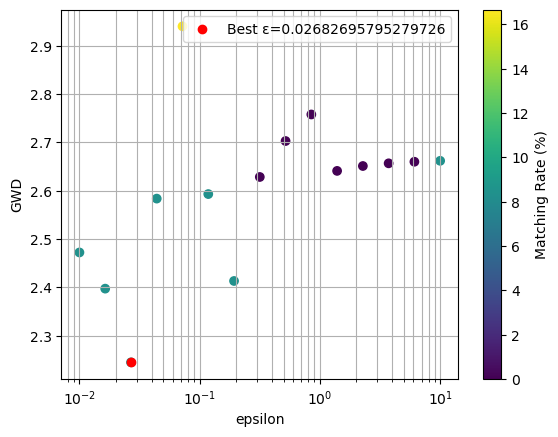

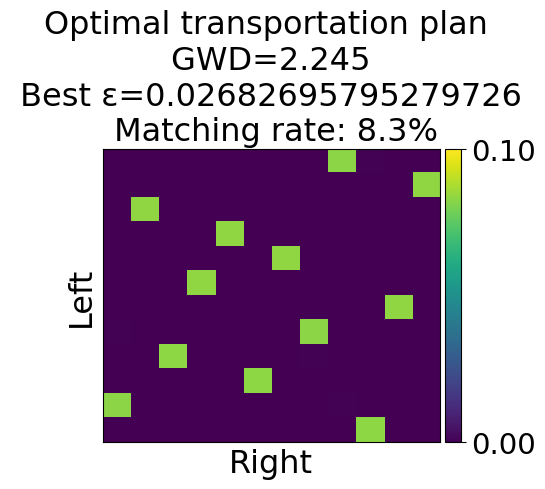

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.3894954943731375, Minimum GWD: 2.609


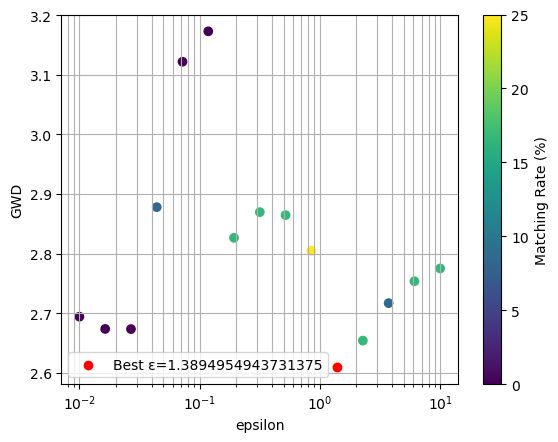

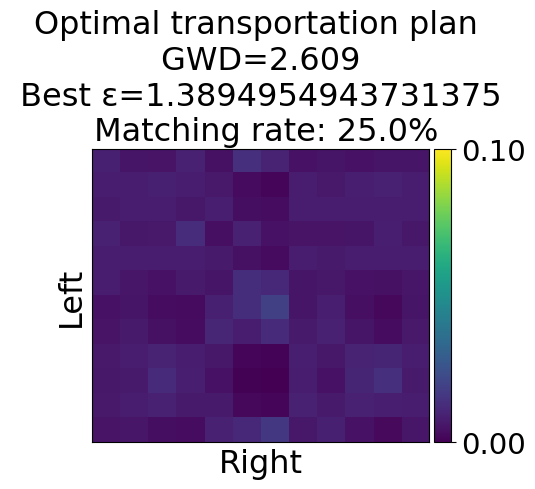

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.11787686347935872, Minimum GWD: 1.217


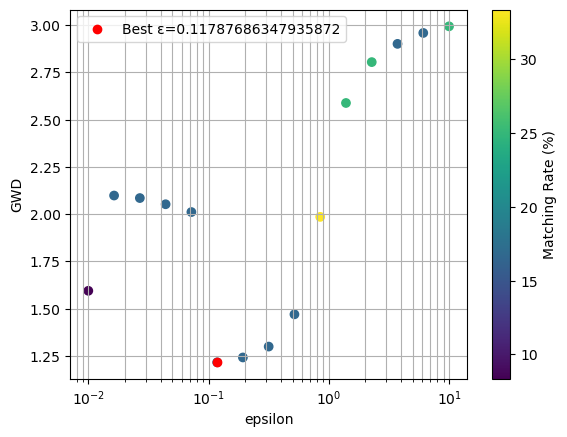

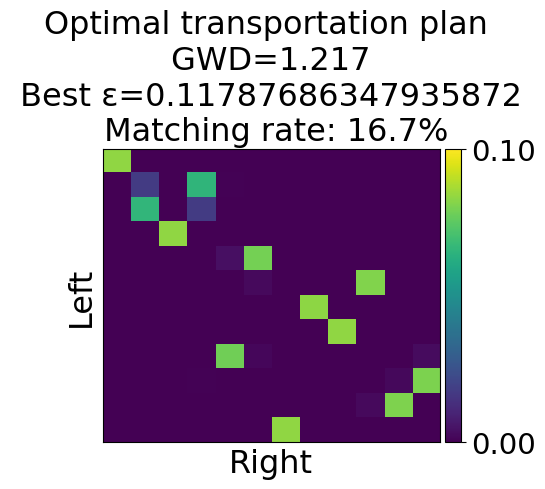

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.11787686347935872, Minimum GWD: 1.514


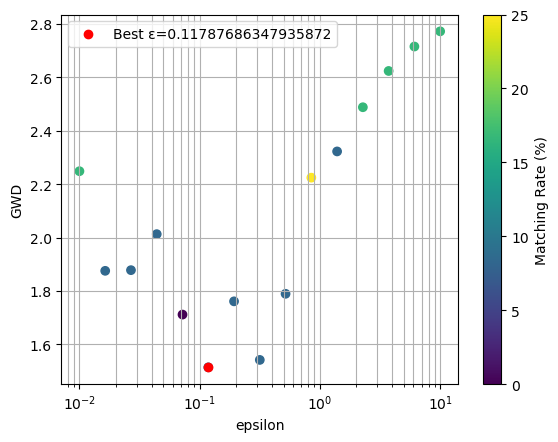

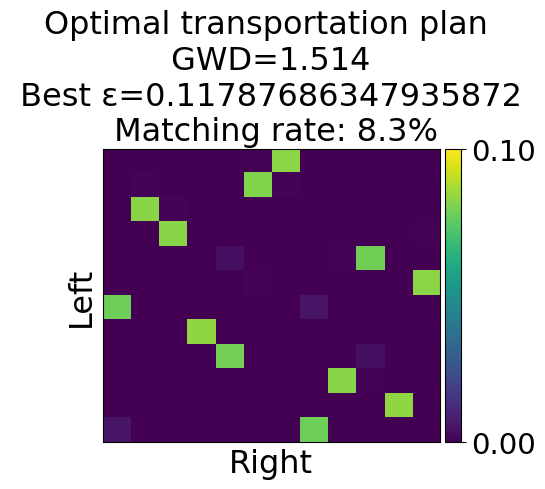

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 0.861


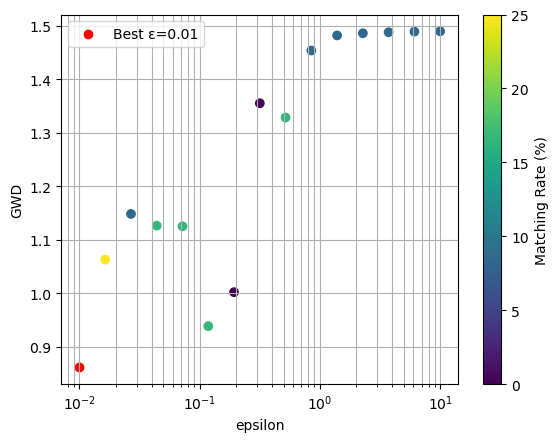

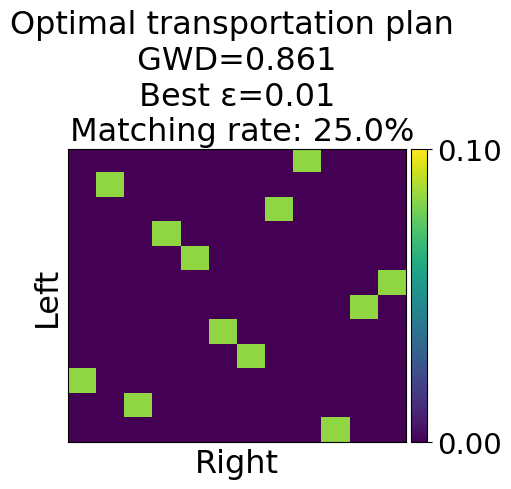

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07196856730011521, Minimum GWD: 0.776


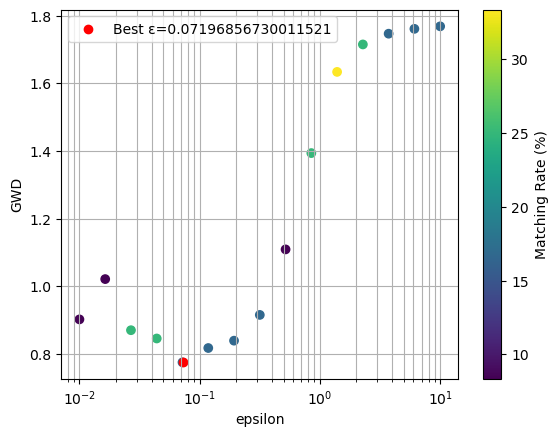

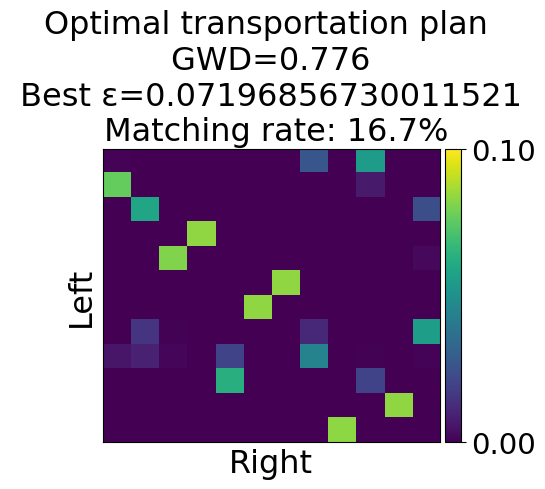

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.517947467923121, Minimum GWD: 1.450


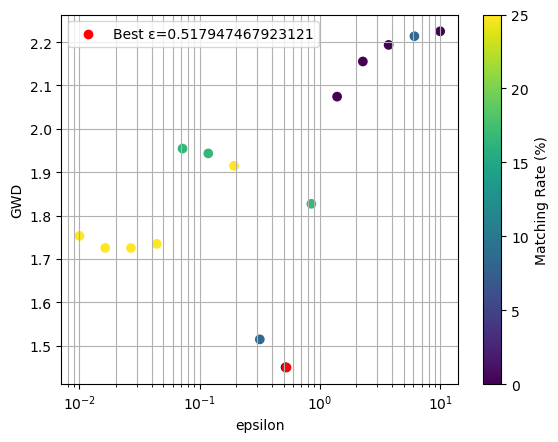

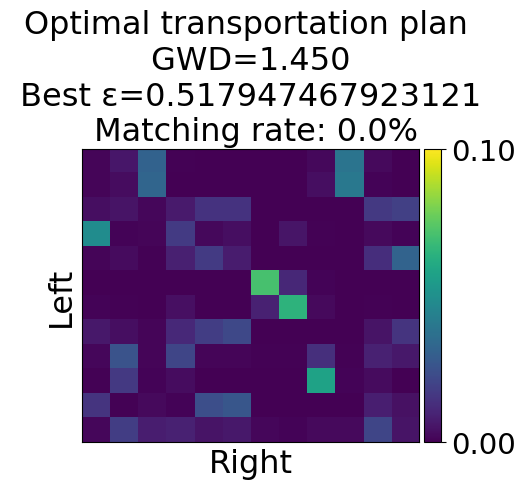

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 0.890


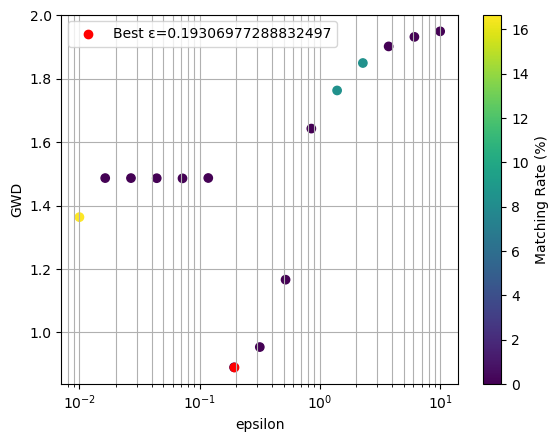

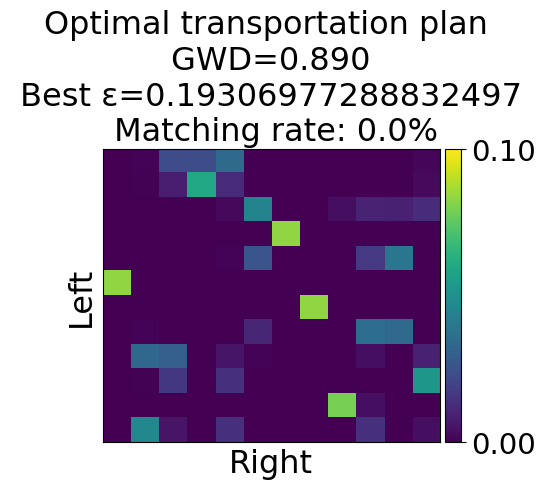

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07196856730011521, Minimum GWD: 0.894


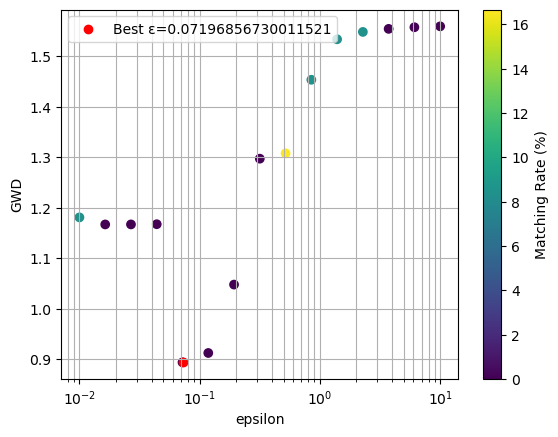

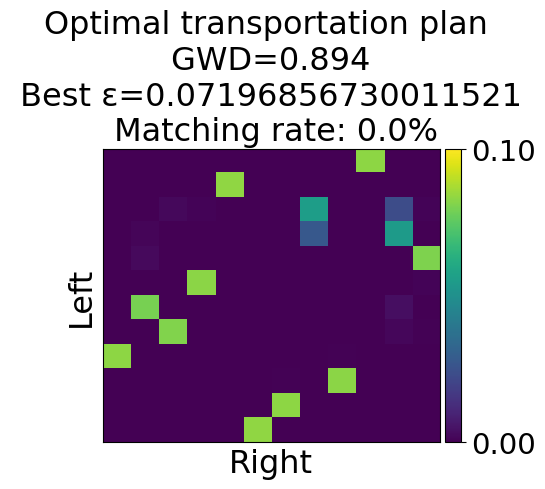

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07196856730011521, Minimum GWD: 2.149


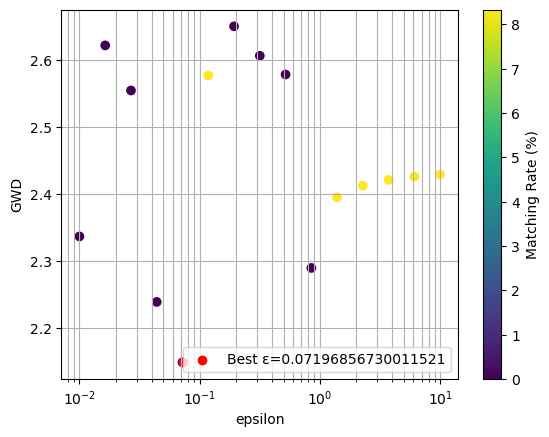

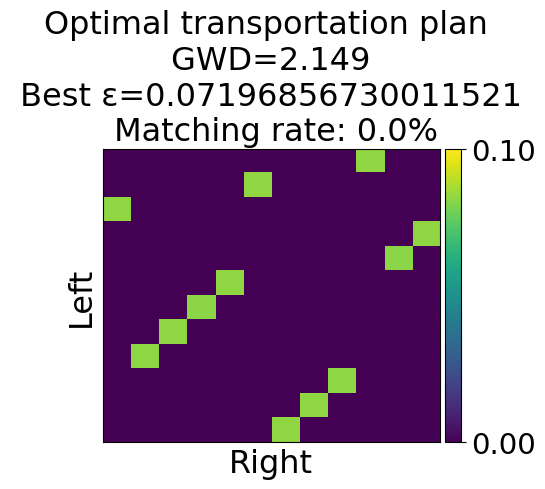

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.11787686347935872, Minimum GWD: 1.652


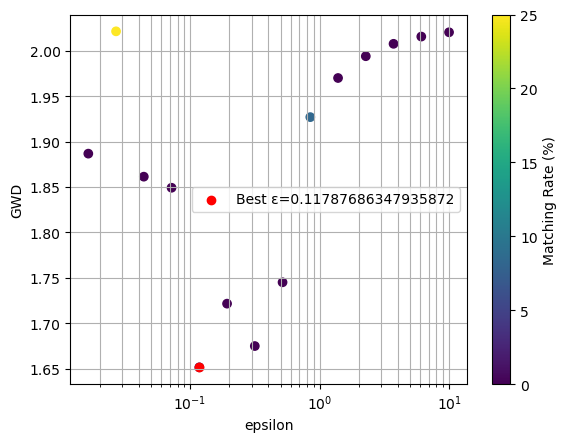

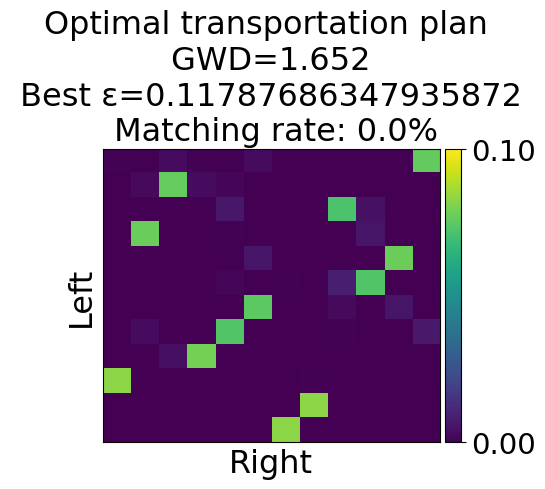

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.517947467923121, Minimum GWD: 1.383


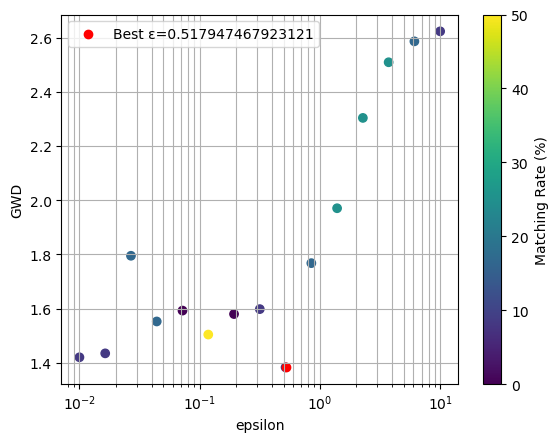

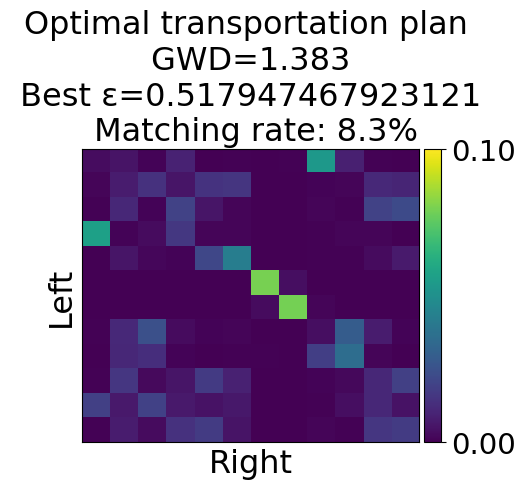

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.043939705607607904, Minimum GWD: 1.180


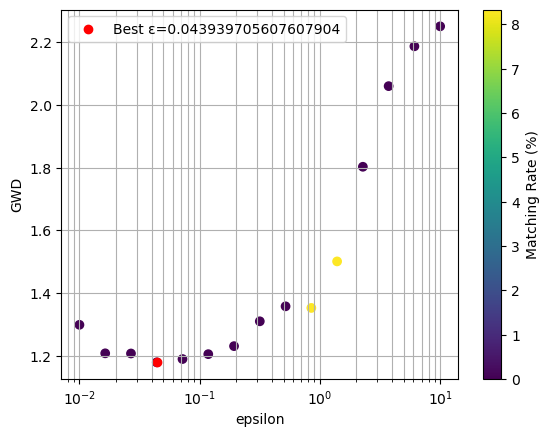

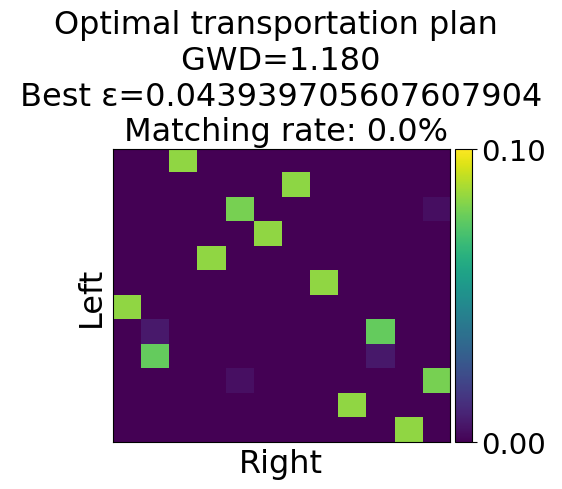

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 1.240


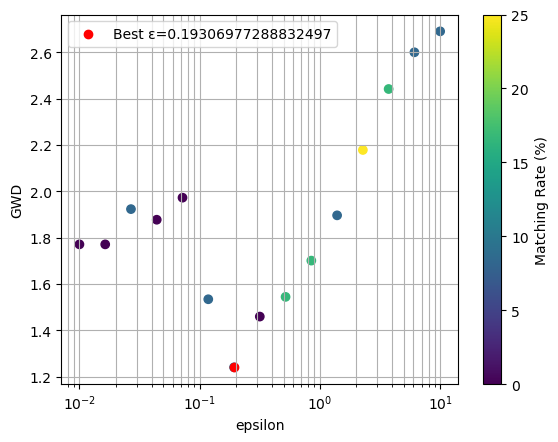

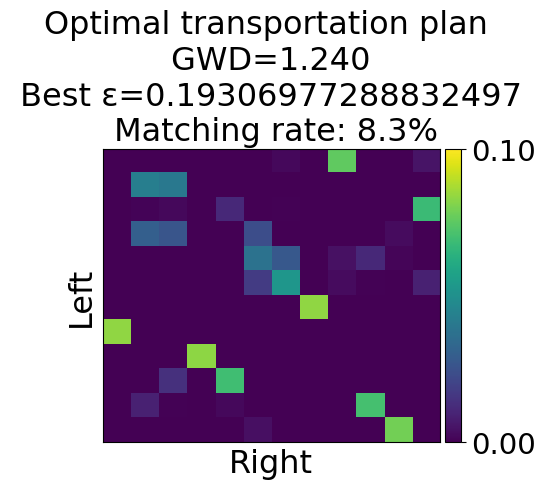

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 1.3894954943731375, Minimum GWD: 4.042


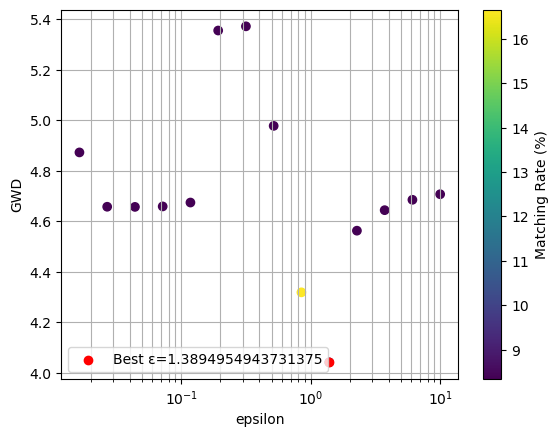

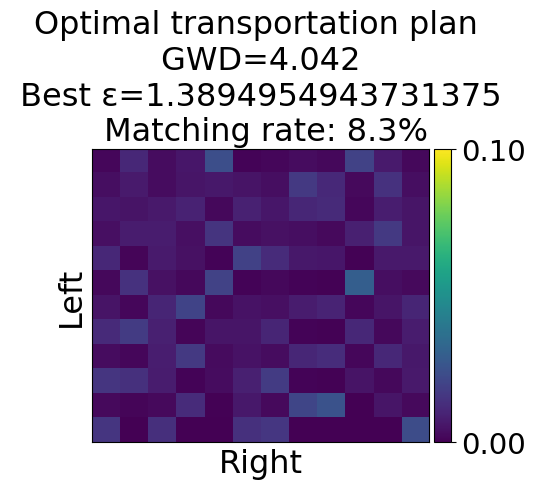

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 2.654


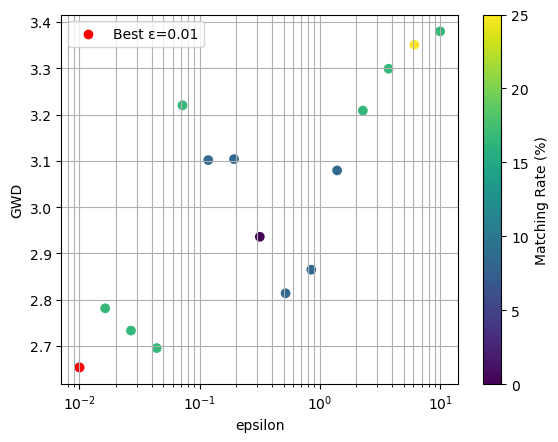

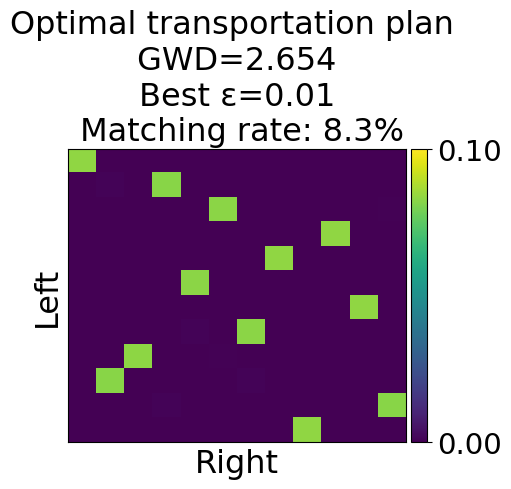

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 1
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/backend.py:1165: RuntimeWarning: overflow encountered in exp
  return np.exp(a)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-

Best epsilon: 0.01, Minimum GWD: nan


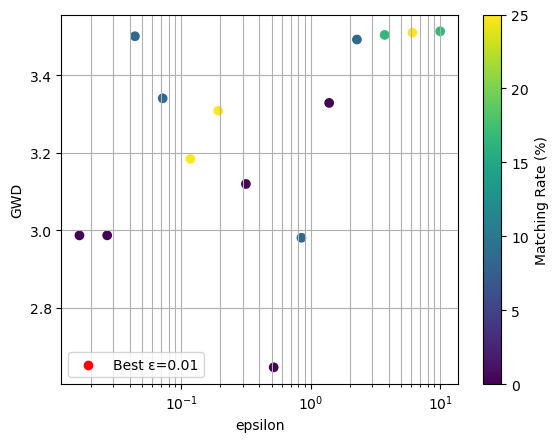

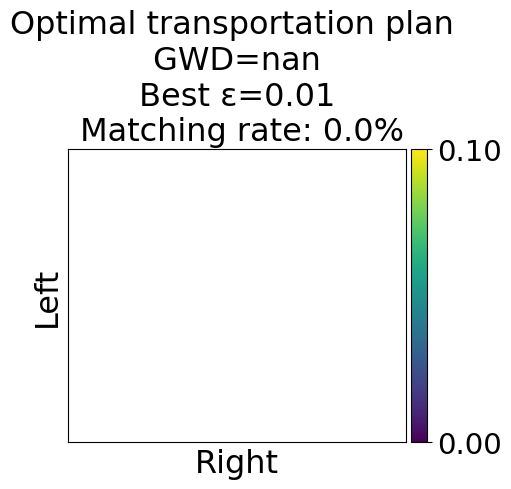

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.517947467923121, Minimum GWD: 2.735


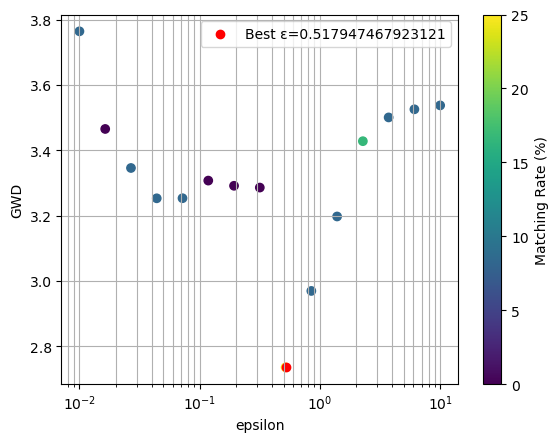

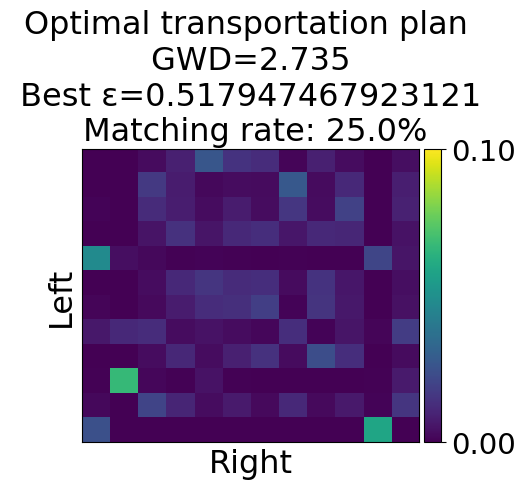

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Skipping epsilon=0.01 because it results in a zero transportation matrix.
Best epsilon: 0.31622776601683794, Minimum GWD: 2.661


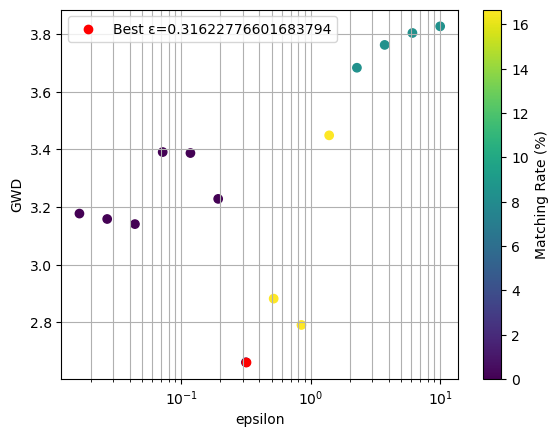

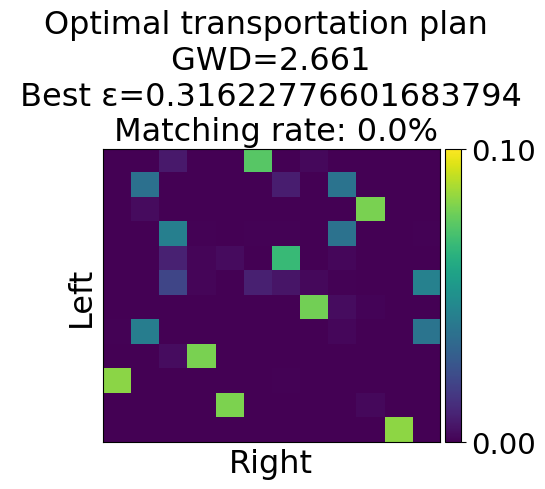

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.8483428982440717, Minimum GWD: 3.475


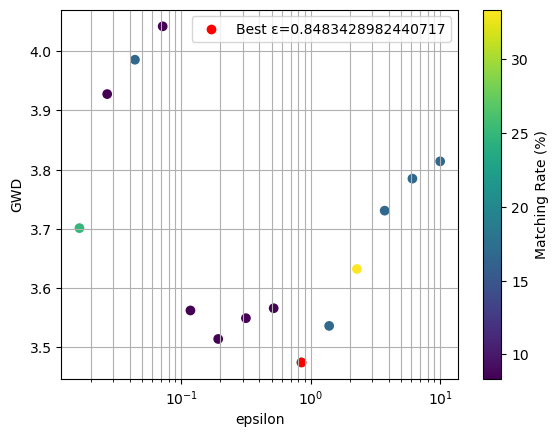

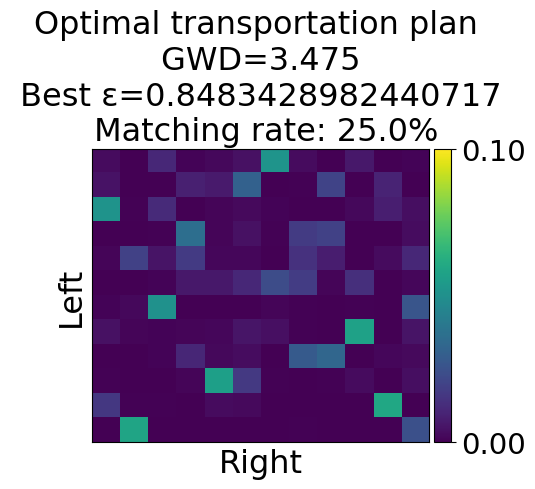

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:632: RuntimeWarning: divide by zero encountered in divide
  u = 1.0 / nx.dot(Kp, v)
/opt/anaconda3/envs

Best epsilon: 0.016378937069540637, Minimum GWD: 0.000


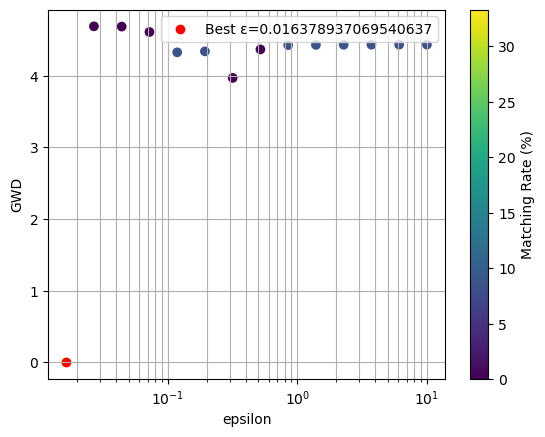

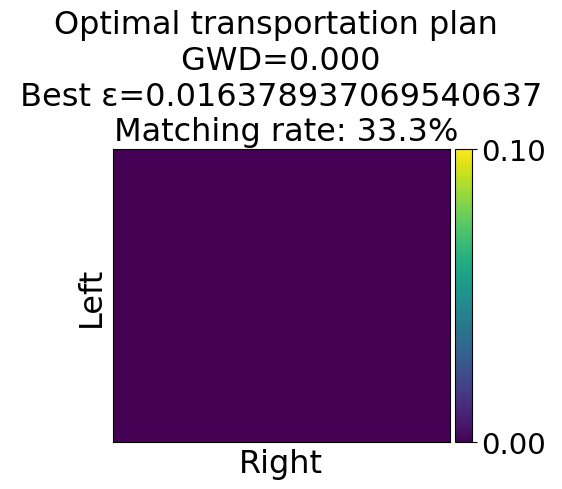

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.043939705607607904, Minimum GWD: 1.620


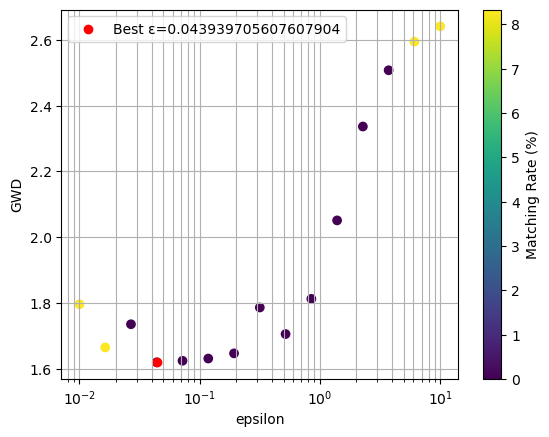

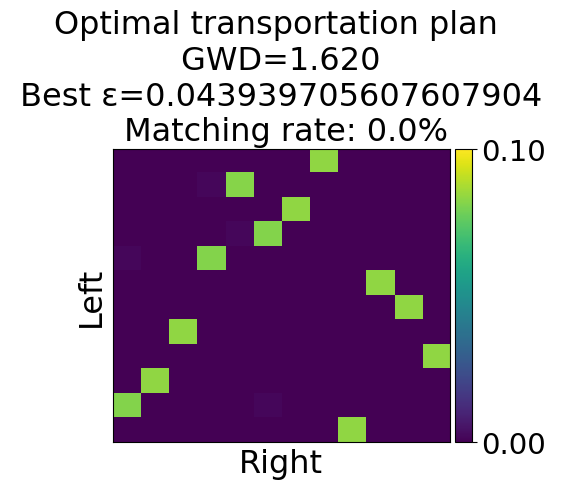

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Skipping epsilon=0.01 because it results in a zero transportation matrix.
Best epsilon: 0.19306977288832497, Minimum GWD: 2.239


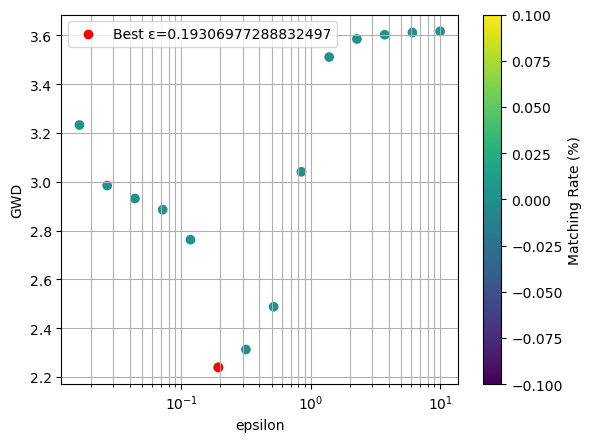

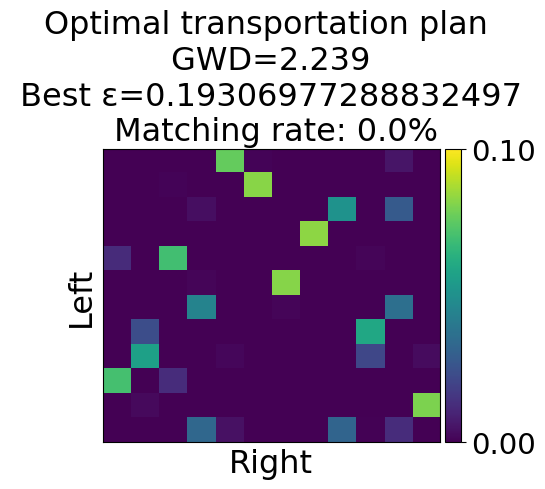

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Skipping epsilon=0.01 because it results in a zero transportation matrix.
Best epsilon: 0.043939705607607904, Minimum GWD: 3.534


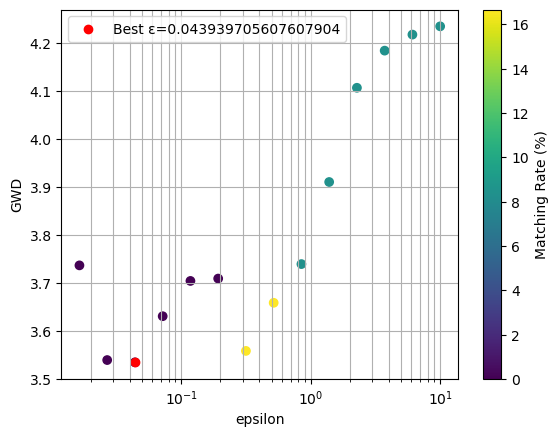

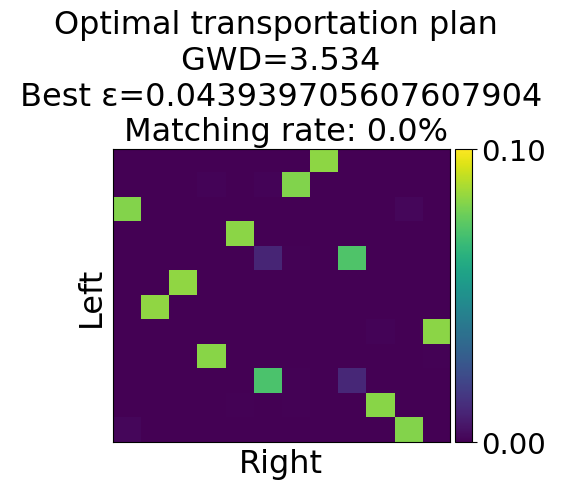

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 0.19306977288832497, Minimum GWD: 3.159


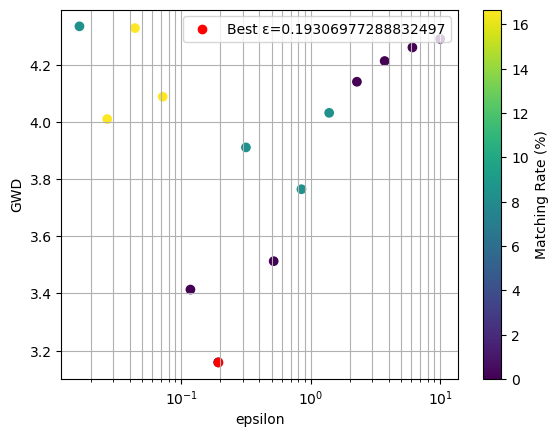

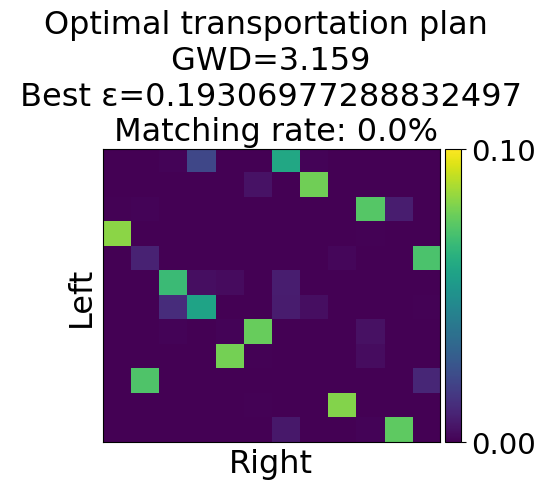

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 0.043939705607607904, Minimum GWD: 1.868


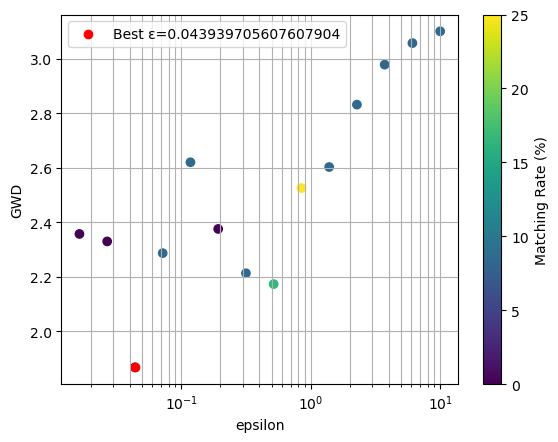

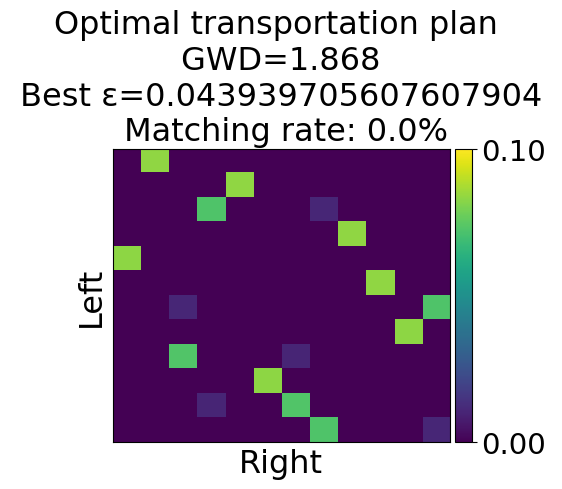

Skipping epsilon=0.01 because it results in a zero transportation matrix.
Skipping epsilon=0.016378937069540637 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:632: RuntimeWarning: divide by zero encountered in divide
  u = 1.0 / nx.dot(Kp, v)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterati

Best epsilon: 0.07196856730011521, Minimum GWD: 5.861


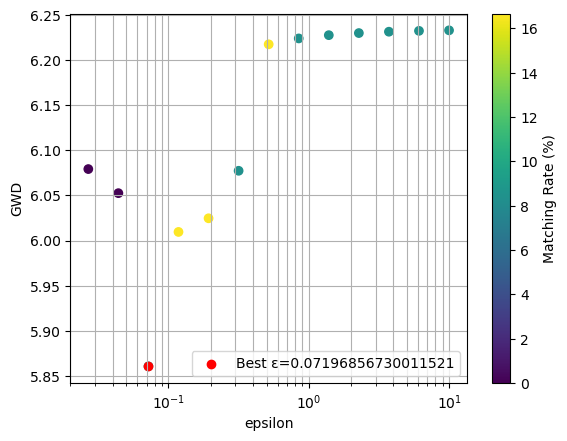

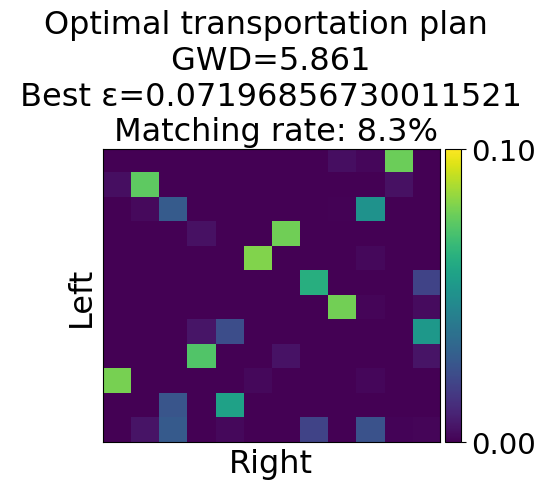

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.11787686347935872, Minimum GWD: 1.170


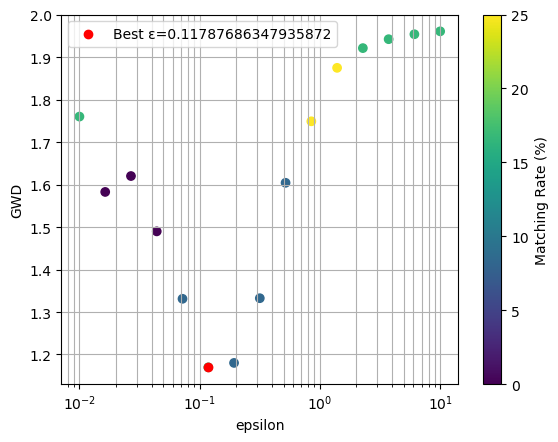

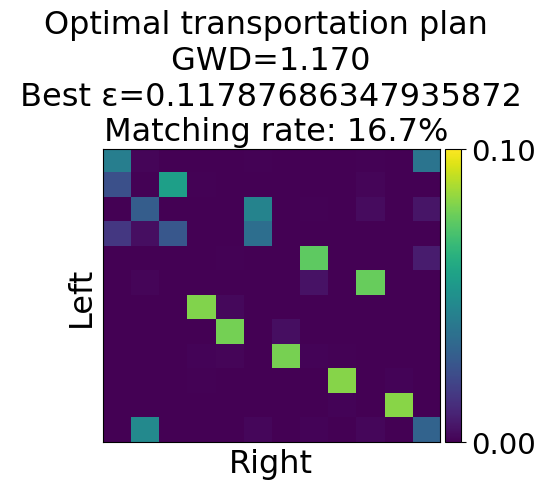

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07196856730011521, Minimum GWD: 1.261


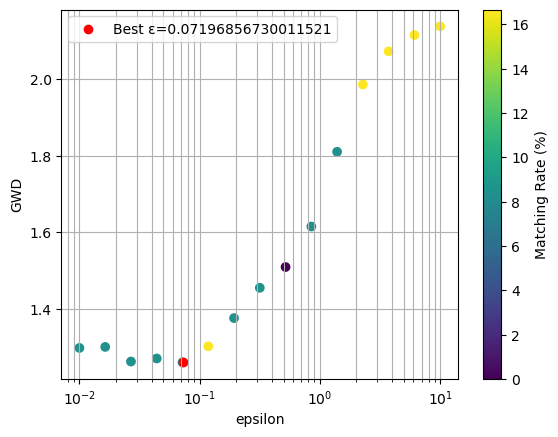

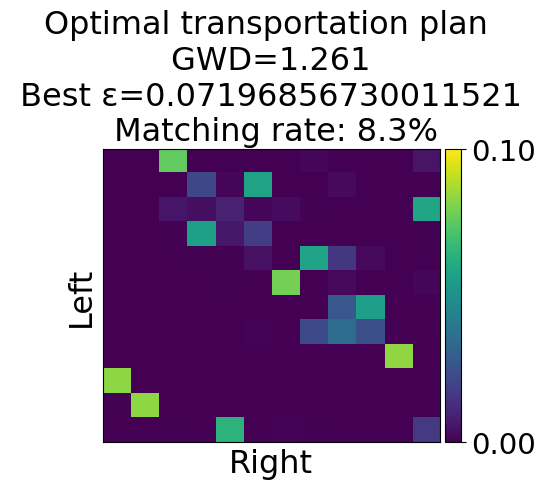

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 1.605


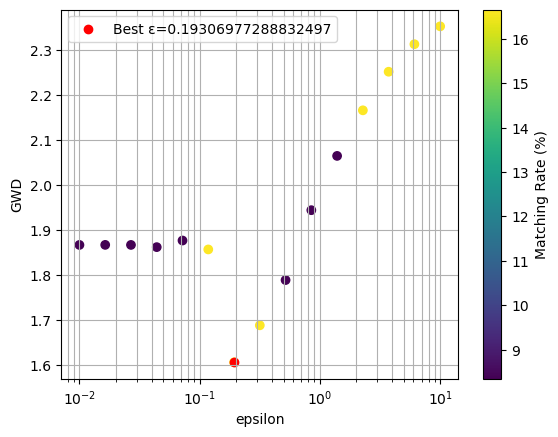

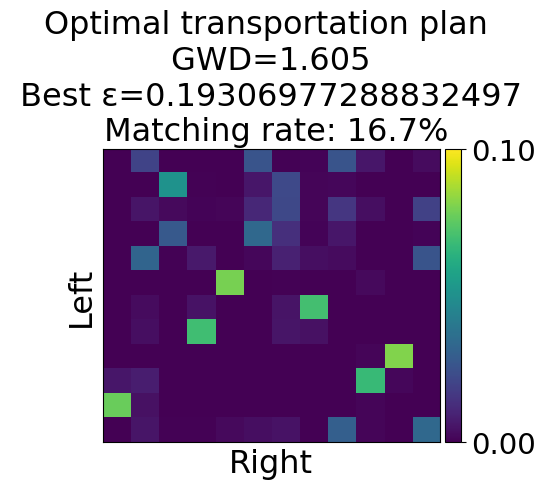

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.043939705607607904, Minimum GWD: 0.788


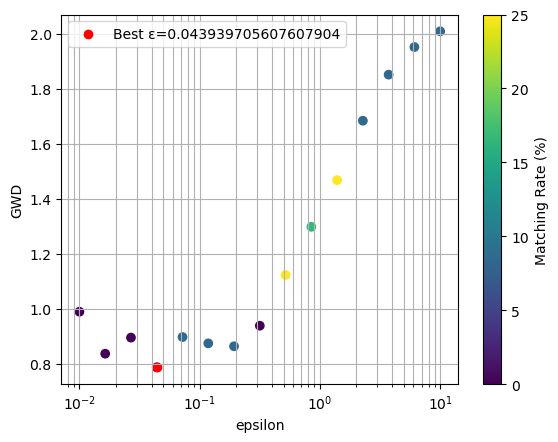

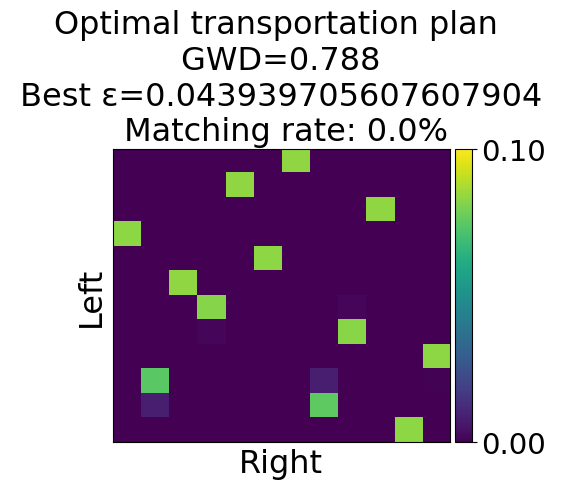

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:632: RuntimeWarning: divide by zero encountered in divide
  u = 1.0 / nx.dot(Kp, v)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 0.000


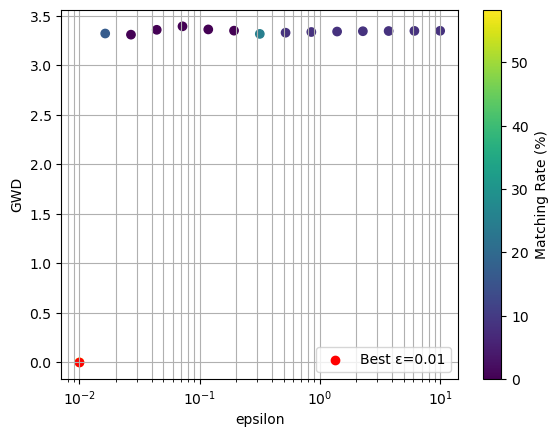

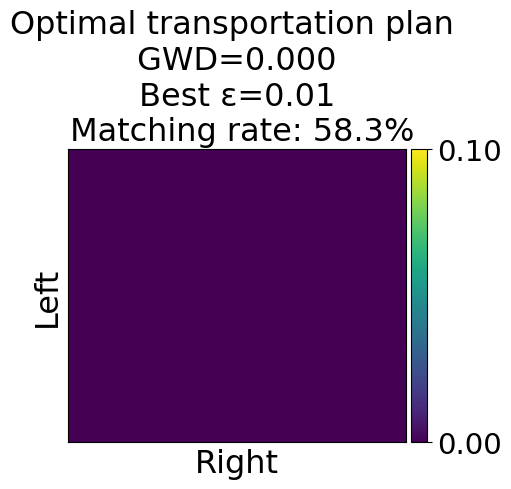

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.11787686347935872, Minimum GWD: 0.852


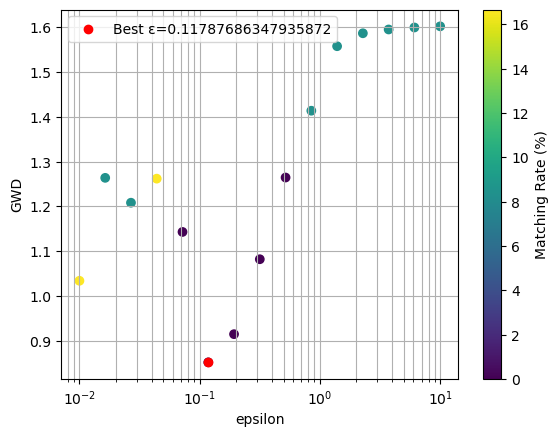

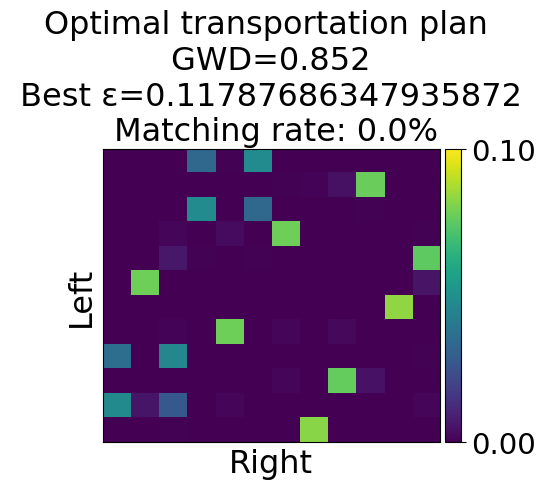

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 1.125


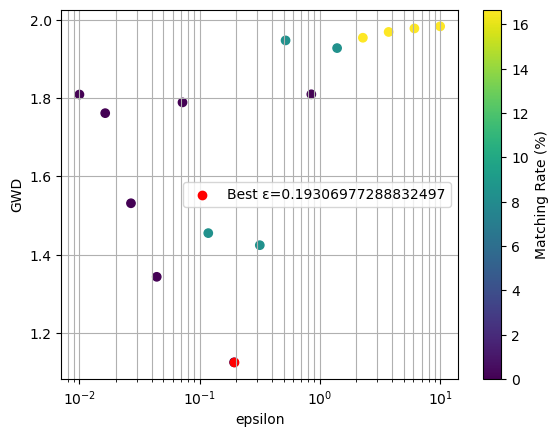

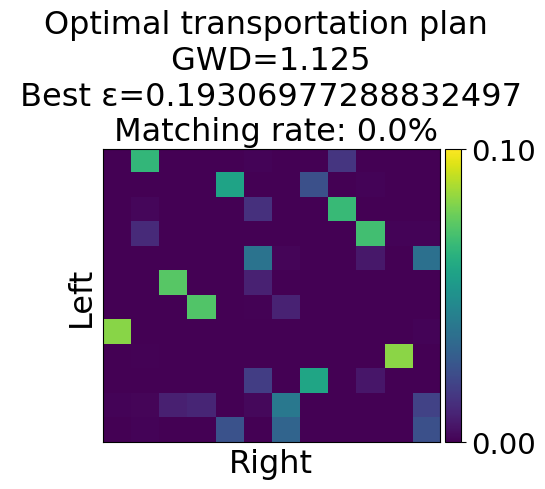

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.016378937069540637, Minimum GWD: 2.063


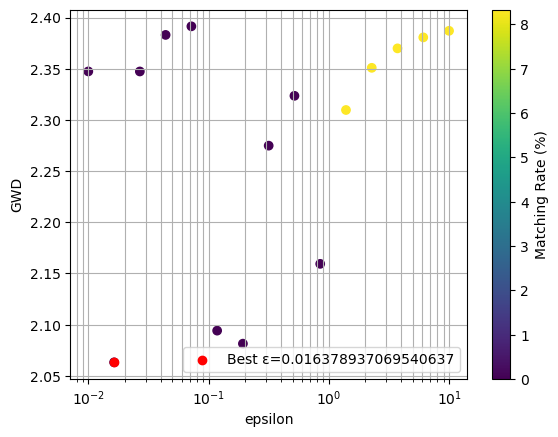

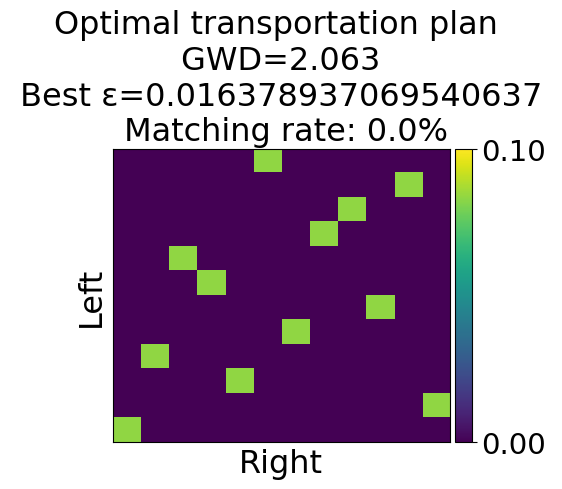

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 1.976


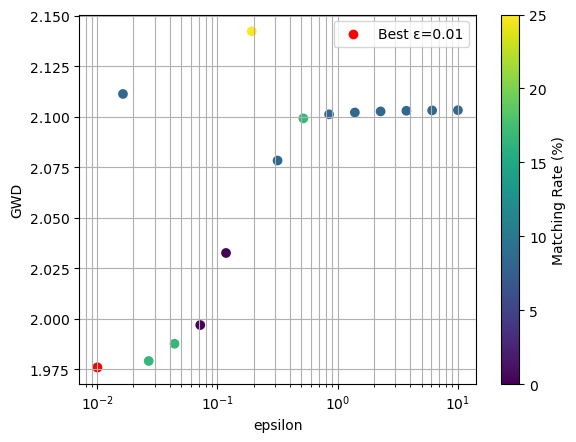

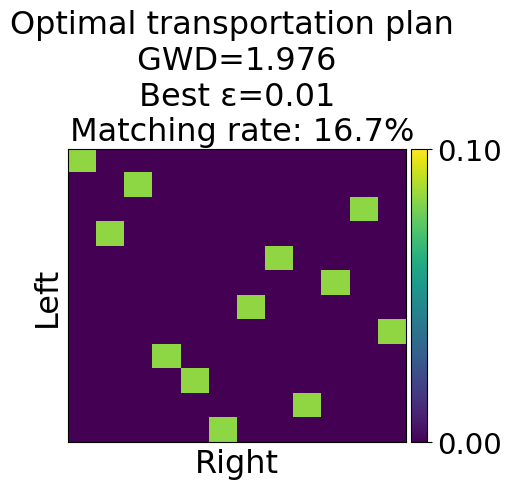

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07196856730011521, Minimum GWD: 0.705


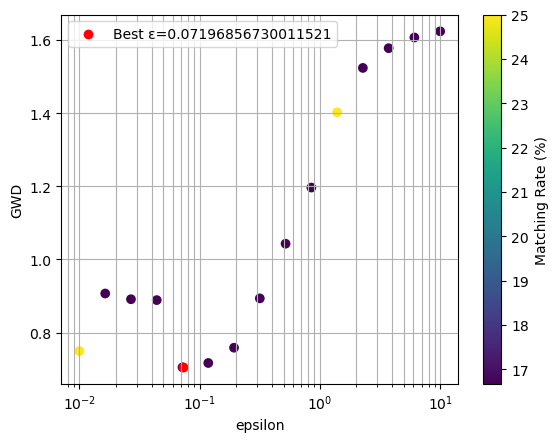

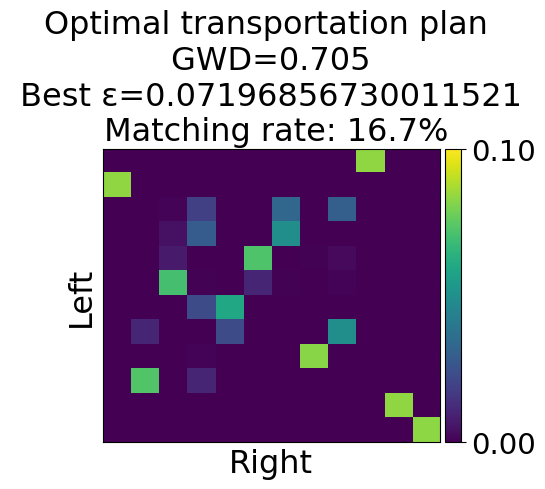

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.016378937069540637, Minimum GWD: 1.578


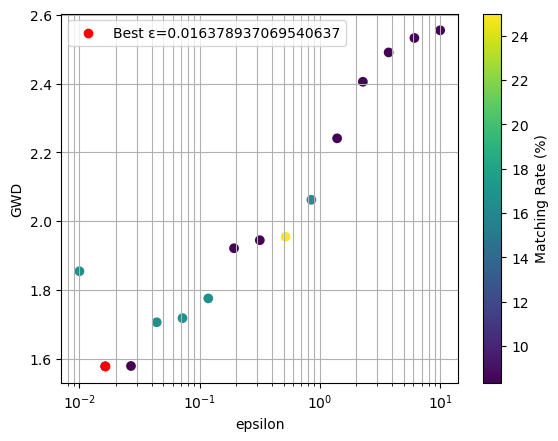

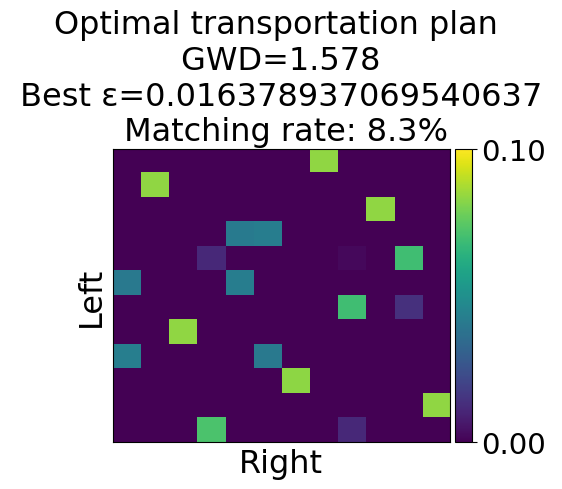

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.02682695795279726, Minimum GWD: 1.120


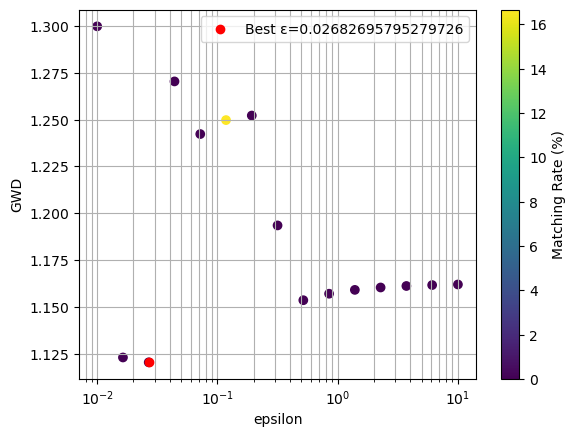

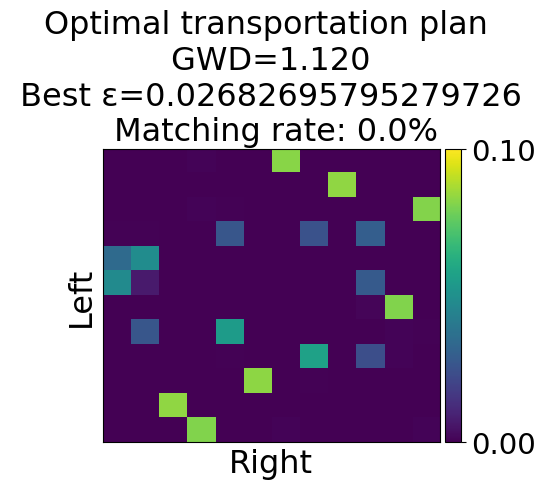

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.043939705607607904, Minimum GWD: 1.456


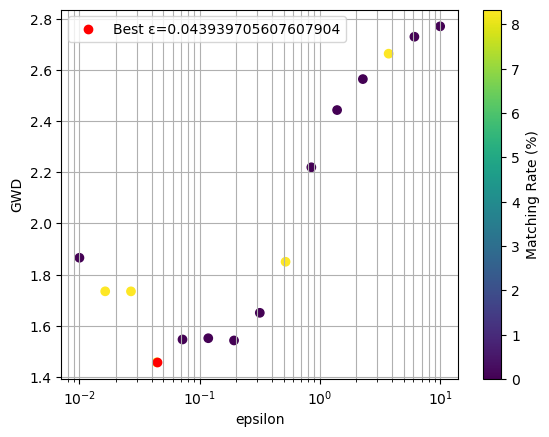

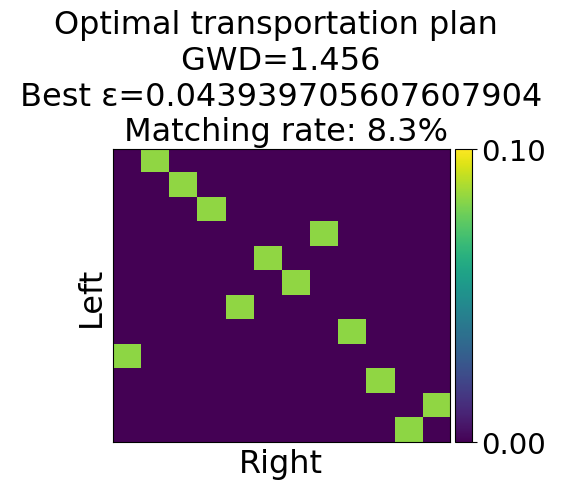

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:632: RuntimeWarning: divide by zero encountered in divide
  u = 1.0 / nx.dot(Kp, v)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 0.000


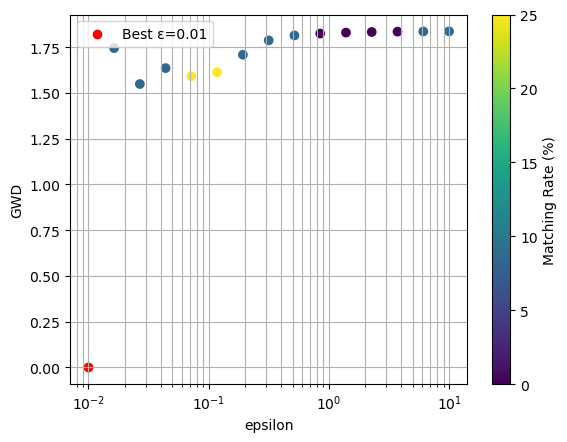

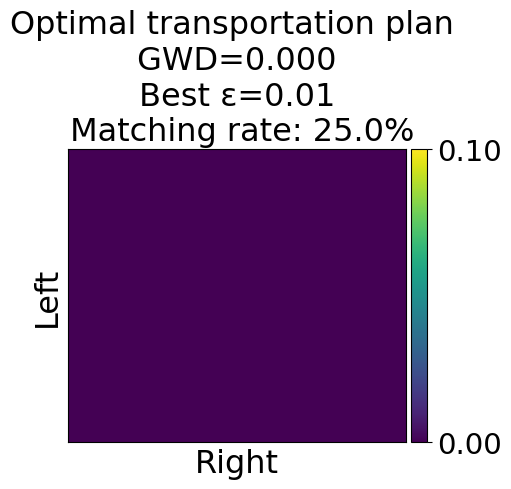

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:632: RuntimeWarning: divide by zero encountered in divide
  u = 1.0 / nx.dot(Kp, v)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 0.000


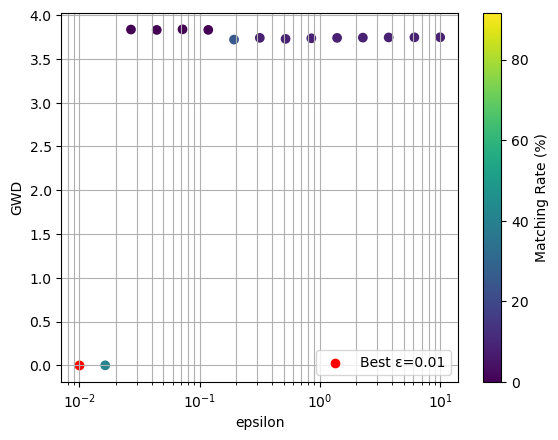

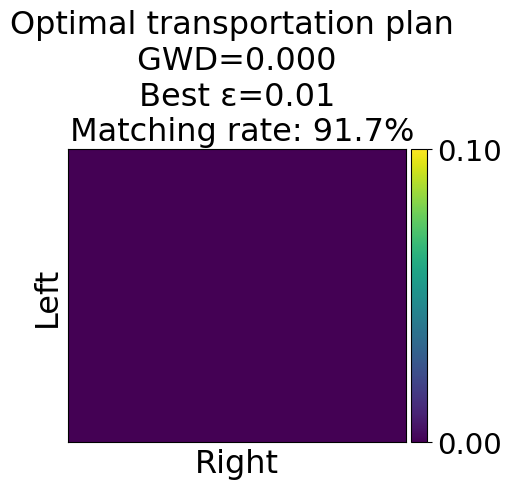

In [14]:
# --- 1. Compute GWOT within each cluster ---
within_cluster_distances = []

# Cluster 1 within-pairs
for matrix_1, matrix_2 in itertools.combinations(cluster_1_matrices_preference_distance, 2):
    _, _, _, min_gwd = GWD_and_plot(matrix_1, matrix_2, epsilons)
    within_cluster_distances.append(min_gwd)

# Cluster 2 within-pairs
for matrix_1, matrix_2 in itertools.combinations(cluster_2_matrices_preference_distance, 2):
    _, _, _, min_gwd = GWD_and_plot(matrix_1, matrix_2, epsilons)
    within_cluster_distances.append(min_gwd)

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(


Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.016378937069540637, Minimum GWD: 3.427


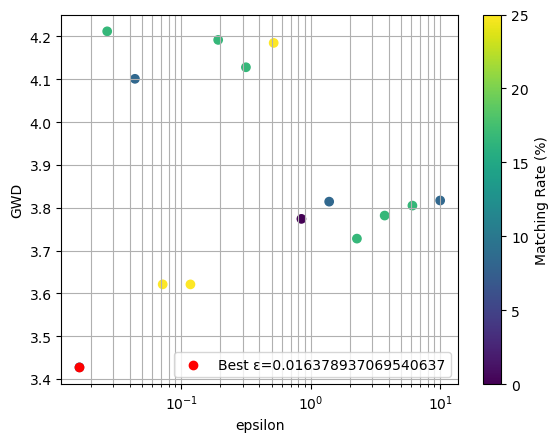

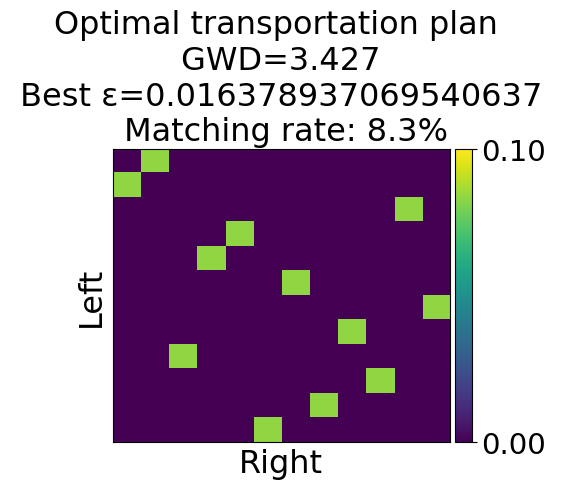

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.016378937069540637, Minimum GWD: 1.451


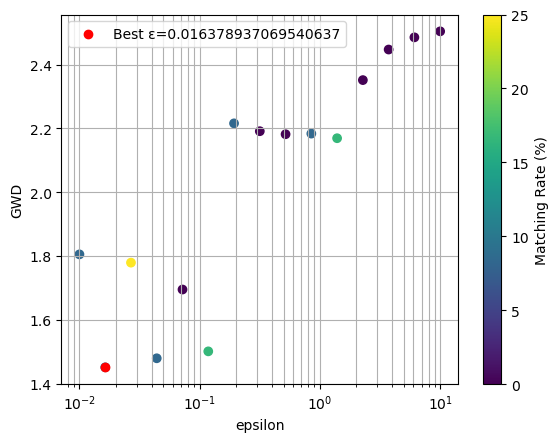

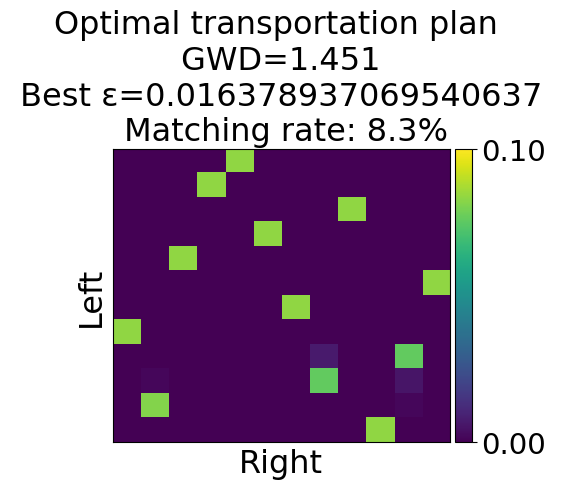

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 0.709


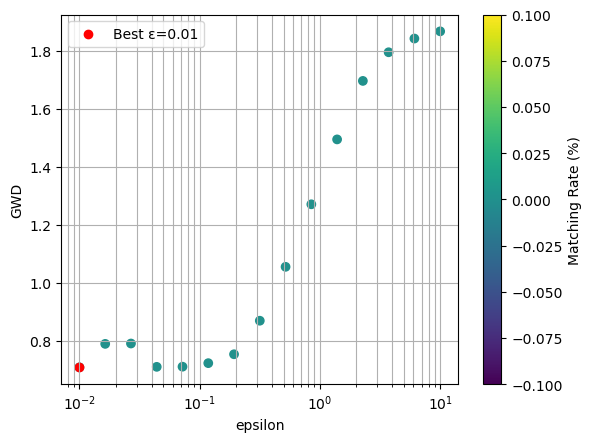

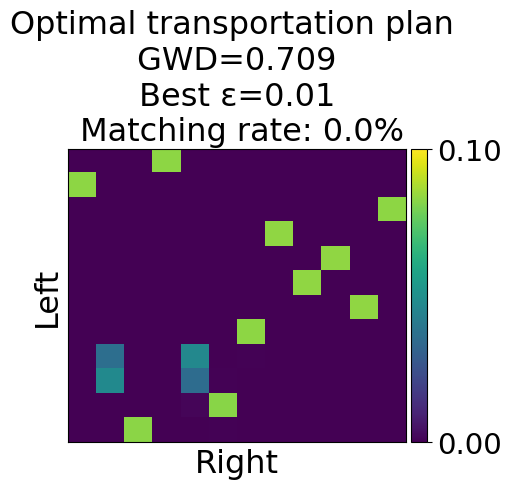

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 2.017


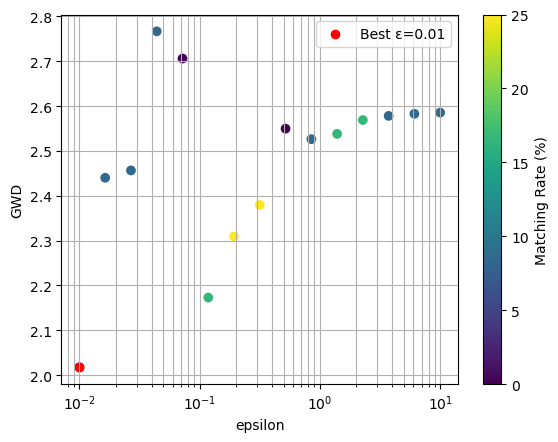

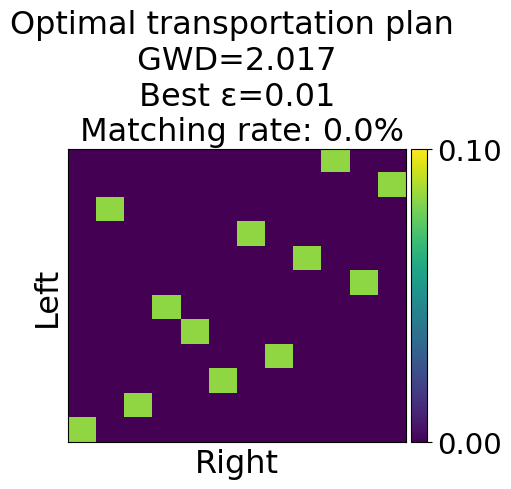

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.016378937069540637, Minimum GWD: 2.207


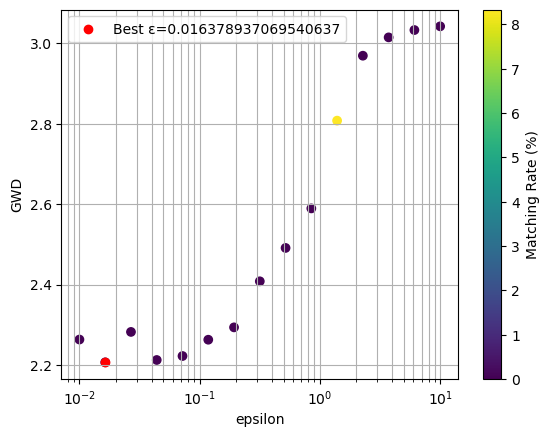

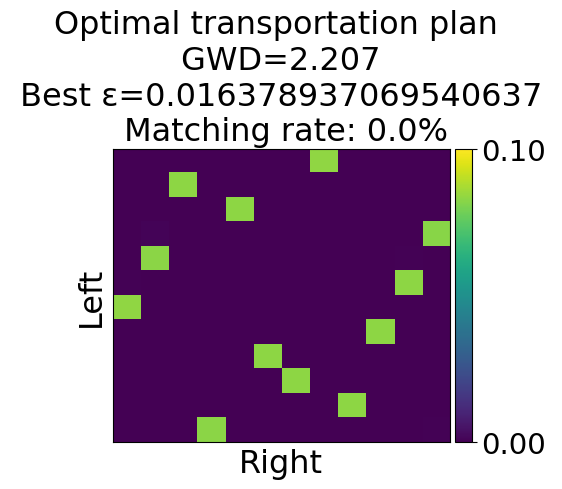

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 2.342


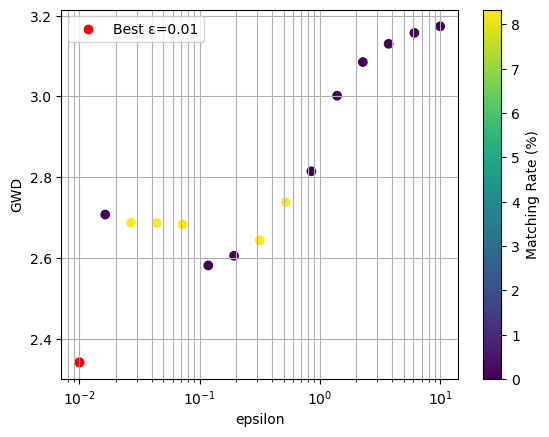

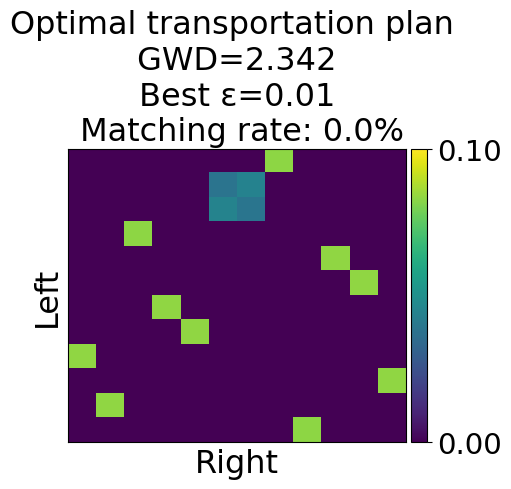

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.043939705607607904, Minimum GWD: 0.961


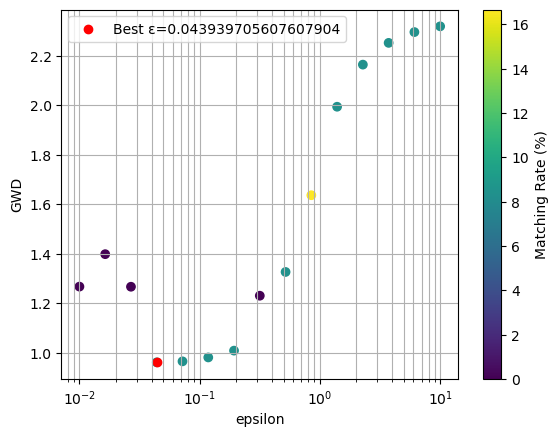

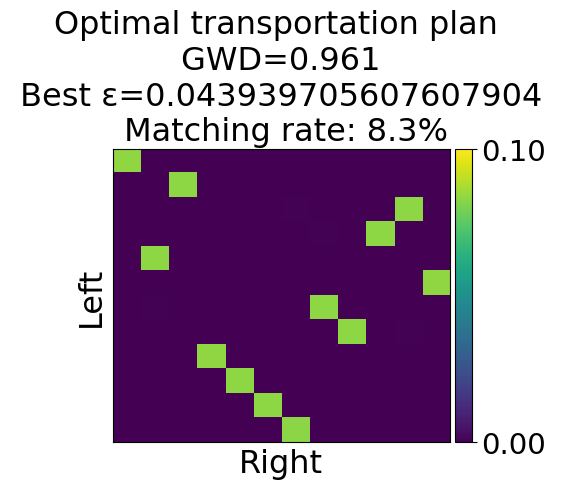

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:632: RuntimeWarning: divide by zero encountered in divide
  u = 1.0 / nx.dot(Kp, v)
/opt/anaconda3/envs

Best epsilon: 0.016378937069540637, Minimum GWD: 0.000


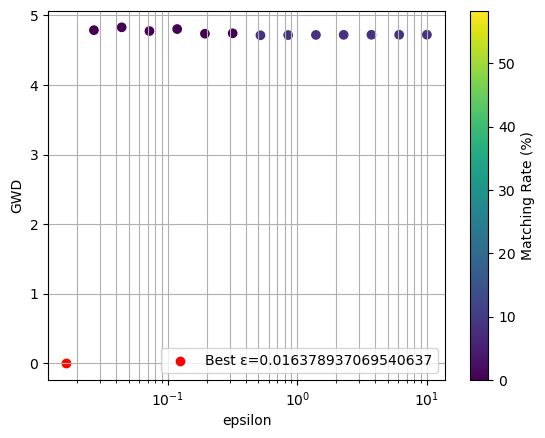

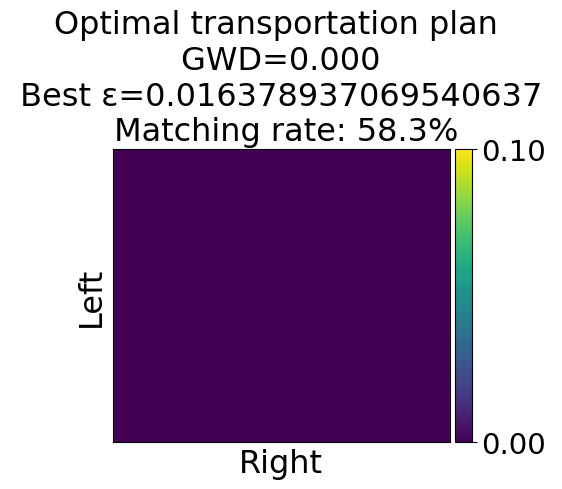

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 0.19306977288832497, Minimum GWD: 3.171


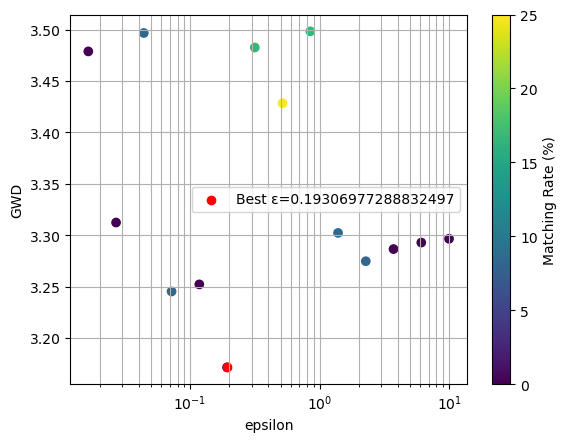

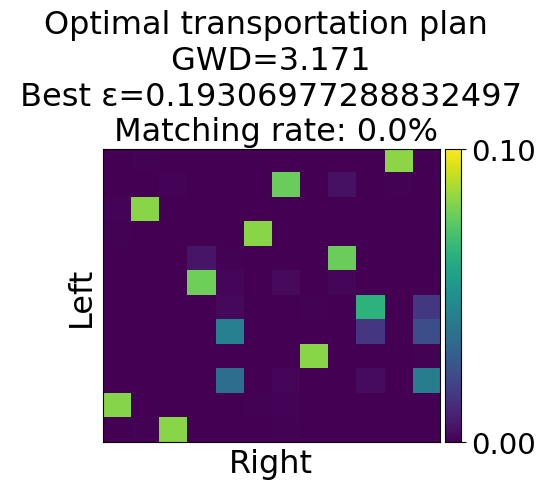

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:632: RuntimeWarning: divide by zero encountered in divide
  u = 1.0 / nx.dot(Kp, v)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterati

Best epsilon: 0.19306977288832497, Minimum GWD: 2.695


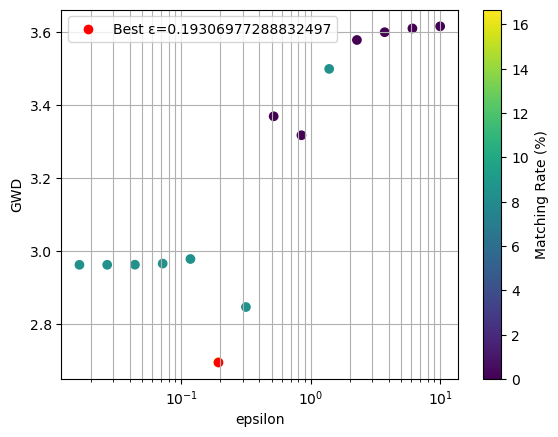

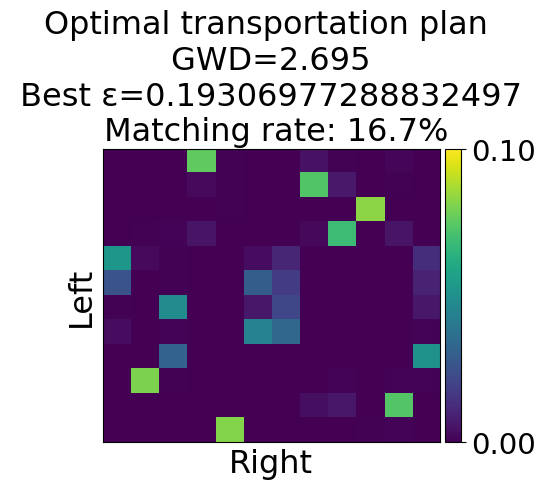

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.043939705607607904, Minimum GWD: 1.055


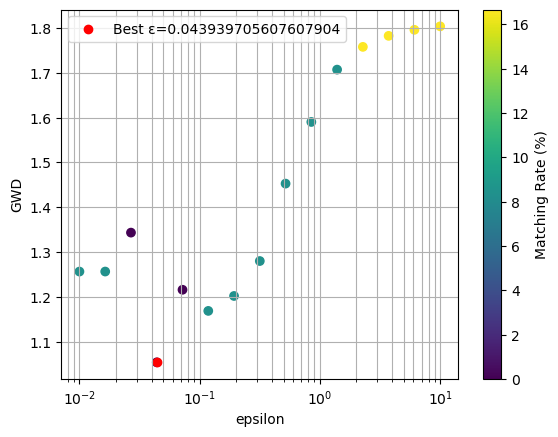

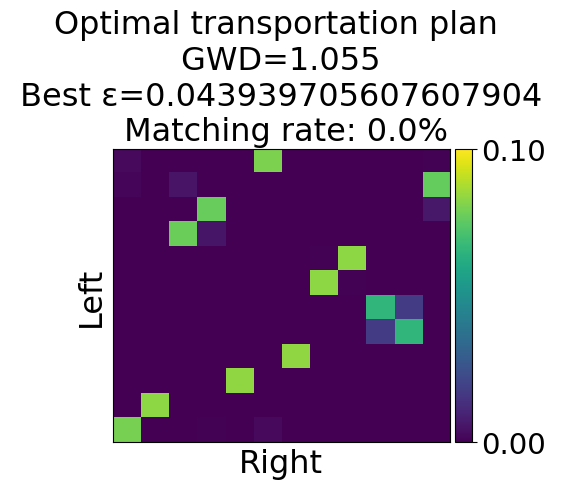

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31622776601683794, Minimum GWD: 0.825


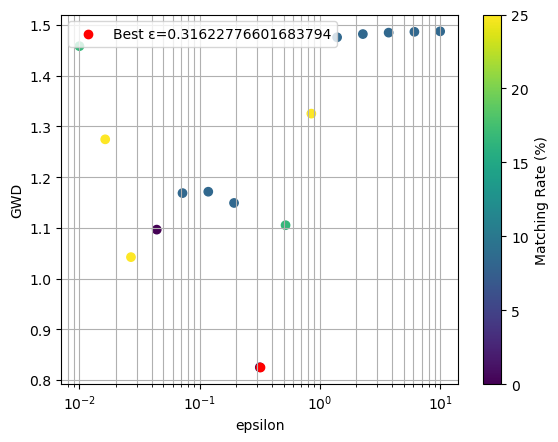

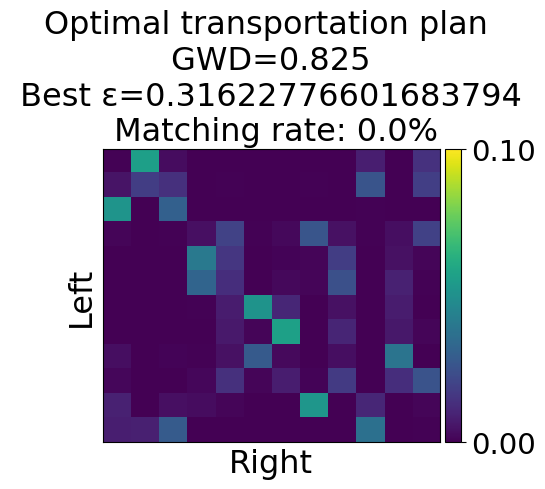

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 0.694


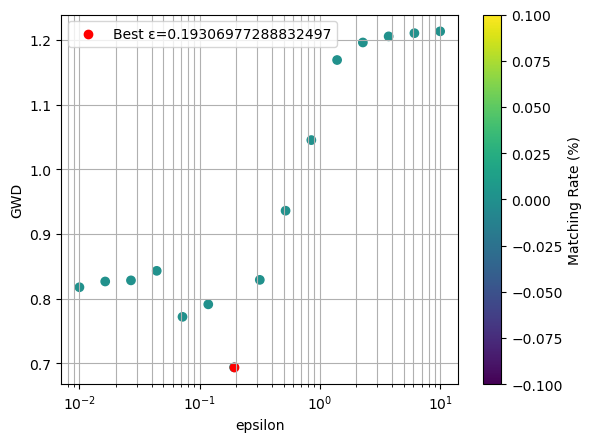

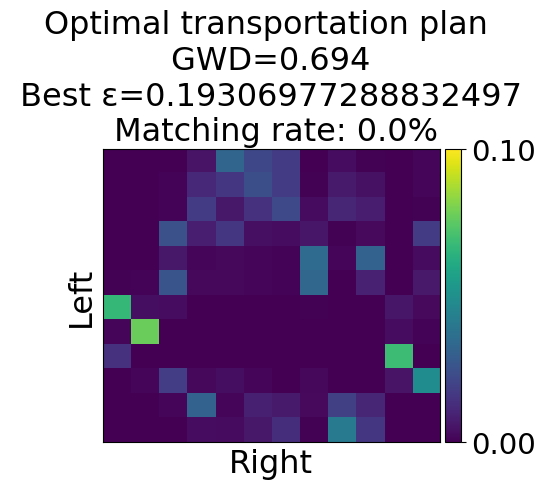

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07196856730011521, Minimum GWD: 0.843


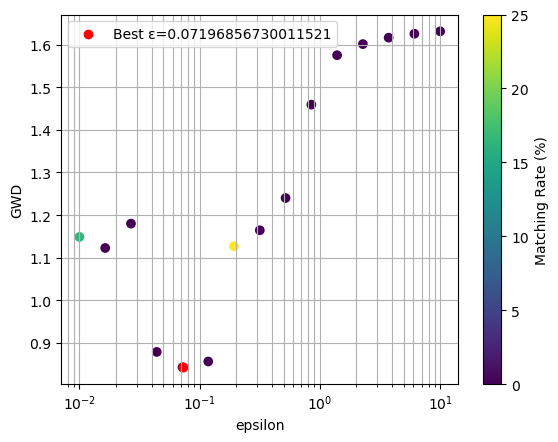

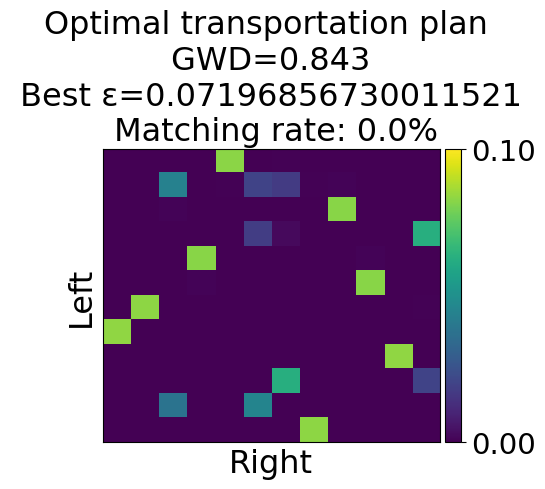

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31622776601683794, Minimum GWD: 1.553


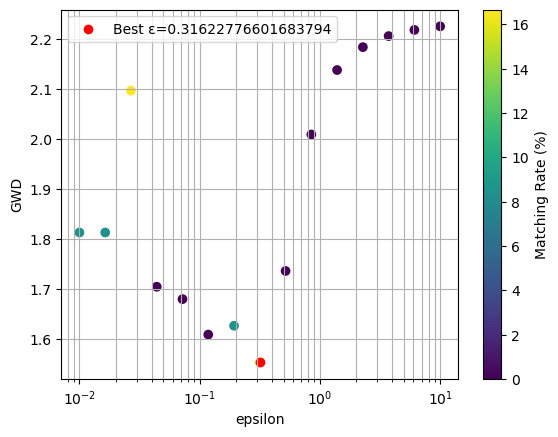

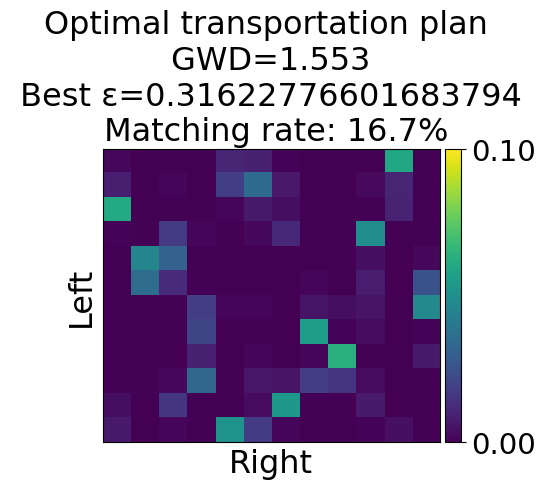

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.517947467923121, Minimum GWD: 1.534


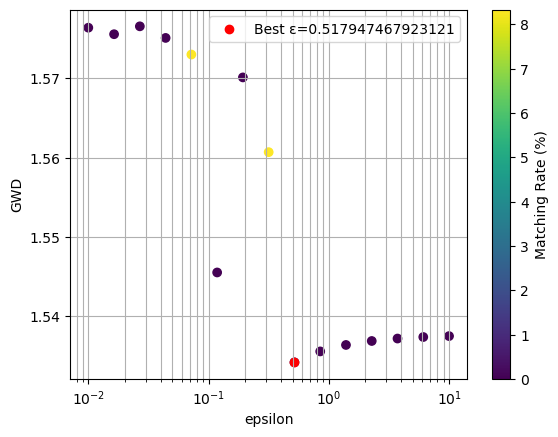

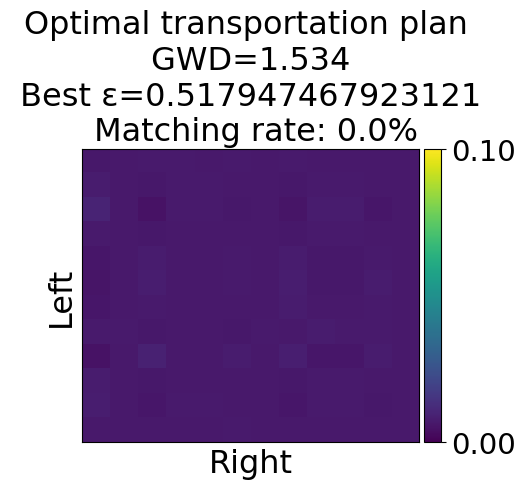

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 0.8483428982440717, Minimum GWD: 3.382


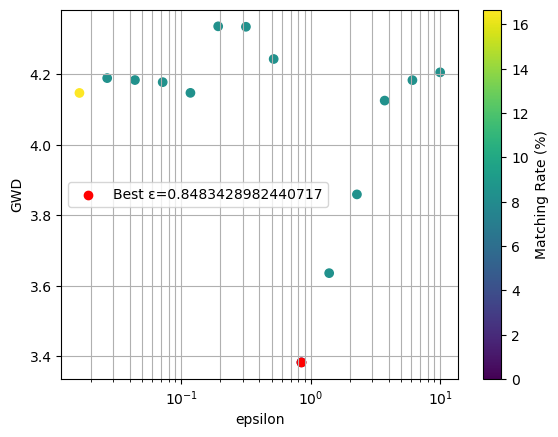

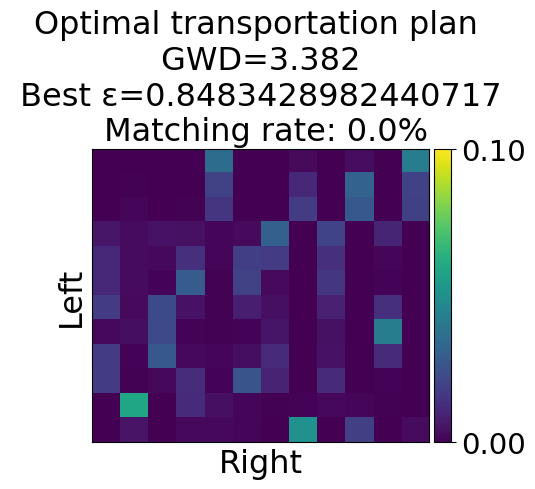

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:632: RuntimeWarning: divide by zero encountered in divide
  u = 1.0 / nx.dot(Kp, v)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterati

Best epsilon: 0.31622776601683794, Minimum GWD: 1.144


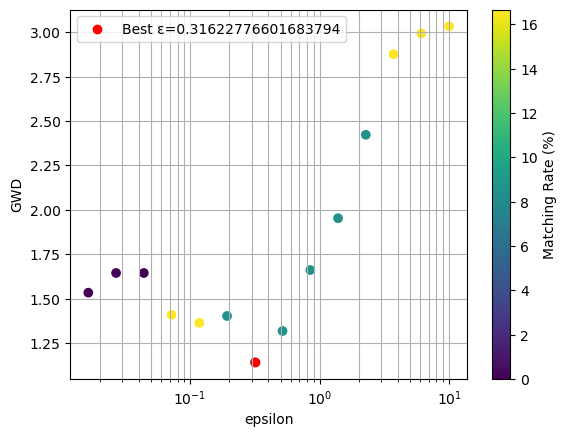

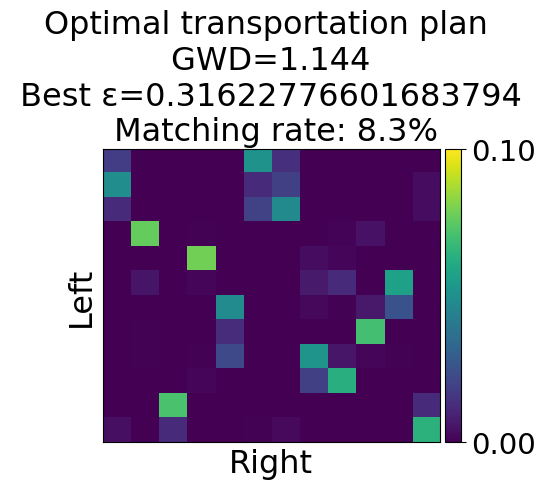

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.016378937069540637, Minimum GWD: 0.771


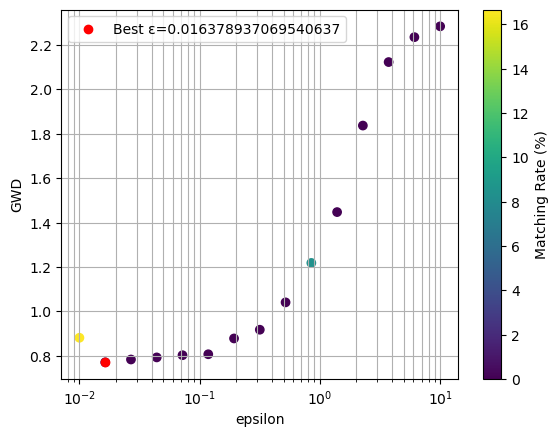

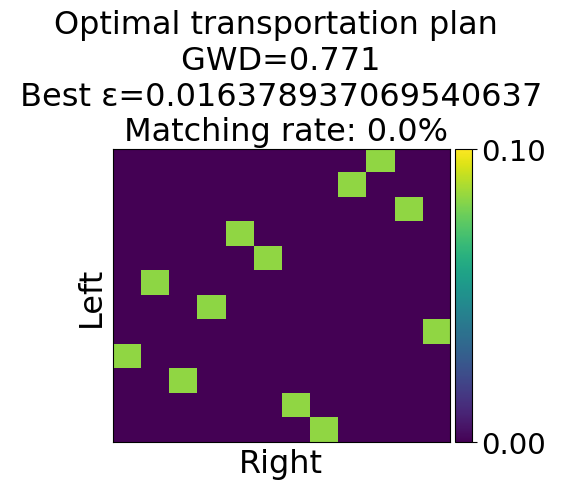

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.016378937069540637, Minimum GWD: 1.893


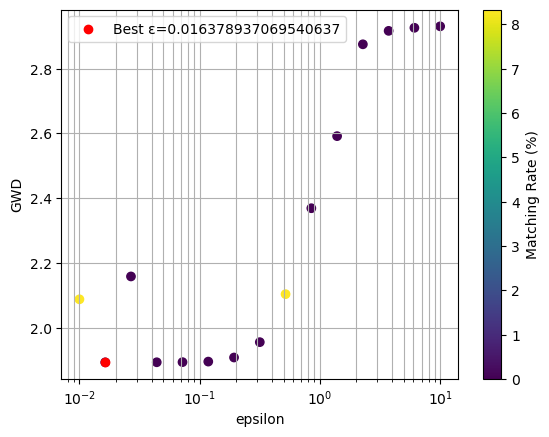

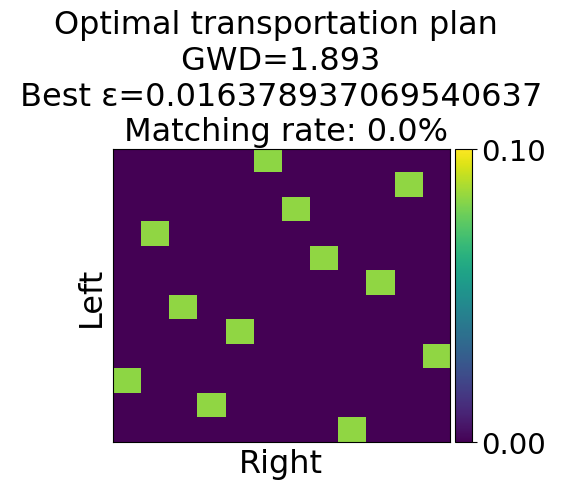

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:632: RuntimeWarning: overflow encountered in divide
  u = 1.0 / nx.dot(Kp, v)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 976
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 1.930


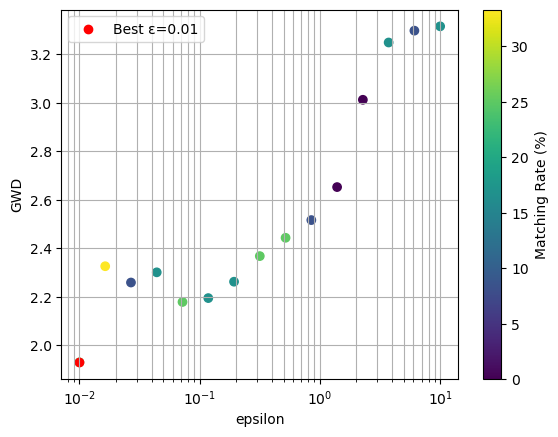

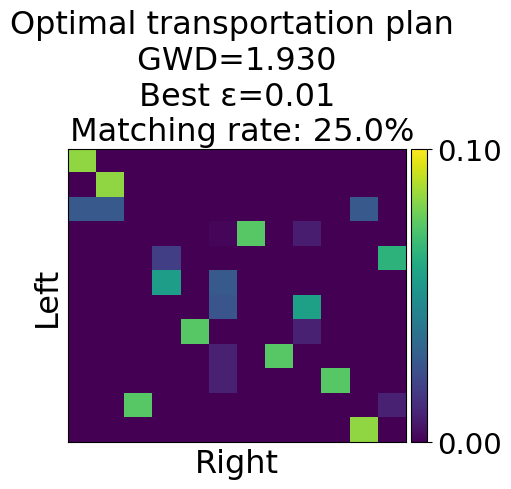

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:632: RuntimeWarning: overflow encountered in divide
  u = 1.0 / nx.dot(Kp, v)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 430
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 442
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: 

Best epsilon: 0.31622776601683794, Minimum GWD: 2.338


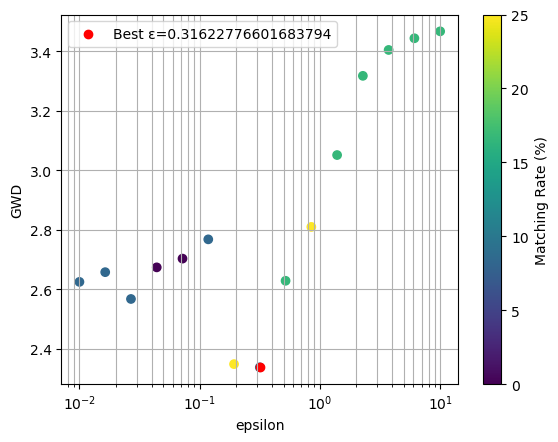

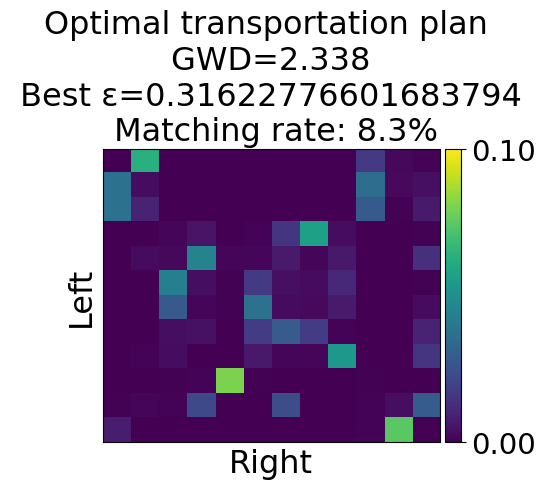

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 1.334


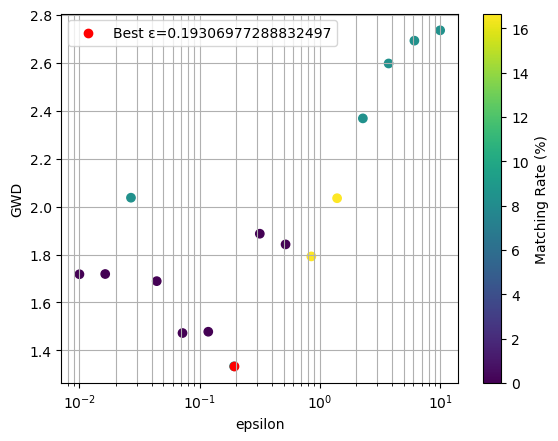

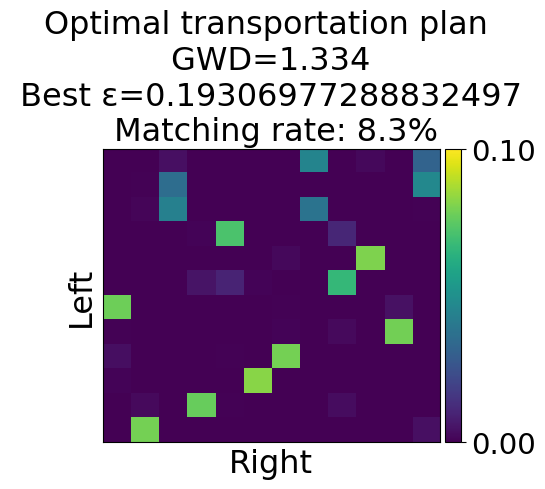

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:632: RuntimeWarning: divide by zero encountered in divide
  u = 1.0 / nx.dot(Kp, v)
/opt/anaconda3/envs

Best epsilon: 0.016378937069540637, Minimum GWD: 0.000


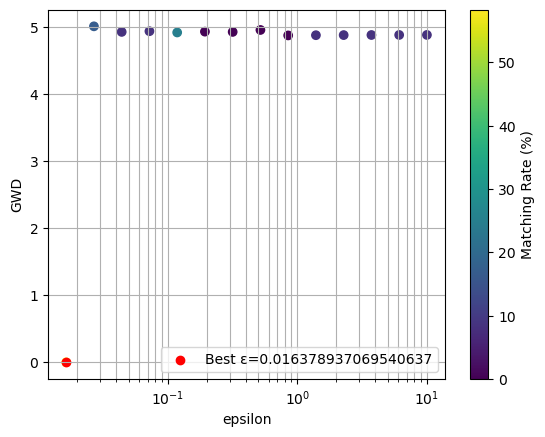

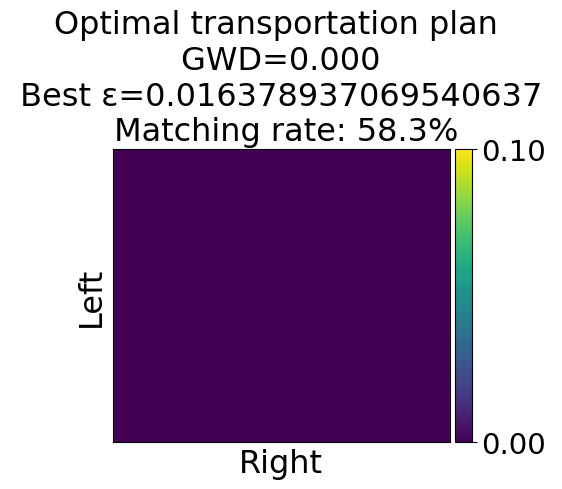

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 1.3894954943731375, Minimum GWD: 3.060


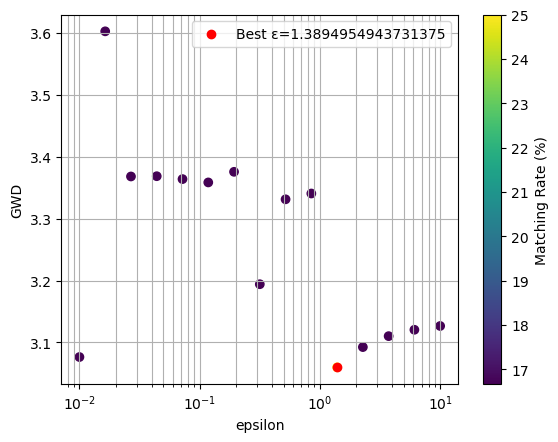

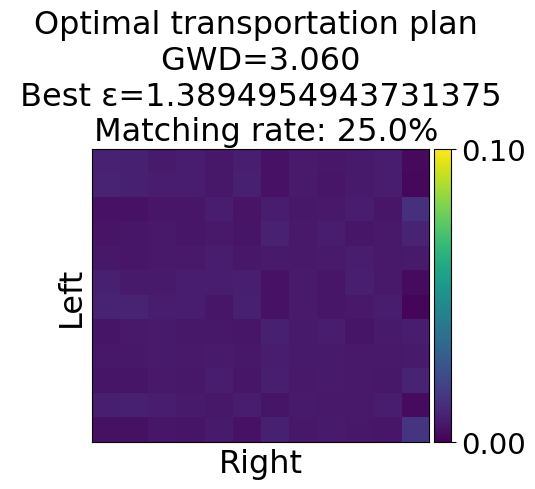

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.517947467923121, Minimum GWD: 2.709


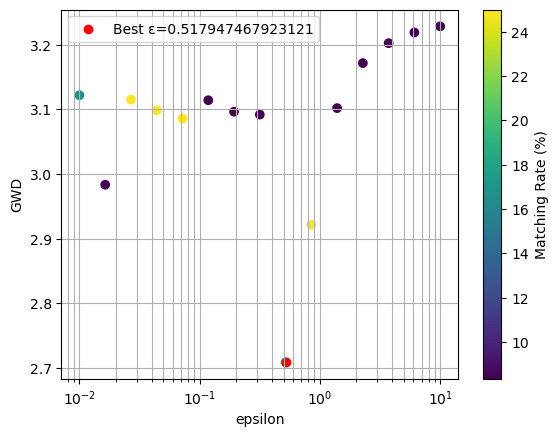

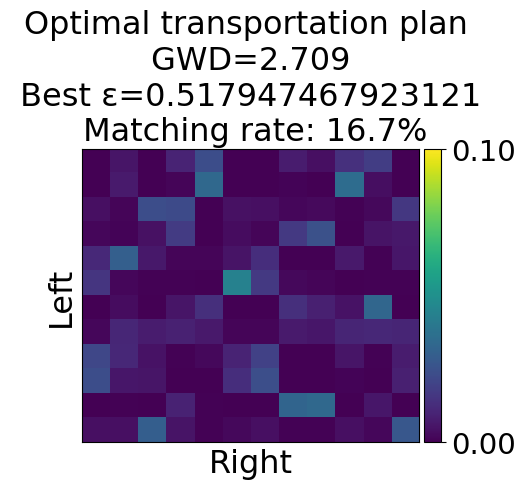

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 0.928


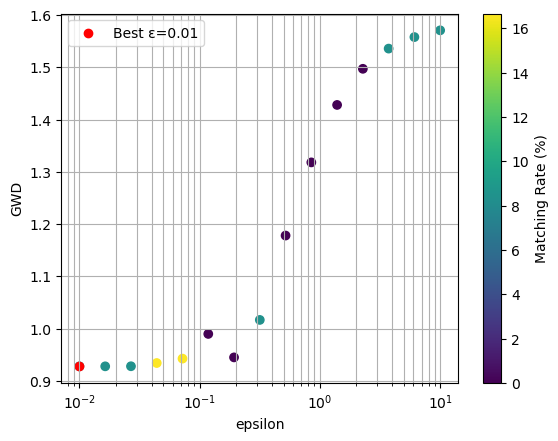

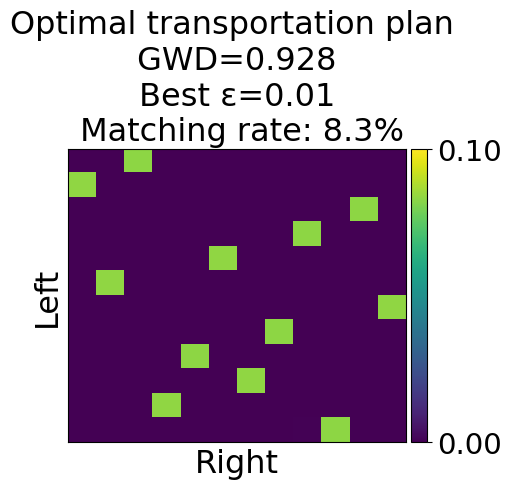

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31622776601683794, Minimum GWD: 1.002


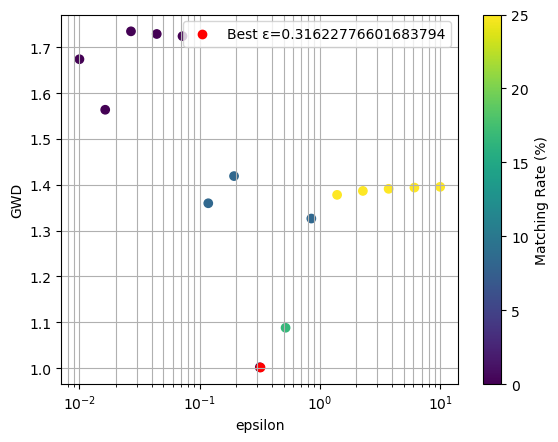

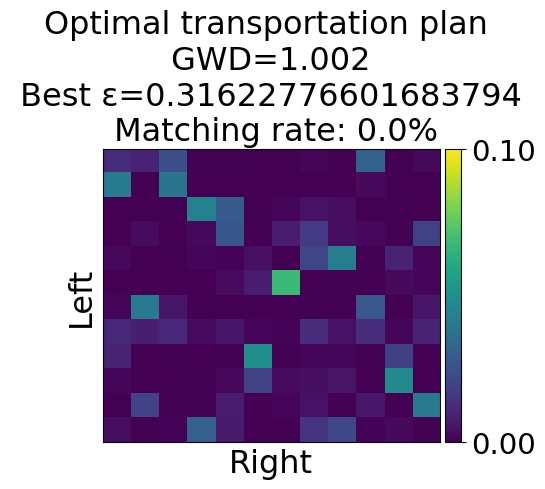

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 0.845


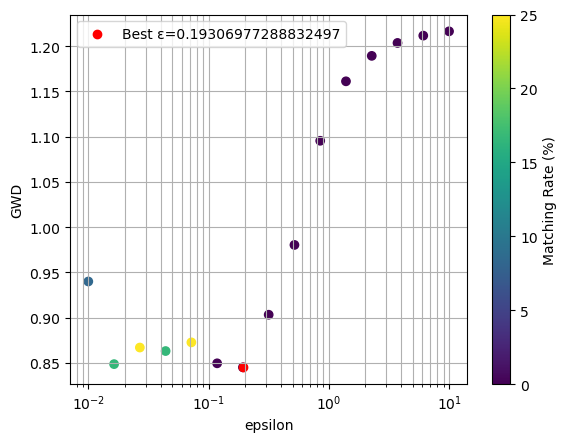

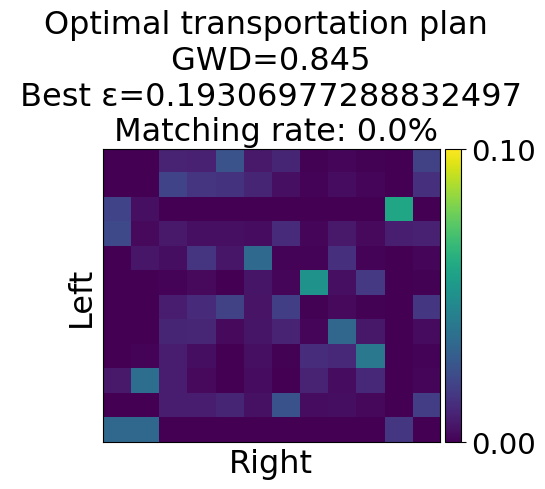

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31622776601683794, Minimum GWD: 1.081


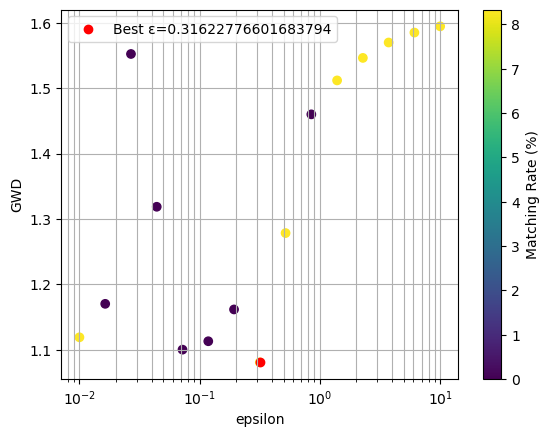

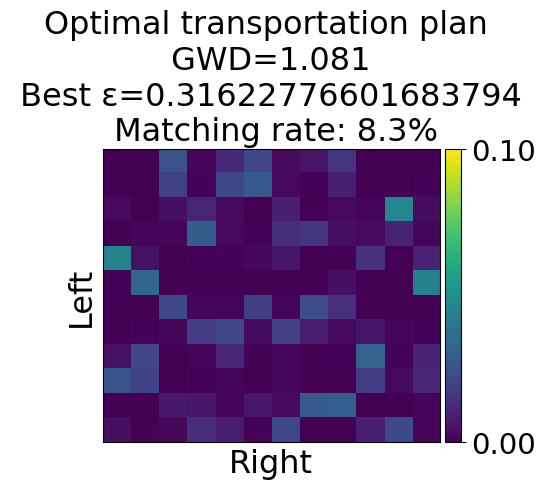

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.11787686347935872, Minimum GWD: 1.180


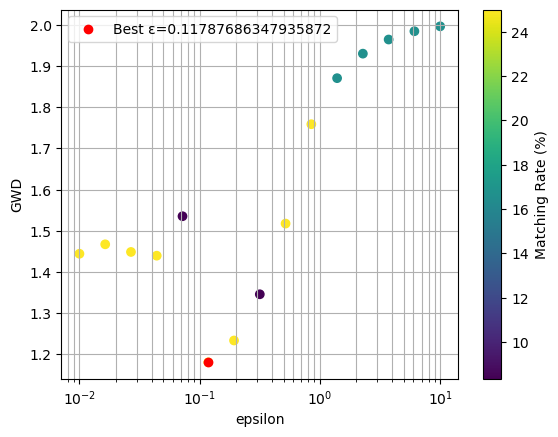

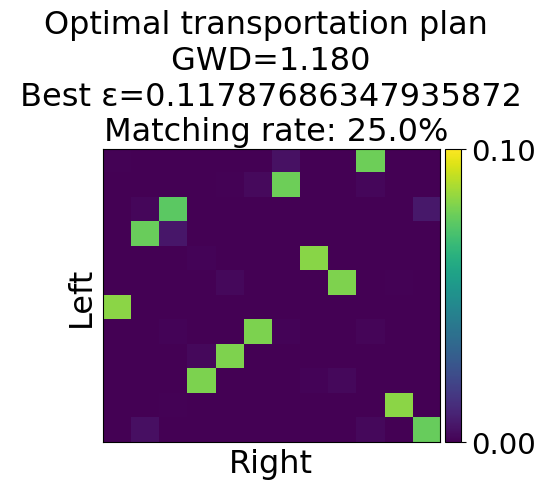

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07196856730011521, Minimum GWD: 1.452


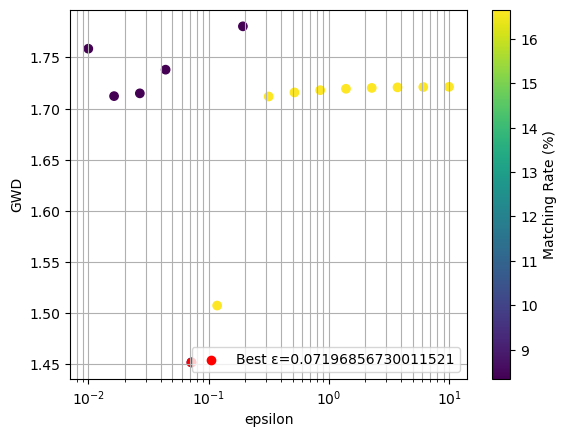

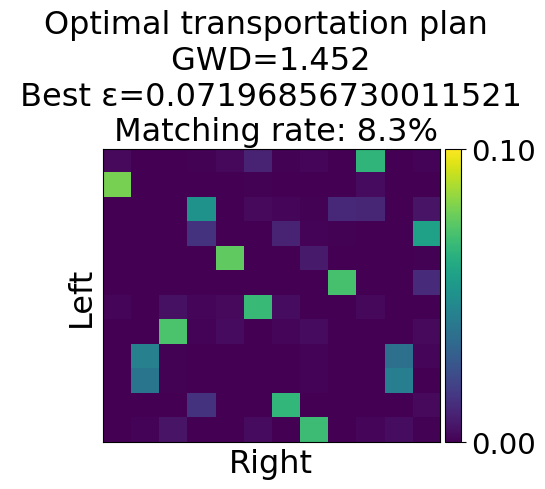

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.517947467923121, Minimum GWD: 3.106


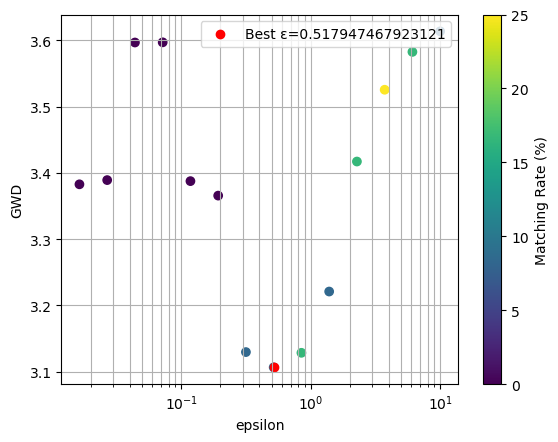

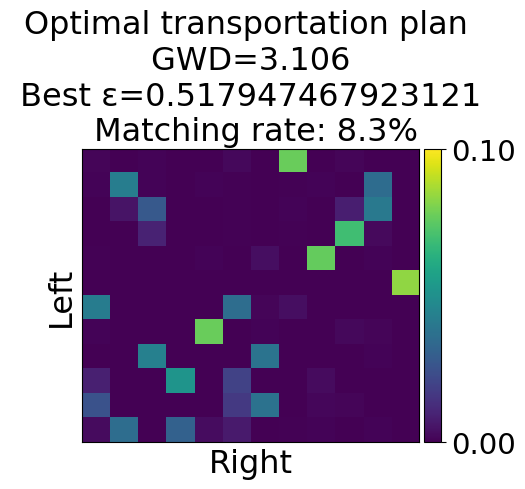

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31622776601683794, Minimum GWD: 2.234


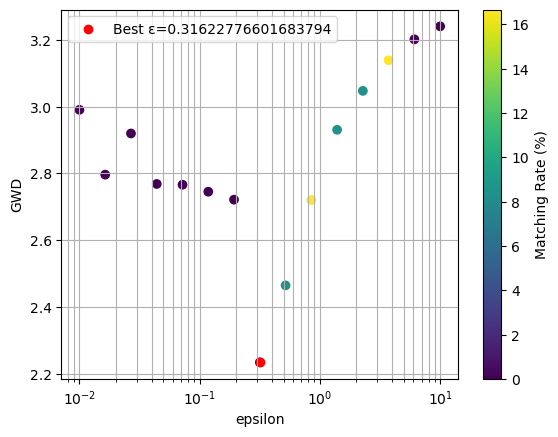

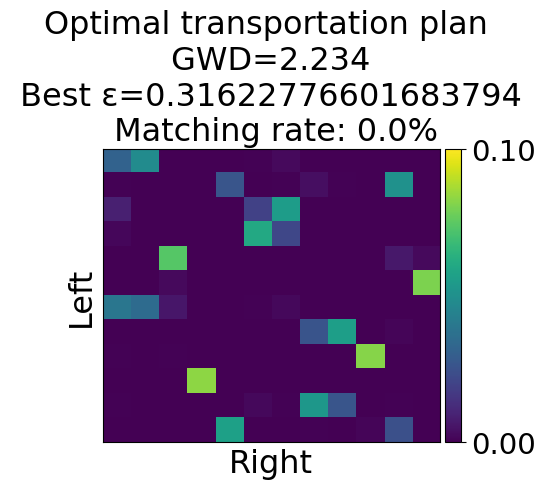

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.11787686347935872, Minimum GWD: 0.865


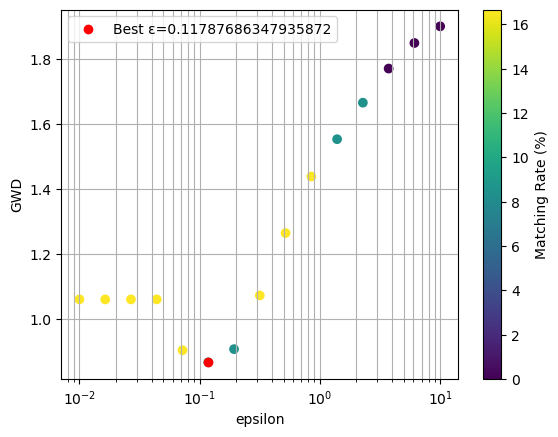

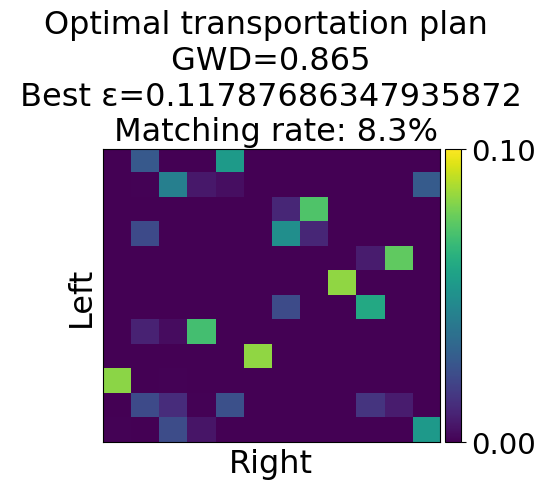

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.517947467923121, Minimum GWD: 1.577


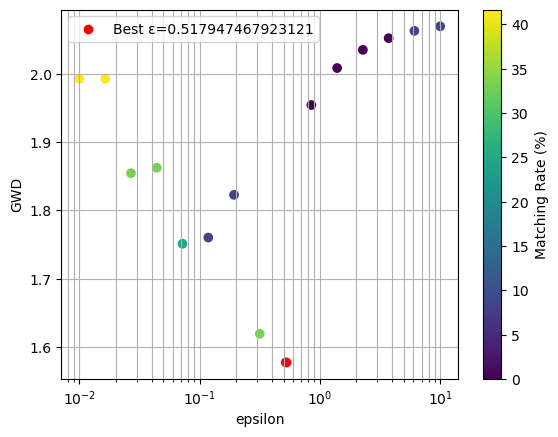

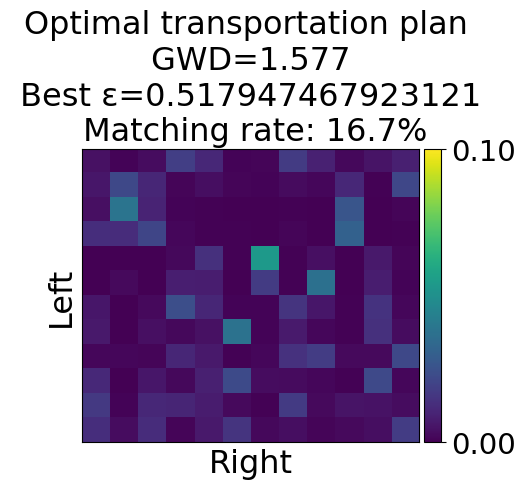

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.043939705607607904, Minimum GWD: 1.158


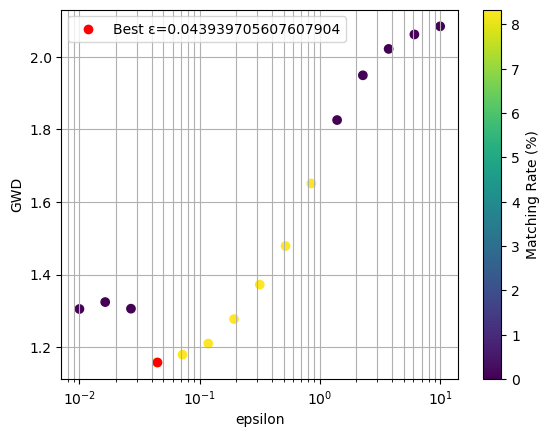

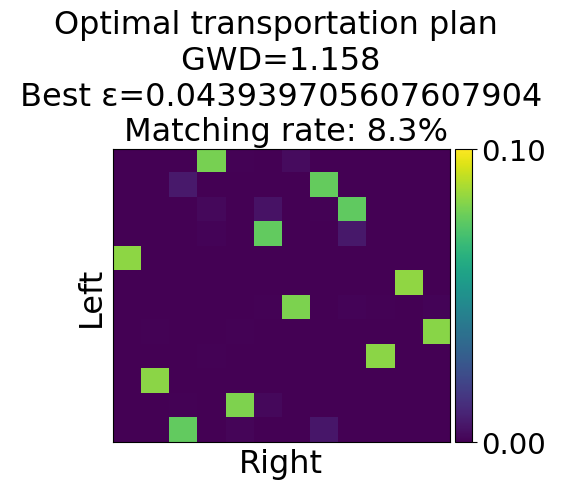

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 1.010


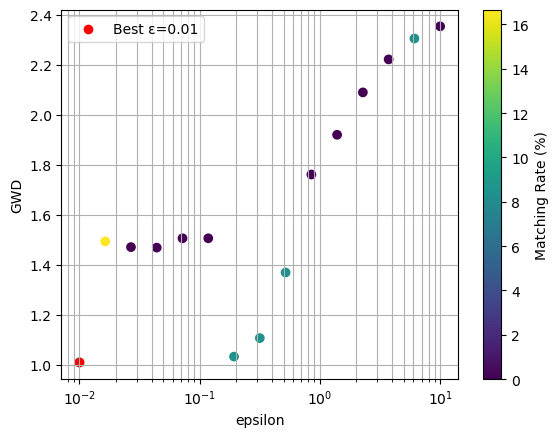

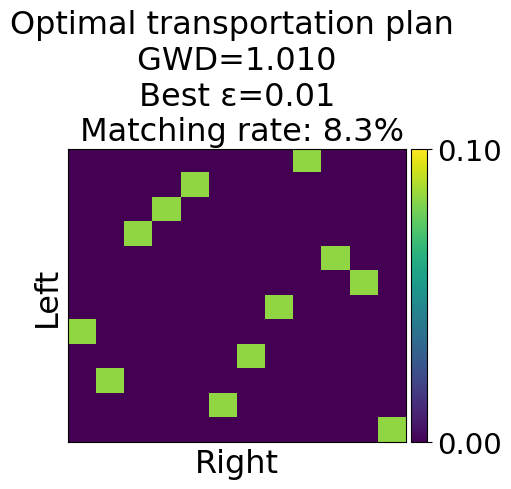

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 0.975


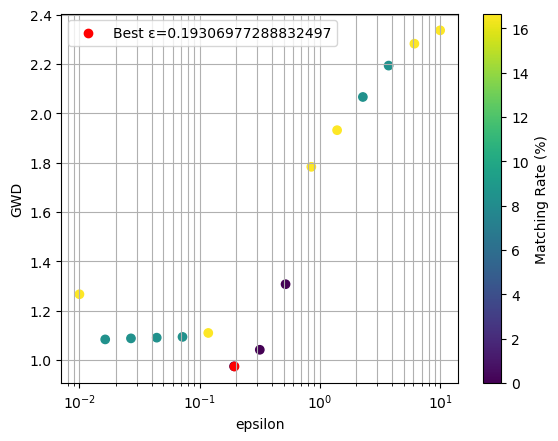

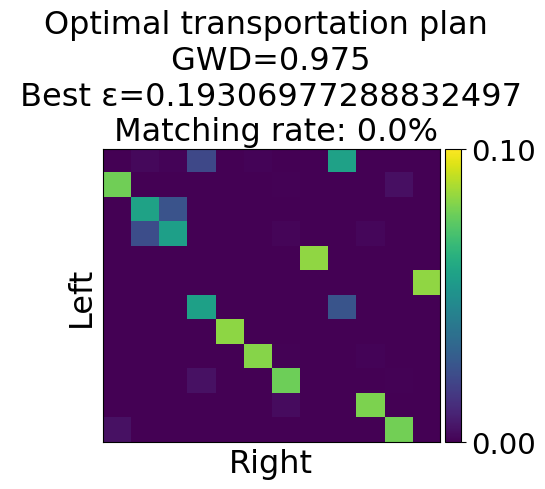

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:632: RuntimeWarning: divide by zero encountered in divide
  u = 1.0 / nx.dot(Kp, v)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 0.000


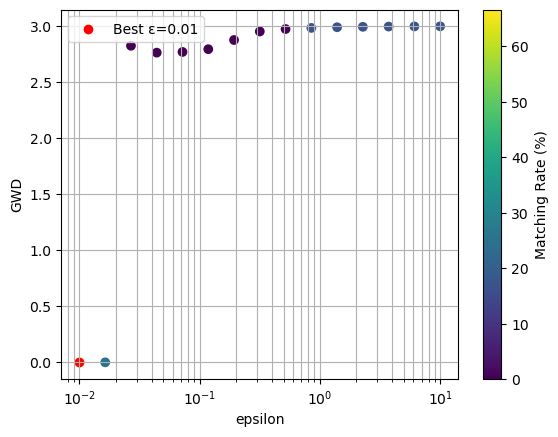

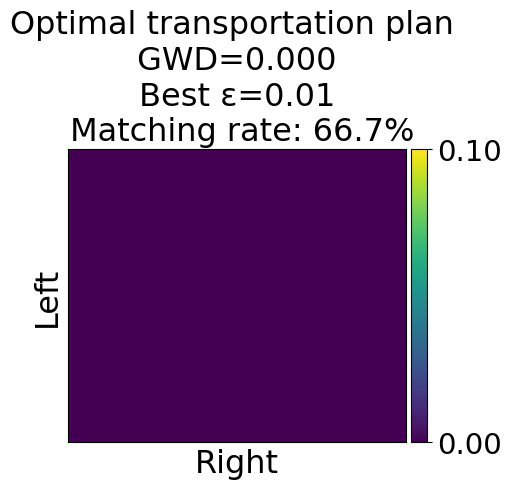

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 0.043939705607607904, Minimum GWD: 2.874


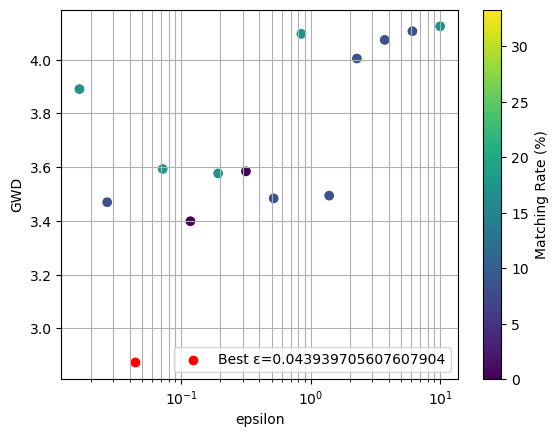

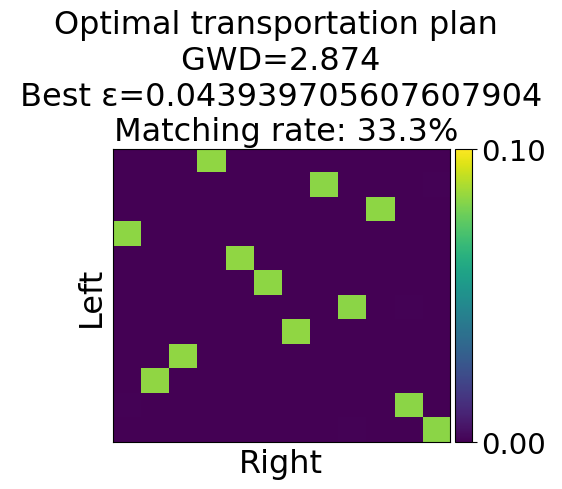

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 2.223


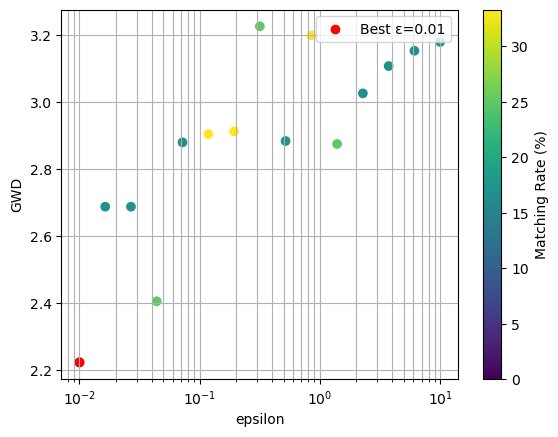

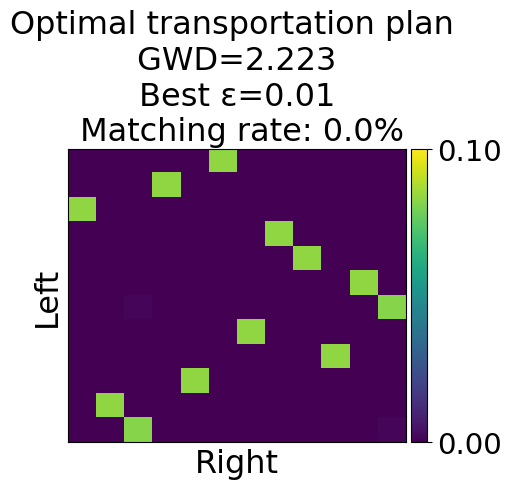

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 1.513


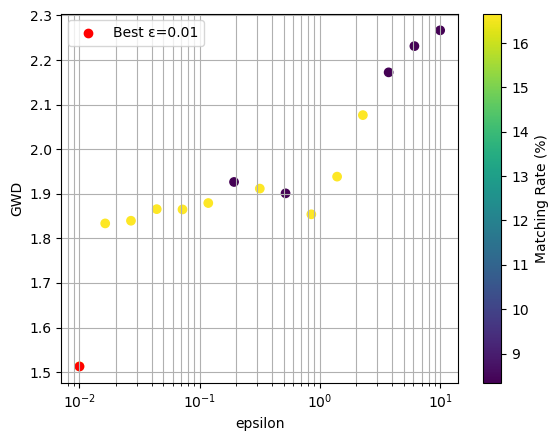

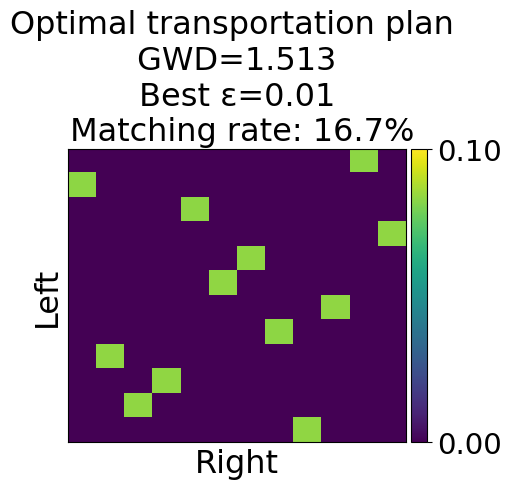

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 1.845


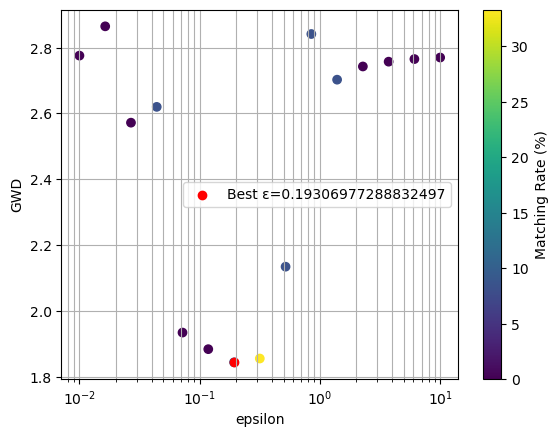

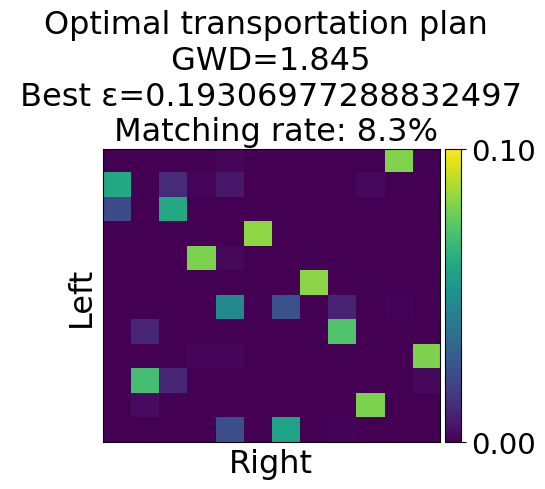

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:632: RuntimeWarning: divide by zero encountered in divide
  u = 1.0 / nx.dot(Kp, v)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might w

Best epsilon: 0.19306977288832497, Minimum GWD: 2.175


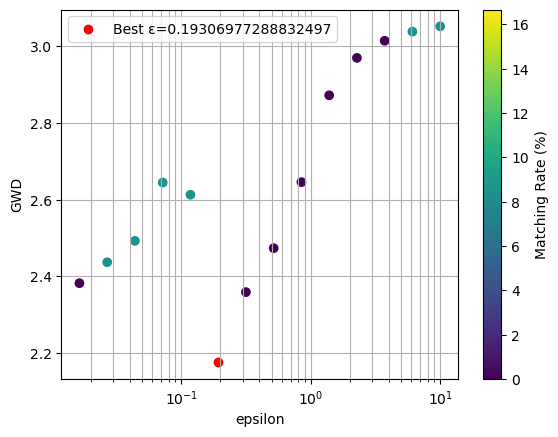

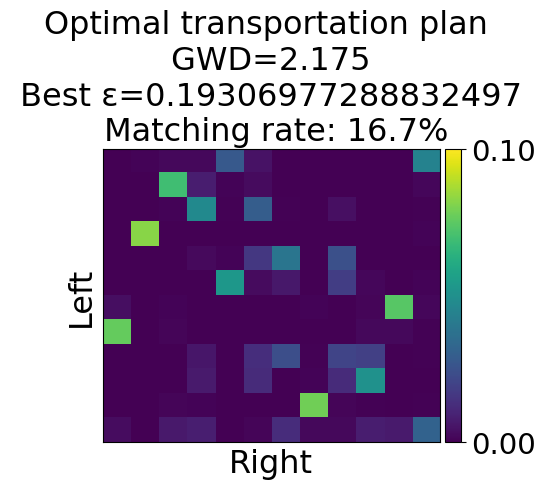

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31622776601683794, Minimum GWD: 2.242


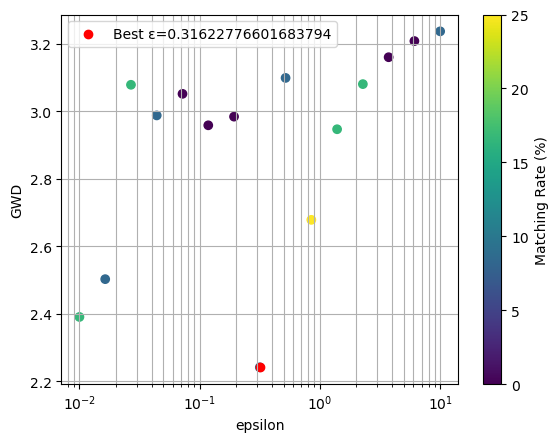

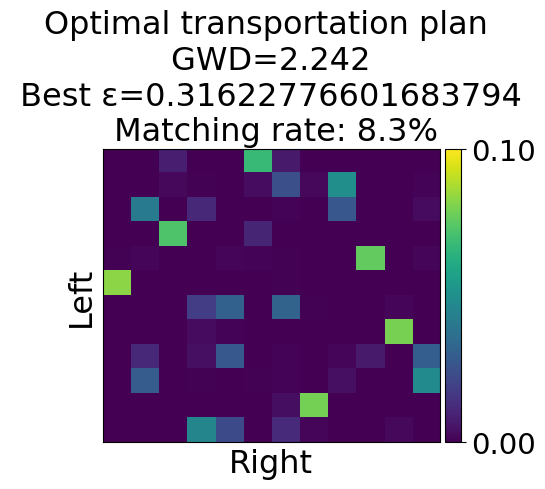

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.11787686347935872, Minimum GWD: 1.559


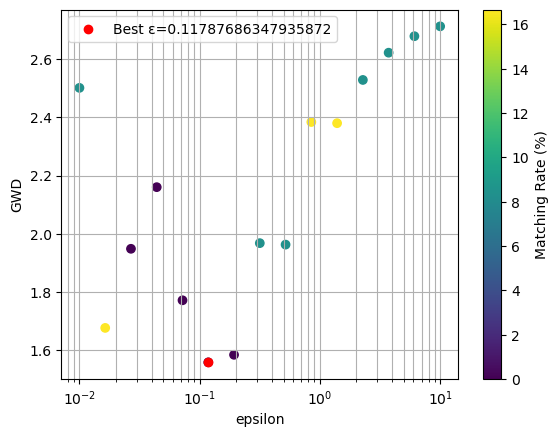

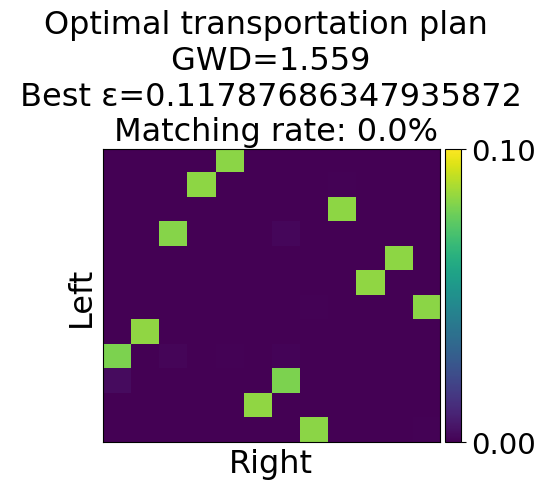

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:632: RuntimeWarning: divide by zero encountered in divide
  u = 1.0 / nx.dot(Kp, v)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterati

Best epsilon: 0.016378937069540637, Minimum GWD: 0.000


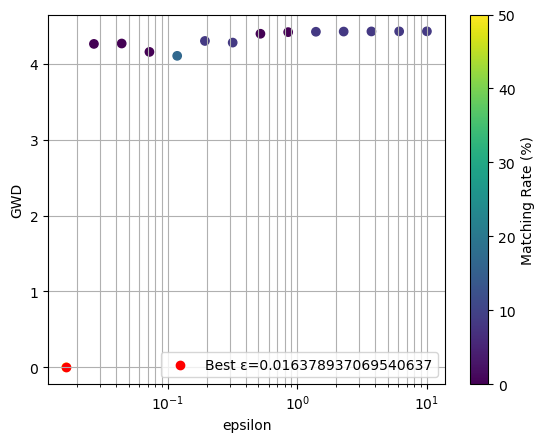

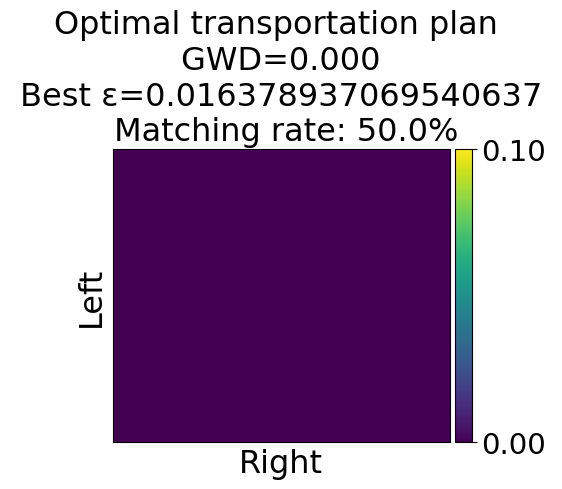

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31622776601683794, Minimum GWD: 2.695


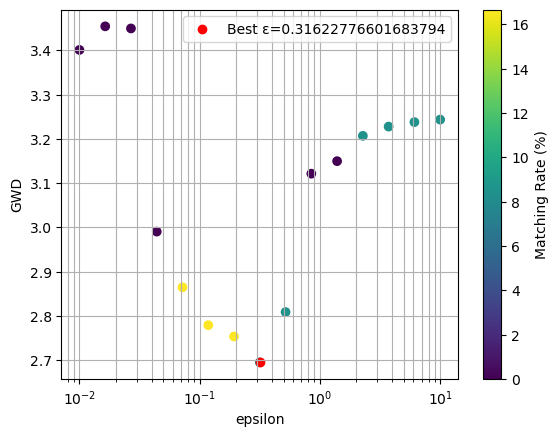

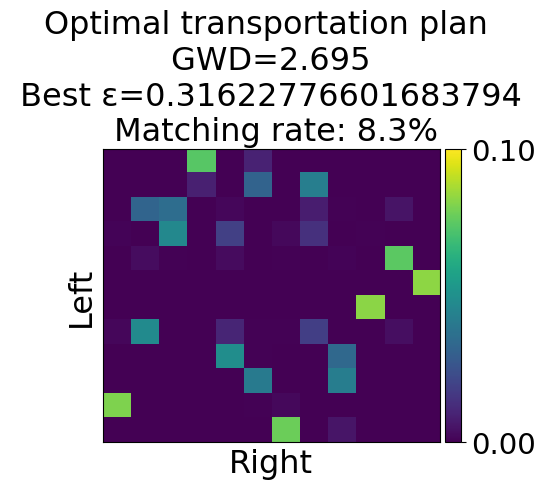

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.016378937069540637, Minimum GWD: 1.709


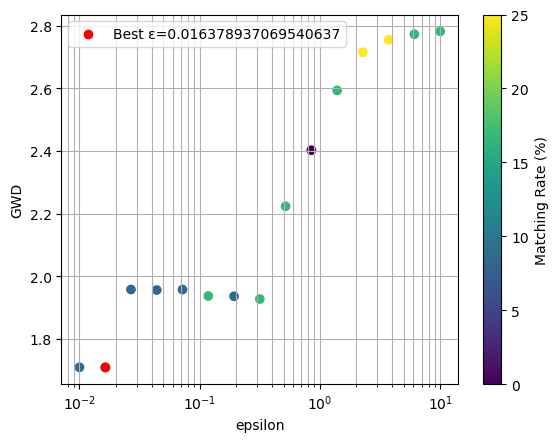

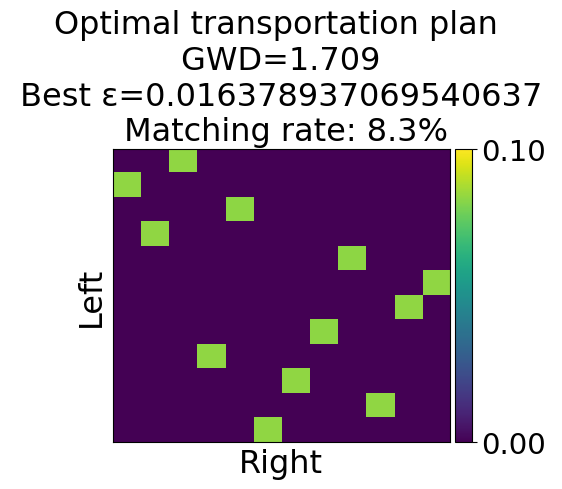

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 0.748


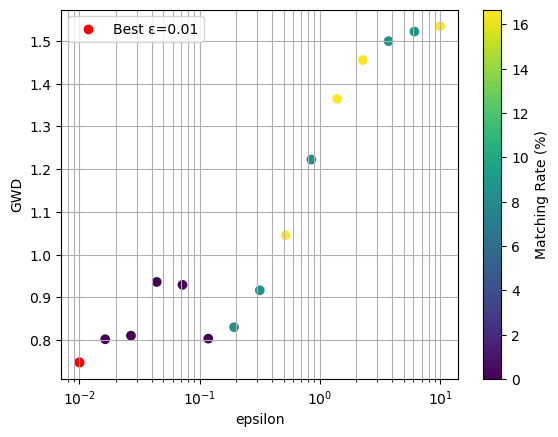

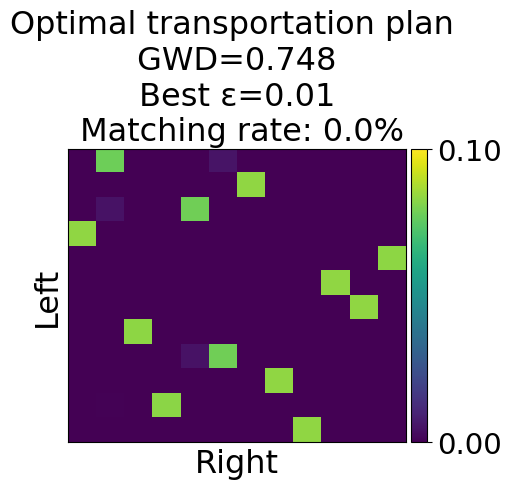

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 0.855


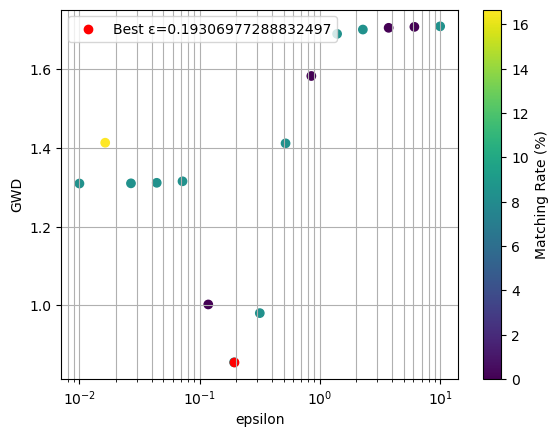

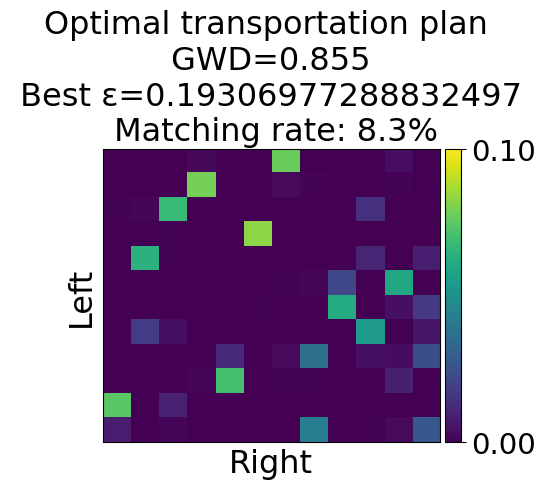

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.11787686347935872, Minimum GWD: 1.236


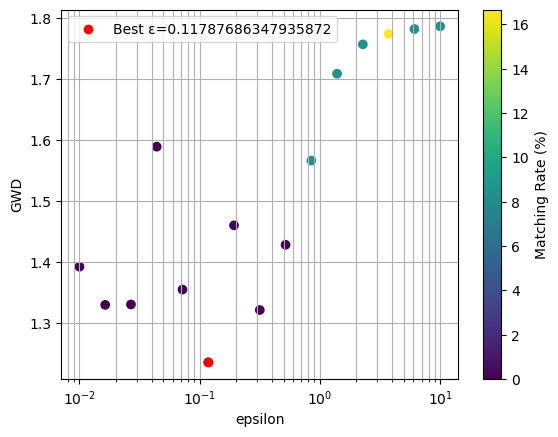

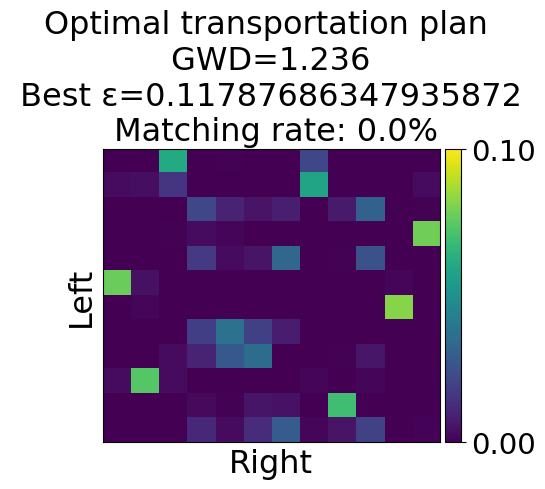

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.517947467923121, Minimum GWD: 1.692


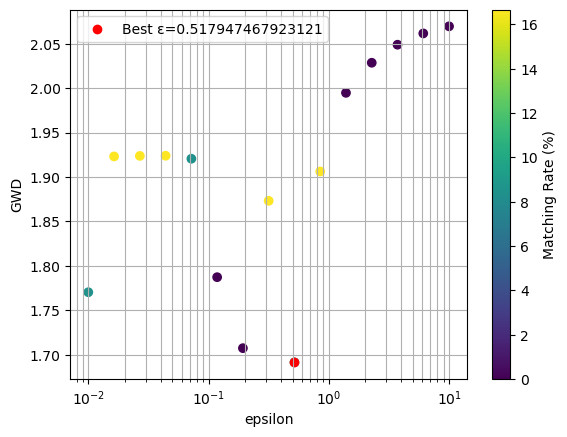

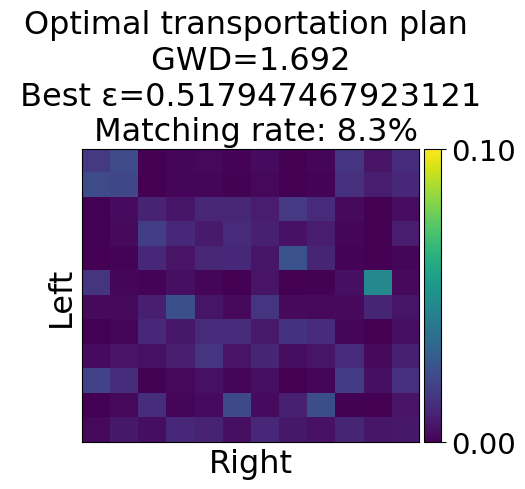

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31622776601683794, Minimum GWD: 1.005


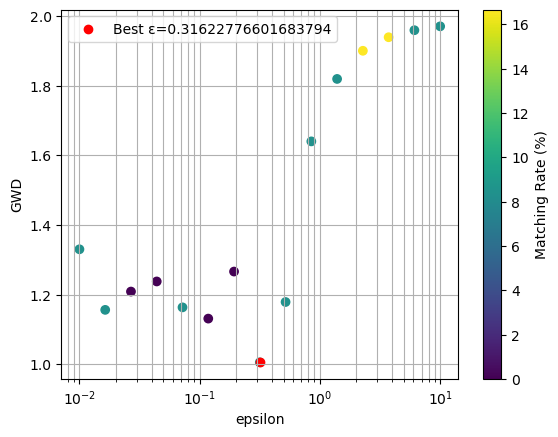

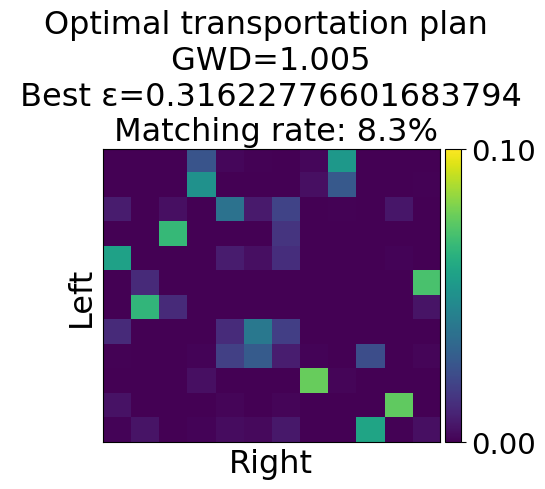

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.11787686347935872, Minimum GWD: 2.660


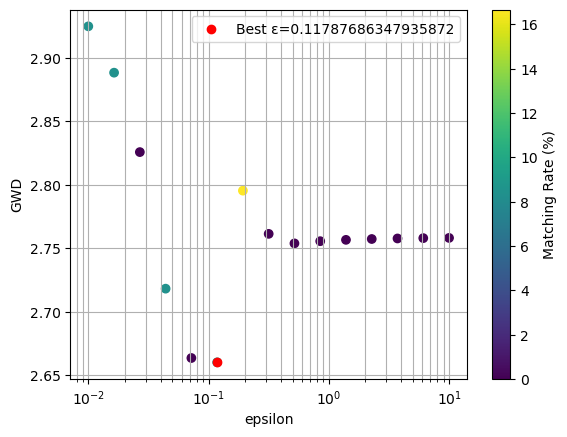

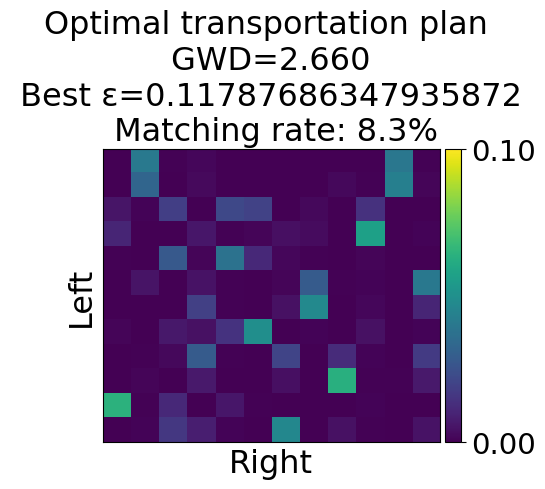

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 29
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsi

Best epsilon: 0.517947467923121, Minimum GWD: 2.295


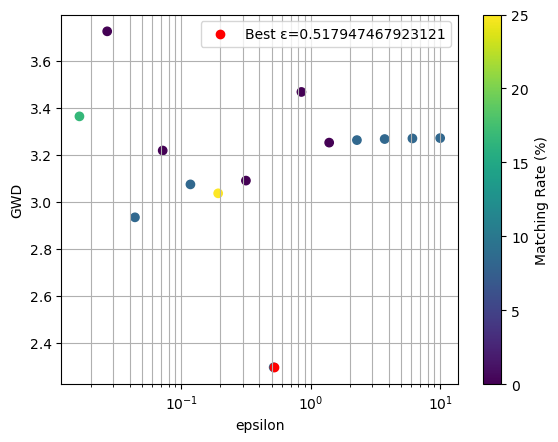

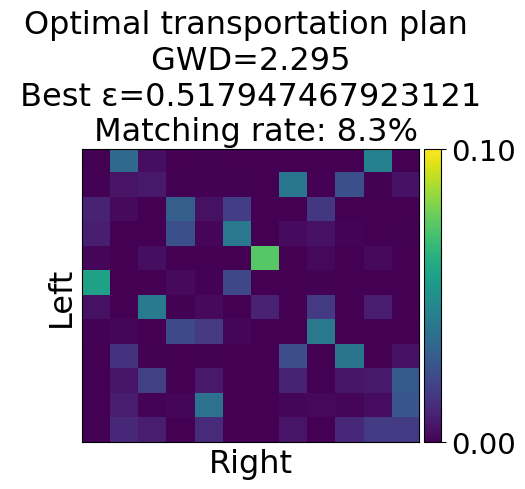

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 0.11787686347935872, Minimum GWD: 2.640


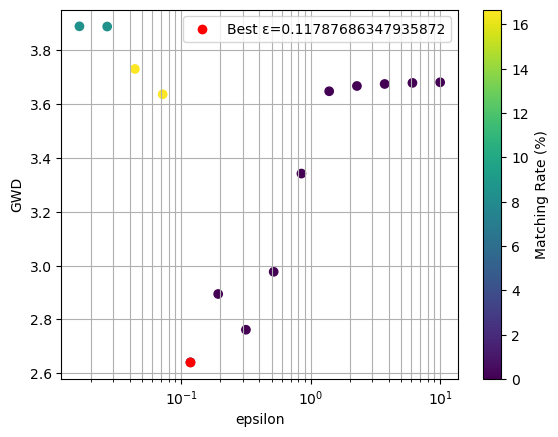

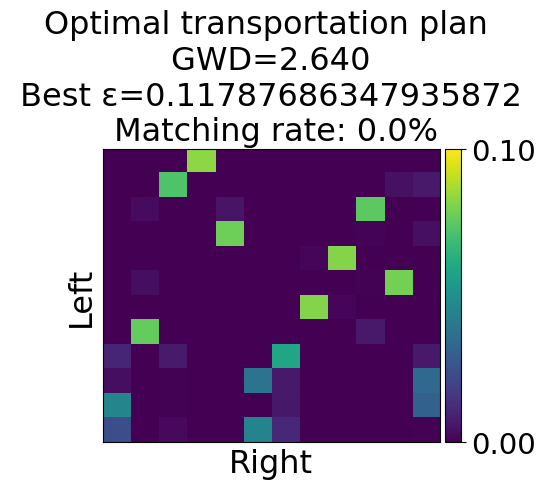

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.043939705607607904, Minimum GWD: 1.388


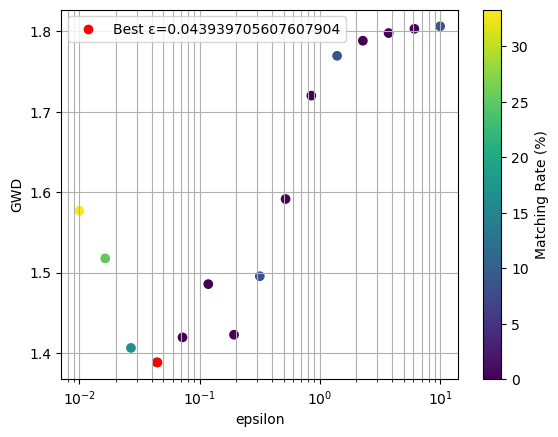

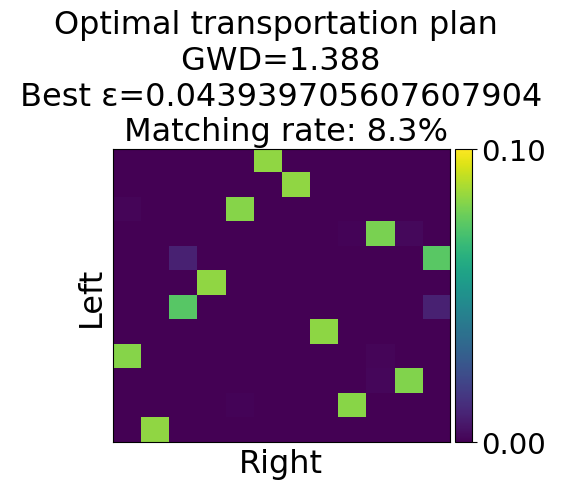

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31622776601683794, Minimum GWD: 0.796


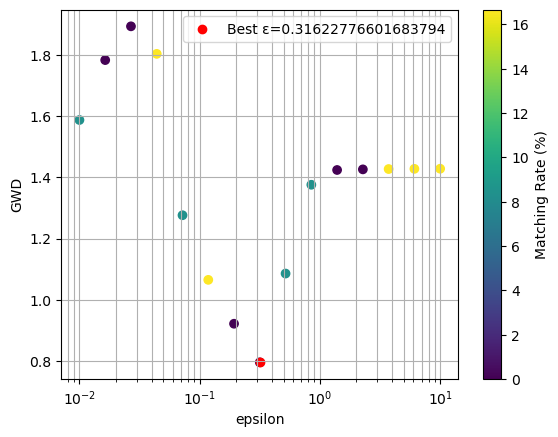

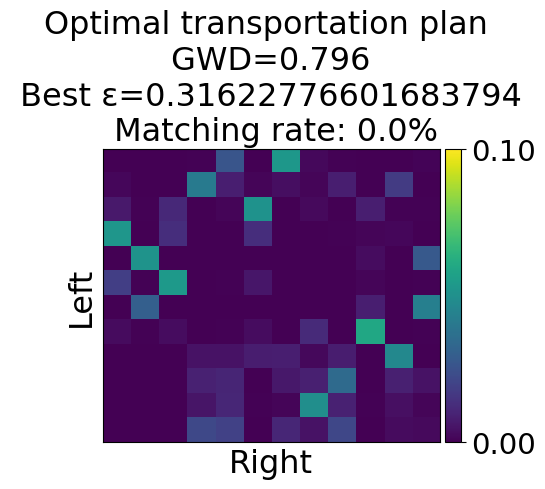

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.043939705607607904, Minimum GWD: 0.632


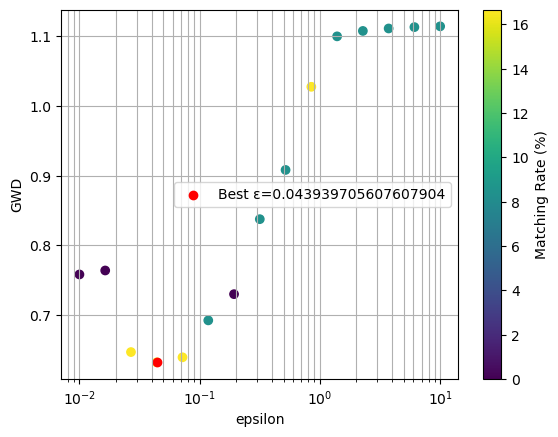

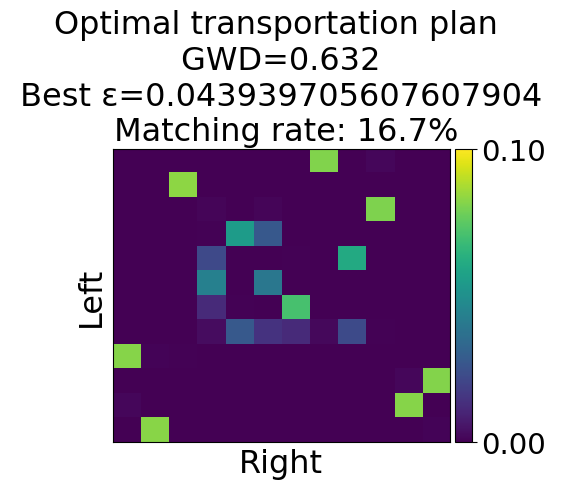

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 0.952


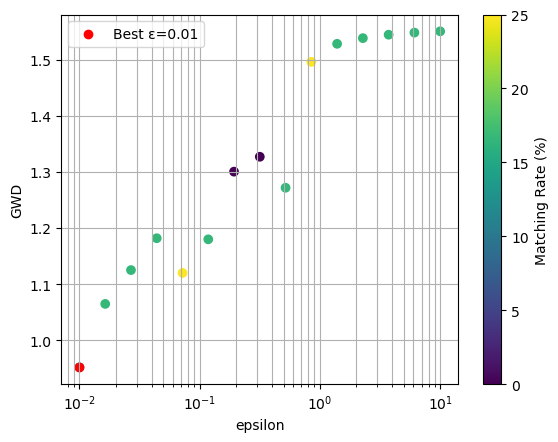

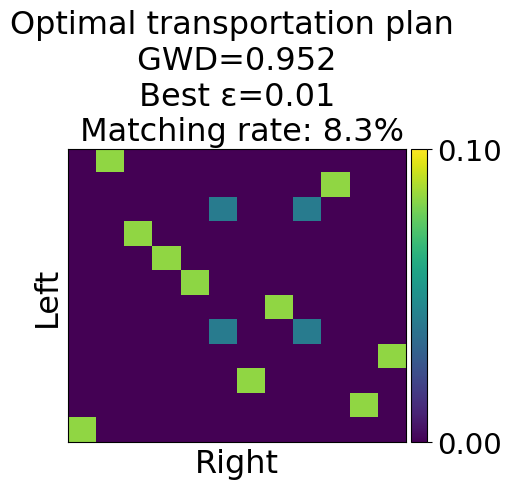

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.11787686347935872, Minimum GWD: 1.648


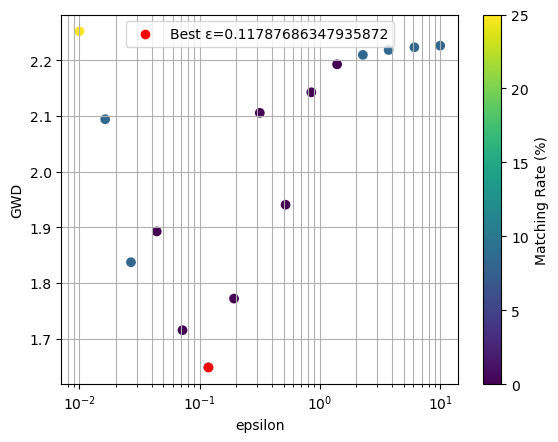

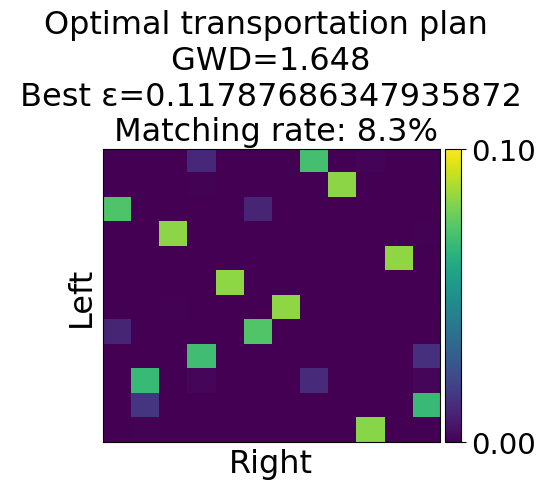

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.02682695795279726, Minimum GWD: 1.260


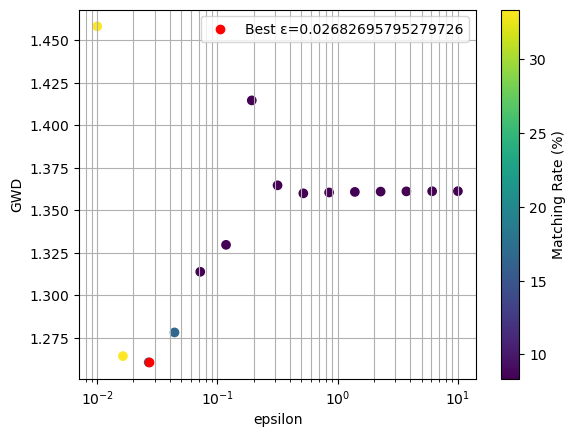

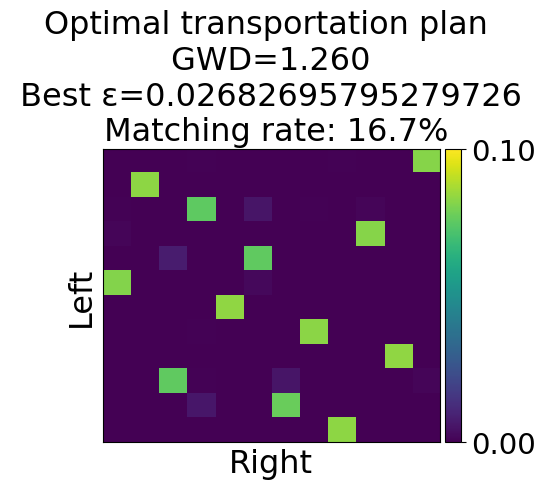

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 1.3894954943731375, Minimum GWD: 3.044


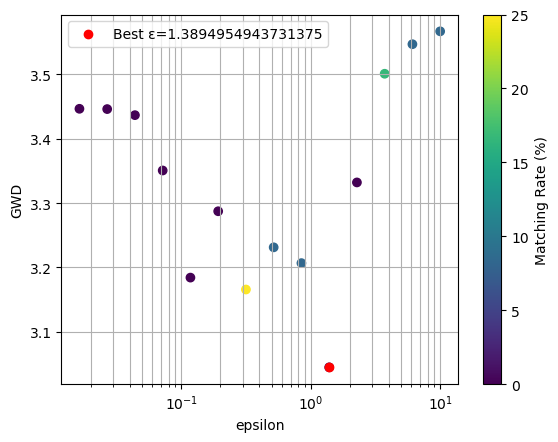

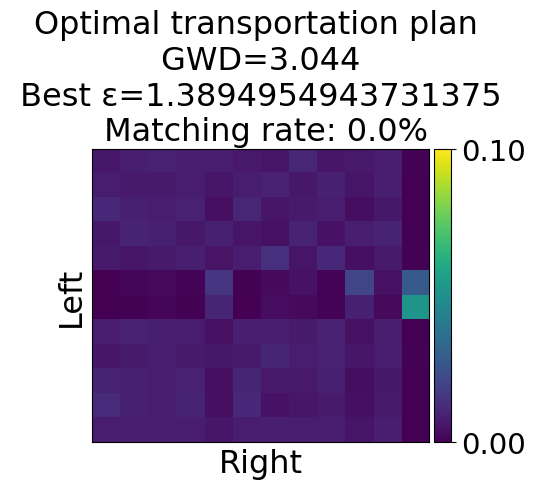

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07196856730011521, Minimum GWD: 2.598


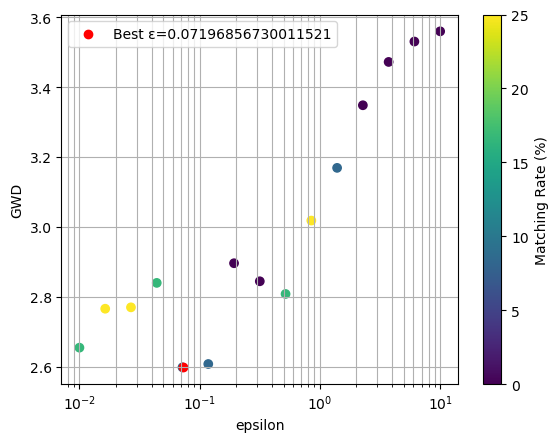

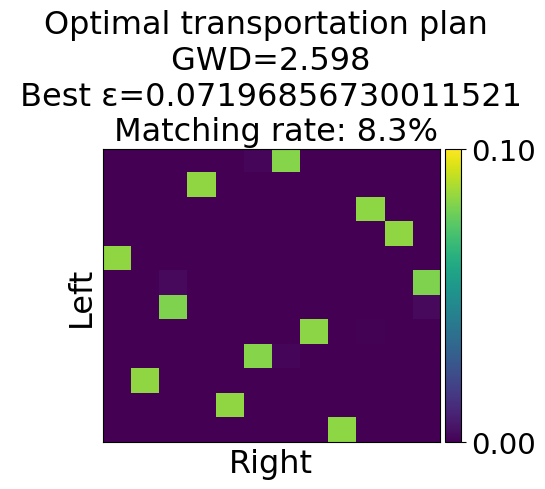

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 0.973


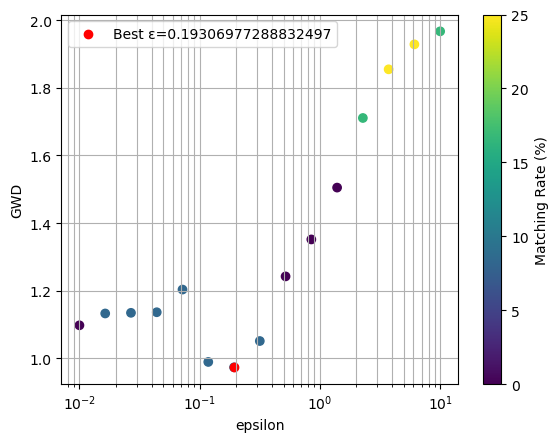

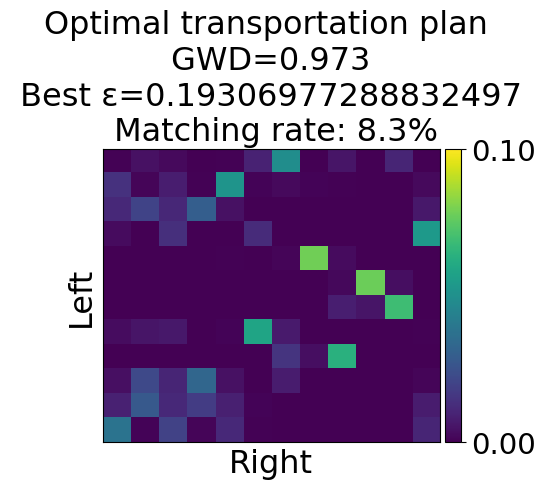

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 1.255


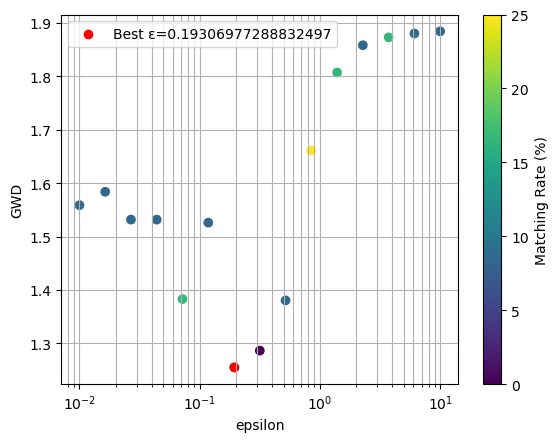

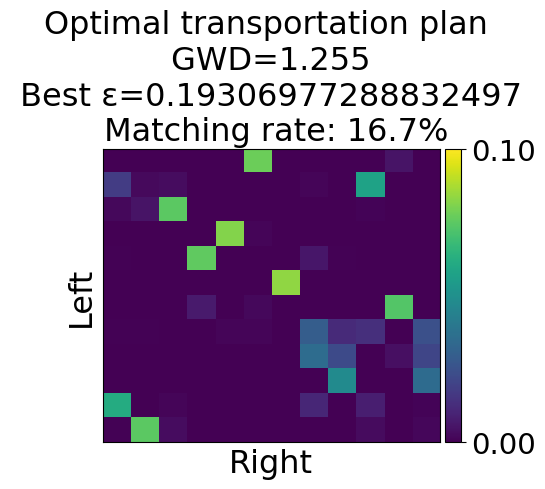

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.11787686347935872, Minimum GWD: 0.847


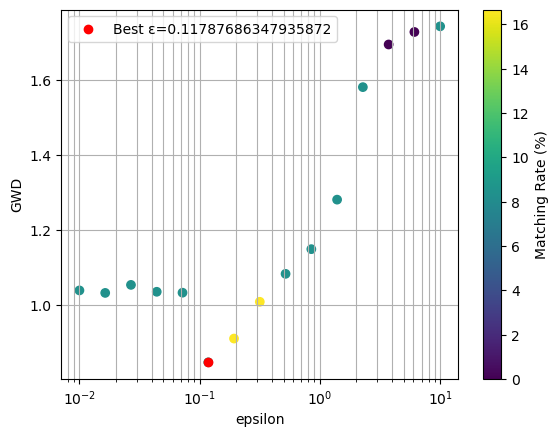

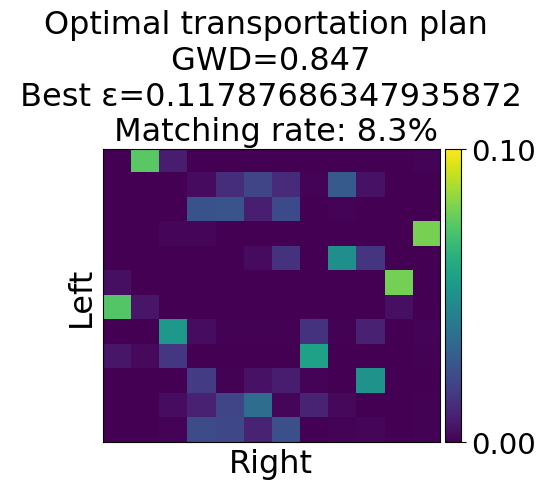

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07196856730011521, Minimum GWD: 0.786


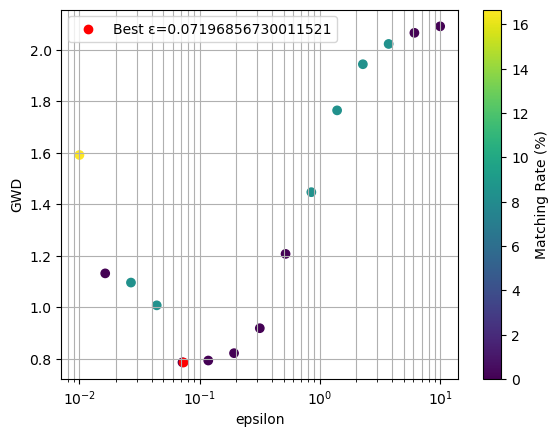

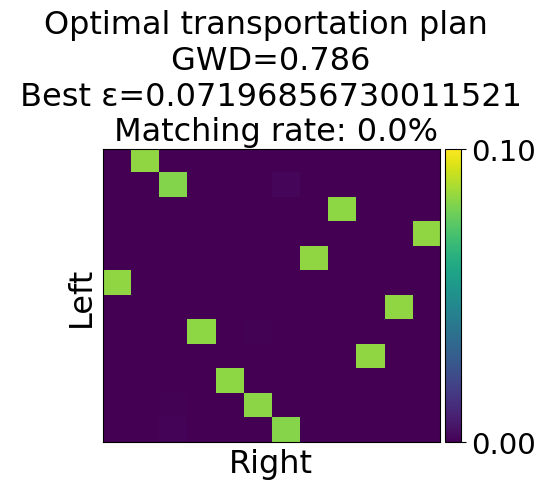

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31622776601683794, Minimum GWD: 1.089


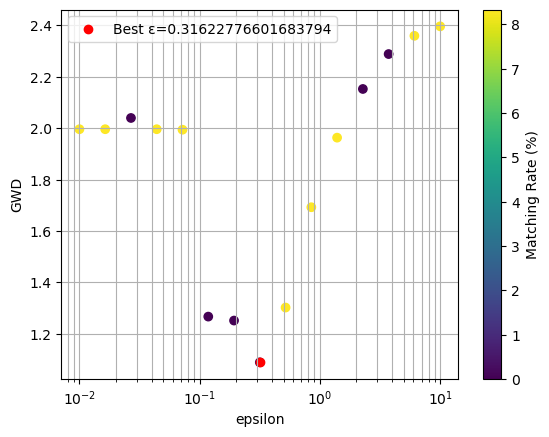

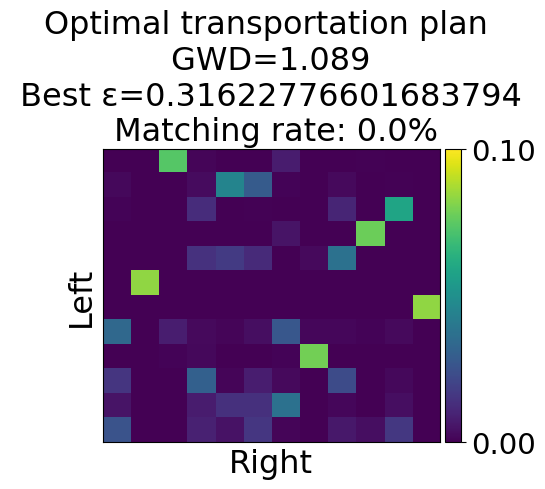

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:632: RuntimeWarning: divide by zero encountered in divide
  u = 1.0 / nx.dot(Kp, v)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 0.000


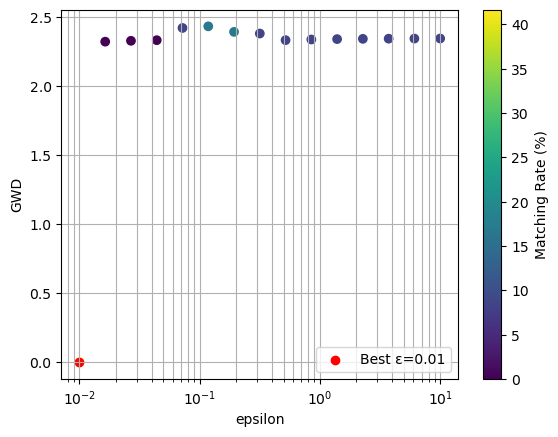

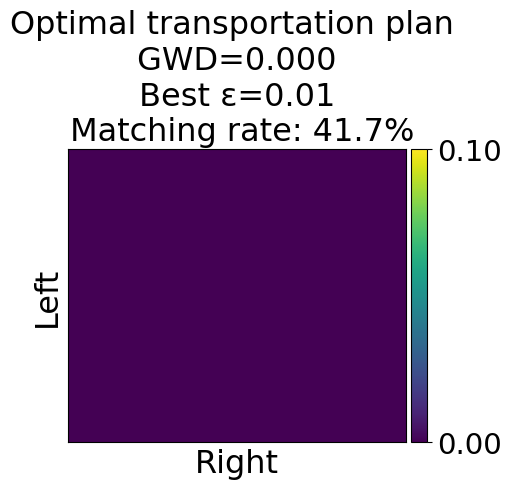

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 0.31622776601683794, Minimum GWD: 2.712


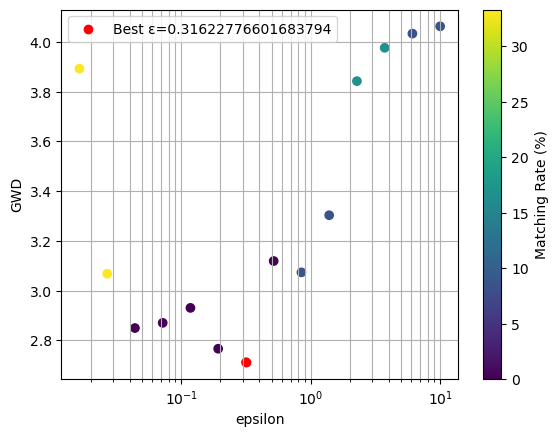

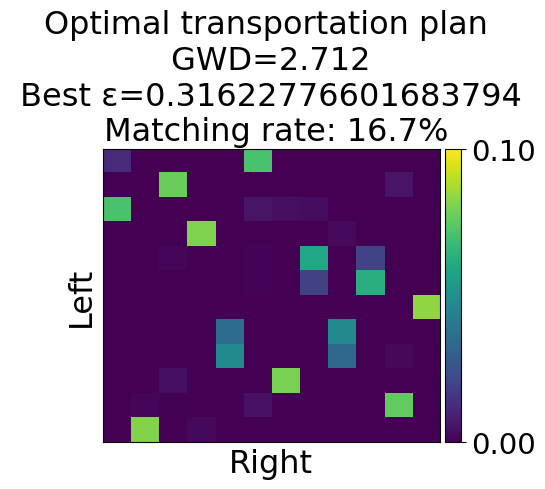

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.517947467923121, Minimum GWD: 2.285


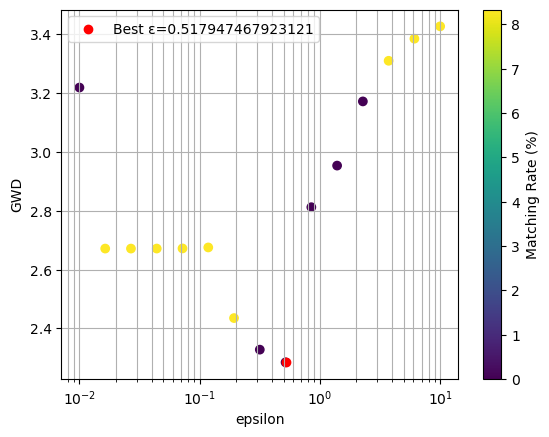

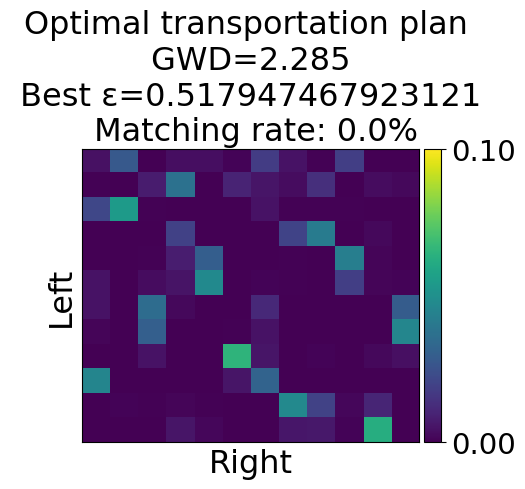

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 1.049


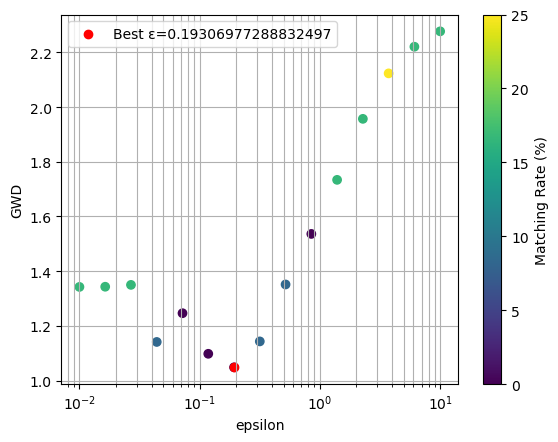

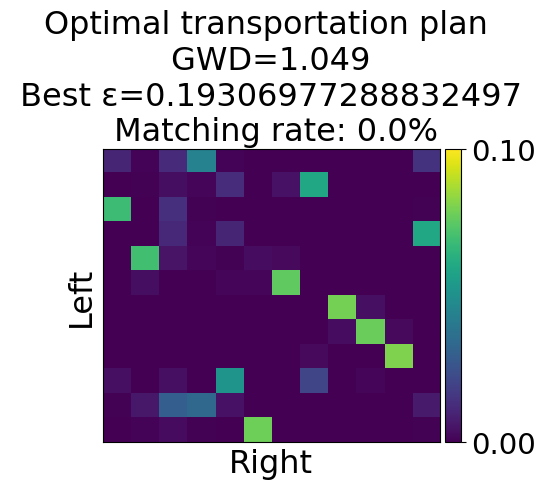

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31622776601683794, Minimum GWD: 1.416


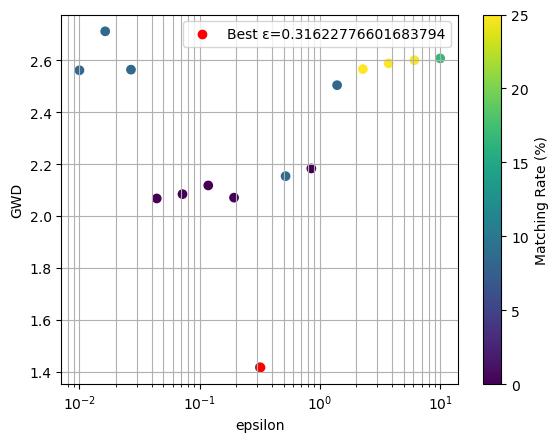

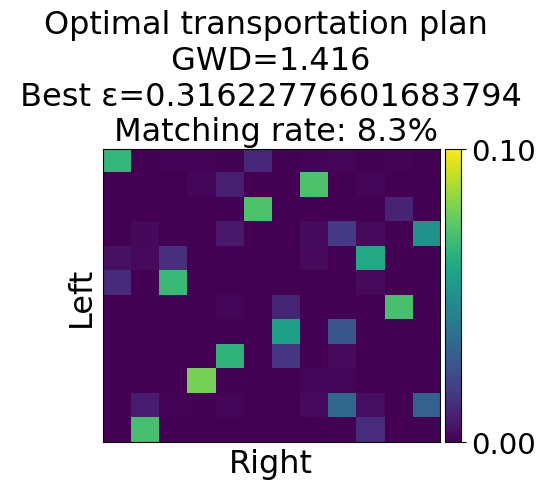

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.07196856730011521, Minimum GWD: 1.704


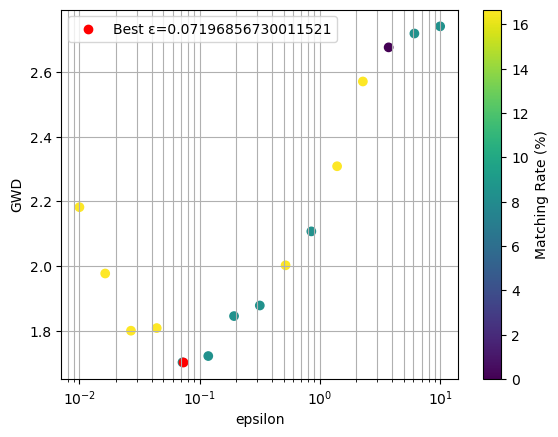

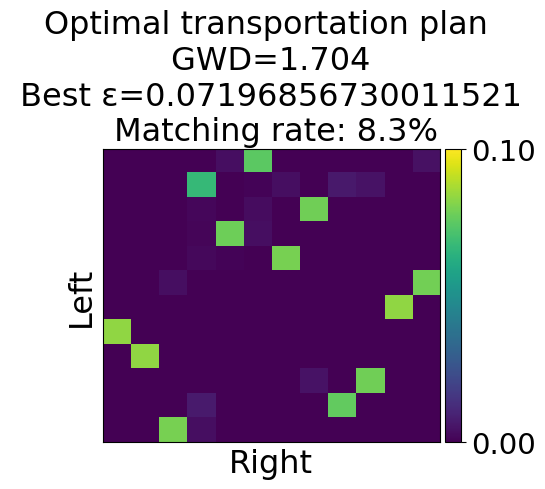

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.11787686347935872, Minimum GWD: 1.739


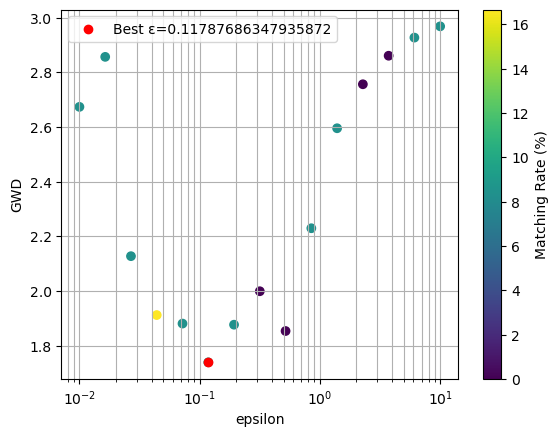

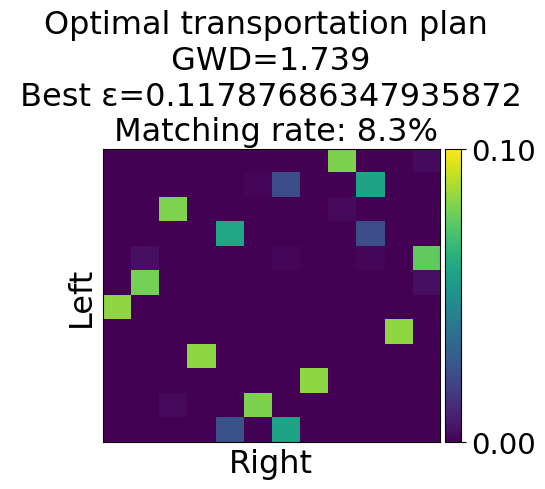

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.31622776601683794, Minimum GWD: 1.223


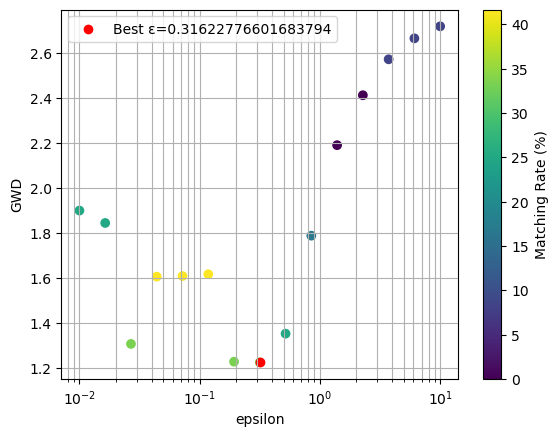

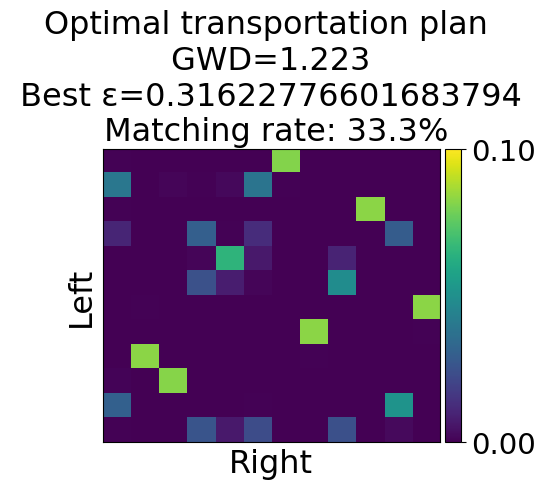

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:632: RuntimeWarning: divide by zero encountered in divide
  u = 1.0 / nx.dot(Kp, v)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 0.000


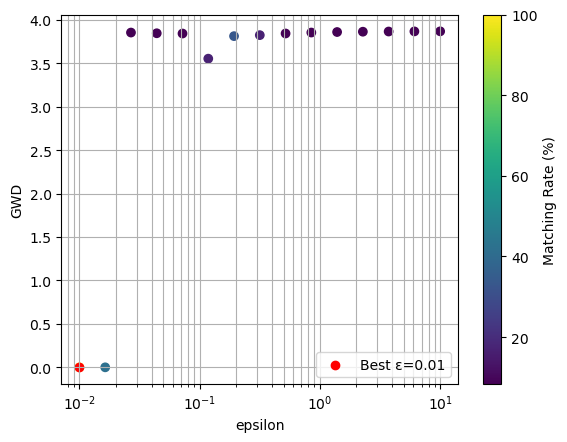

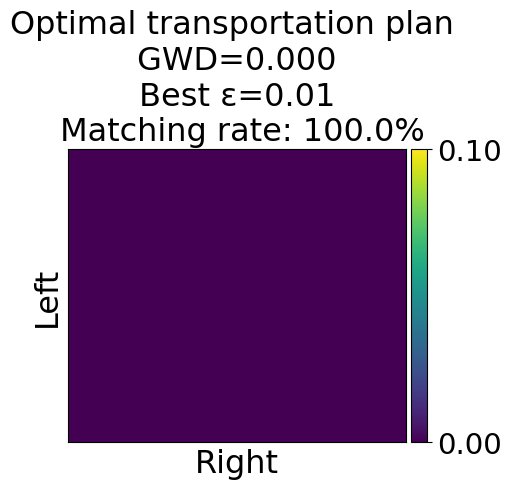

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: overflow encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numIt

Best epsilon: 0.07196856730011521, Minimum GWD: 2.643


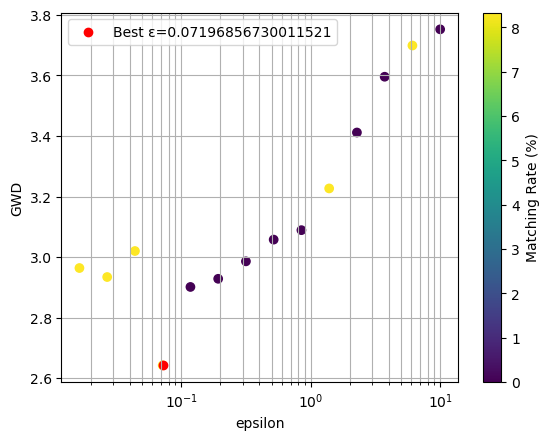

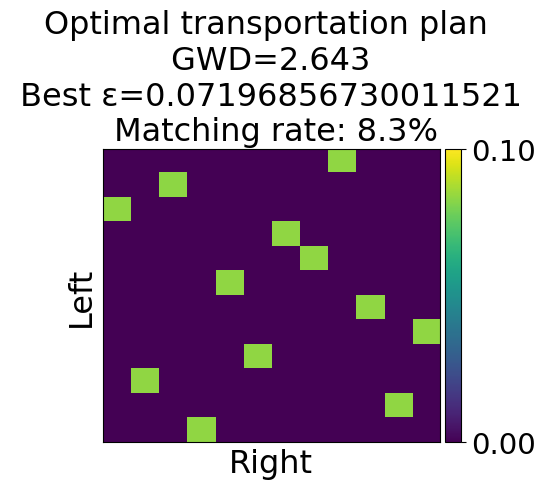

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:632: RuntimeWarning: divide by zero encountered in divide
  u = 1.0 / nx.dot(Kp, v)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterati

Best epsilon: 0.07196856730011521, Minimum GWD: 1.956


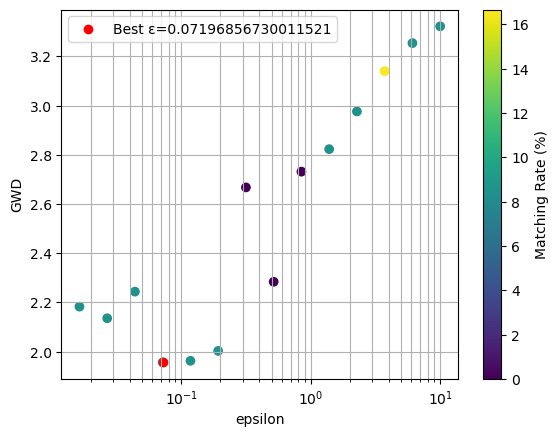

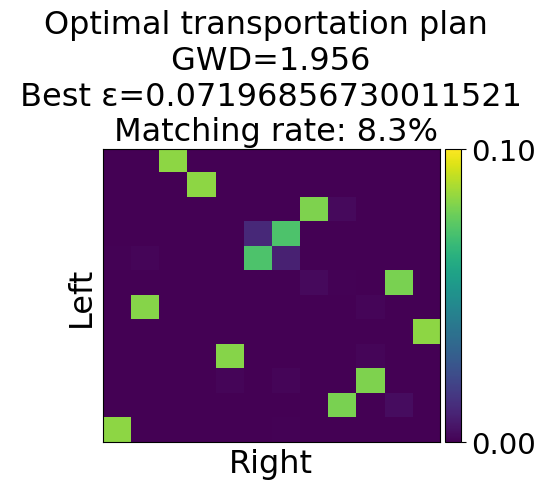

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.043939705607607904, Minimum GWD: 0.845


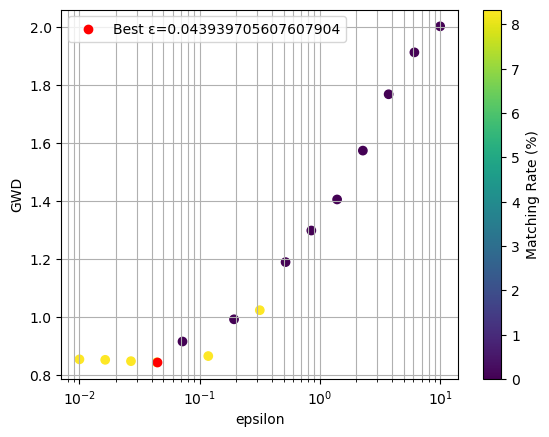

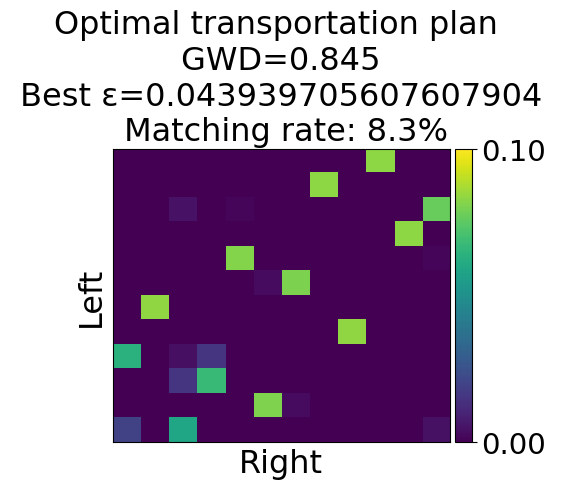

Skipping epsilon=0.01 because it results in a zero transportation matrix.


/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:632: RuntimeWarning: divide by zero encountered in divide
  u = 1.0 / nx.dot(Kp, v)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might w

Best epsilon: 0.31622776601683794, Minimum GWD: 1.357


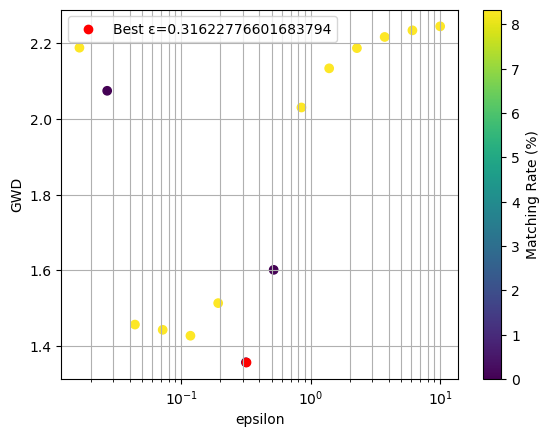

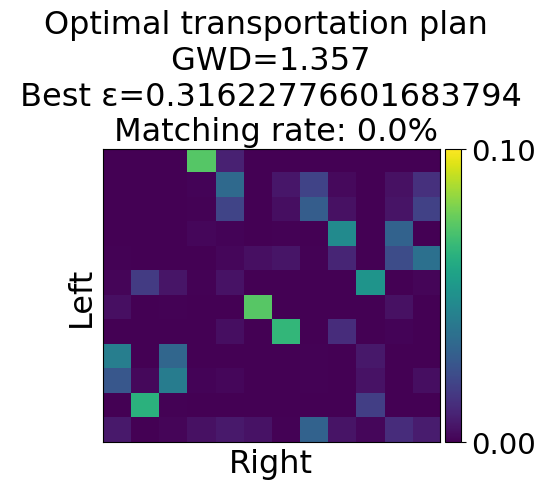

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:632: RuntimeWarning: divide by zero encountered in divide
  u = 1.0 / nx.dot(Kp, v)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:631: RuntimeWarning: divide by zero encountered in divide
  v = b / KtransposeU
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterati

Best epsilon: 0.01, Minimum GWD: 0.000


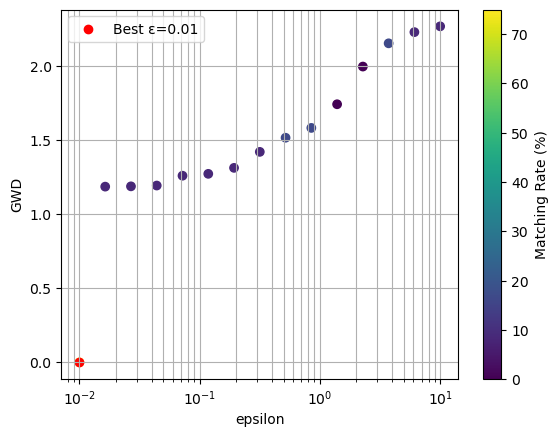

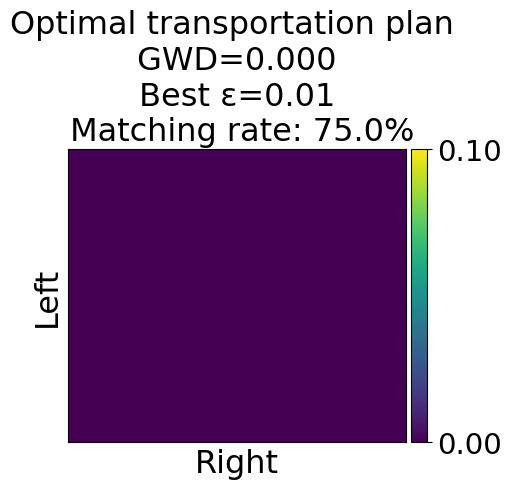

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 1.110


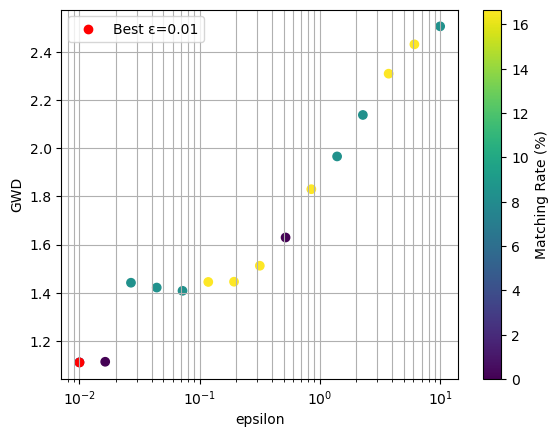

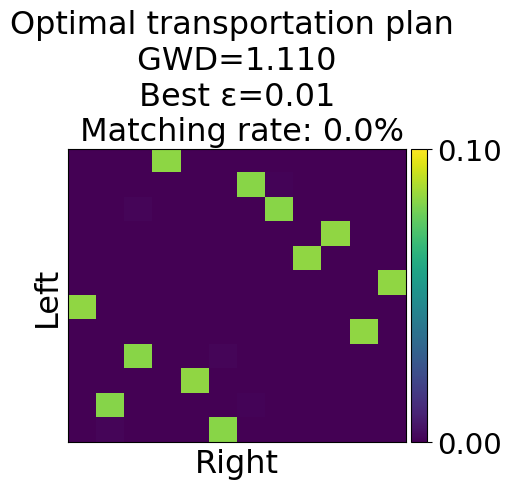

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.19306977288832497, Minimum GWD: 0.749


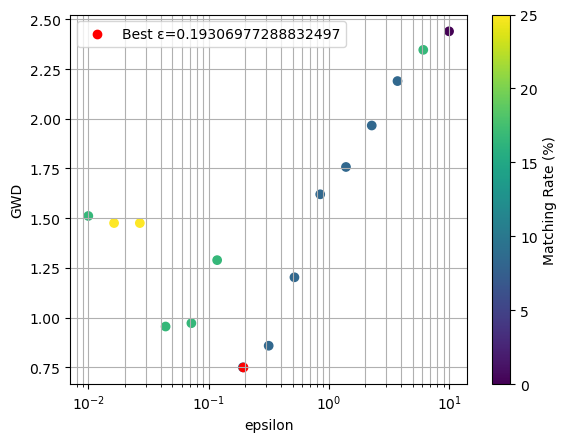

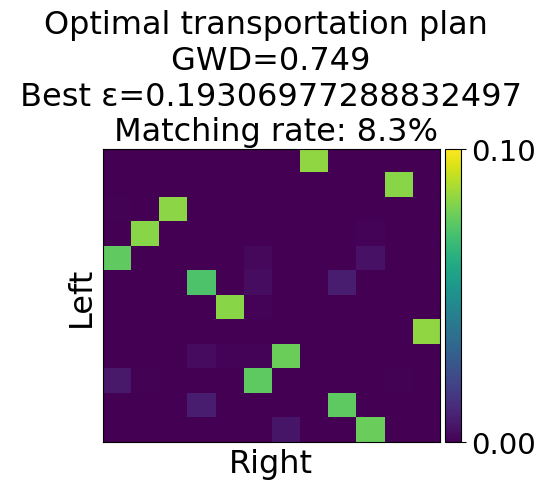

/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:632: RuntimeWarning: divide by zero encountered in divide
  u = 1.0 / nx.dot(Kp, v)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:643: UserWarning: Warning: numerical errors at iteration 0
  warnings.warn("Warning: numerical errors at iteration %d" % ii)
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/gromov/_bregman.py:245: UserWarning: Solver failed to produce a transport plan. You might want to increase the regularization parameter `epsilon`.
  warnings.warn(
/opt/anaconda3/envs/condapreferencequalia/lib/python3.11/site-packages/ot/bregman/_sinkhorn.py:667: UserWarning: Sinkhorn did not converge. You might want to increase the number of iterations `numItermax` or the regularization parameter `reg`.
  warnings.warn(


Best epsilon: 0.01, Minimum GWD: 0.000


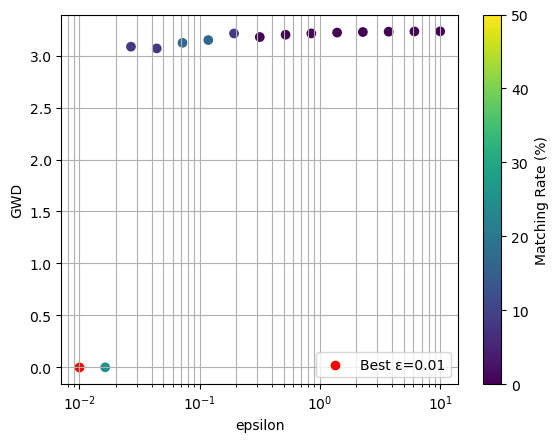

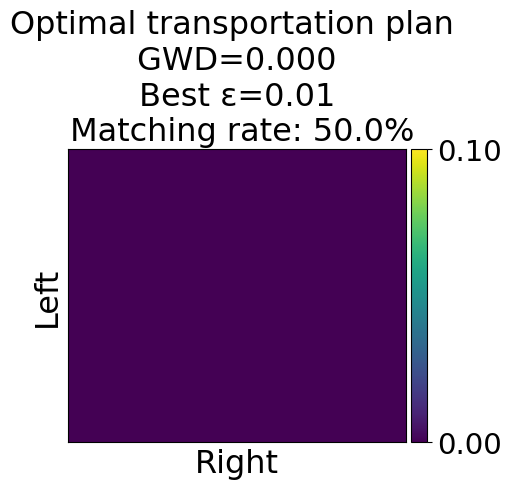

In [15]:
# --- 2. Compute GWOT between clusters ---
between_cluster_distances = []

for matrix_1 in cluster_1_matrices_preference_distance:
    for matrix_2 in cluster_2_matrices_preference_distance:
        _, _, _, min_gwd = GWD_and_plot(matrix_1, matrix_2, epsilons)
        between_cluster_distances.append(min_gwd)

In [19]:
np.save(file="within_cluster_distances.npy", arr=within_cluster_distances)
np.save(file="between_cluster_distances.npy", arr=between_cluster_distances)

In [7]:
# Load the saved arrays
within_cluster_distances = np.load("within_cluster_distances.npy")
between_cluster_distances = np.load("between_cluster_distances.npy")

# Optional: print to verify the data
print("Within-cluster distances:\n", within_cluster_distances)
print("Between-cluster distances:\n", between_cluster_distances)

Within-cluster distances:
 [1.64257723e+000 8.98700941e-001 1.38346252e+000 1.17597318e+000
 1.47439047e+000 8.93094407e-001 2.24750880e+000 1.44605267e+000
 1.59323164e+000 1.31740645e+000 1.85996857e+000 6.87068713e-001
 1.03168308e+000 2.02122014e+000 8.01239317e-001 5.34774185e-001
 9.98489638e-001 1.80503038e+000 1.19698071e+000 1.65297380e+000
 1.62393565e+000 2.70929565e+000 1.05282136e+000 2.00667010e+000
 1.53092178e+000 1.71545955e+000 1.60516593e+000 9.02339337e-001
 2.08346778e+000 6.59425496e-001 5.24199386e-001 8.78932243e-001
 1.38939422e+000 9.69240031e-001 1.24837423e+000 8.65326975e-001
 1.30985924e+000 8.94333608e-001 1.54772412e+000 7.22689655e-001
 1.46447201e+000 2.24456945e+000 2.60913331e+000 1.21672831e+000
 1.51428842e+000 8.61170515e-001 7.75926676e-001 1.45012176e+000
 8.89968215e-001 8.93534731e-001 2.14941694e+000 1.65156892e+000
 1.38334117e+000 1.17971264e+000 1.24013356e+000 4.04194865e+000
 2.65377405e+000             nan 2.73516392e+000 2.66109600e+00

In [8]:
# --- 3. Statistical Comparison ---

# Remove NaN values
within_clean = within_cluster_distances[~np.isnan(within_cluster_distances)]
between_clean = between_cluster_distances[~np.isnan(between_cluster_distances)]

# Mann-Whitney U test
stat, p_value = mannwhitneyu(within_clean, between_clean, alternative='two-sided')
print("Mann-Whitney U test result:")
print(f"Statistic = {stat:.4f}, p-value = {p_value:.4e}")

# t-test
t_stat, t_p_value = ttest_ind(within_clean, between_clean, nan_policy='omit')
print(f"t-test result: t = {t_stat:.4f}, p = {t_p_value:.4e}")


Mann-Whitney U test result:
Statistic = 3597.0000, p-value = 9.7388e-01
t-test result: t = 0.1297, p = 8.9700e-01



--- Normality Test for Within-Cluster Distances ---
Shapiro-Wilk: W = nan, p = nan
D’Agostino & Pearson: stat = nan, p = nan
=> Likely normally distributed (p ≥ 0.05)


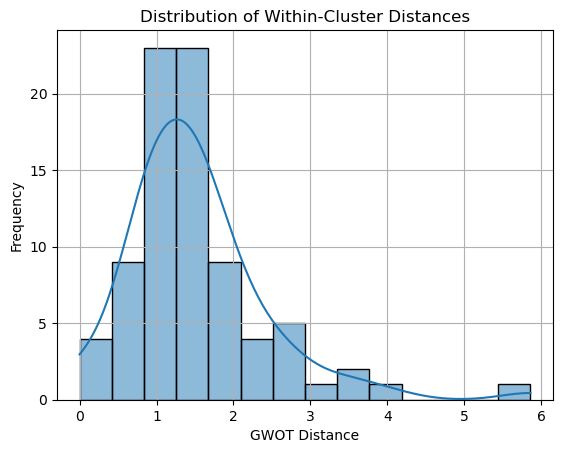


--- Normality Test for Between-Cluster Distances ---
Shapiro-Wilk: W = 0.9596, p = 7.7458e-03
D’Agostino & Pearson: stat = 3.0391, p = 2.1881e-01
=> Likely not normally distributed (p < 0.05)


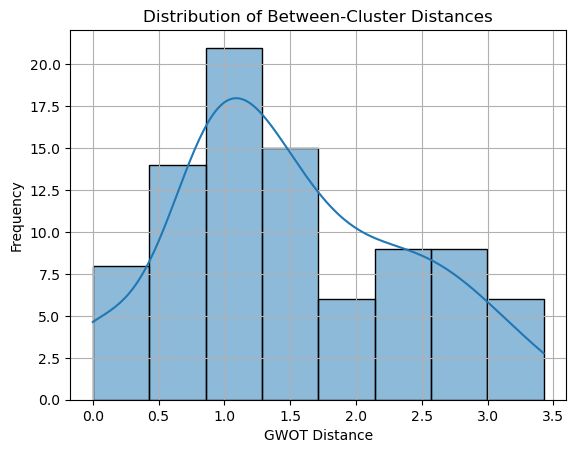

In [9]:
from scipy.stats import shapiro, normaltest
import matplotlib.pyplot as plt
import seaborn as sns

# --- Normality Tests ---
def test_normality(data, label):
    print(f"\n--- Normality Test for {label} ---")

    # Shapiro-Wilk Test
    shapiro_stat, shapiro_p = shapiro(data)
    print(f"Shapiro-Wilk: W = {shapiro_stat:.4f}, p = {shapiro_p:.4e}")

    # D'Agostino and Pearson Test
    dag_stat, dag_p = normaltest(data)
    print(f"D’Agostino & Pearson: stat = {dag_stat:.4f}, p = {dag_p:.4e}")

    # Interpretation
    if shapiro_p < 0.05 or dag_p < 0.05:
        print("=> Likely not normally distributed (p < 0.05)")
    else:
        print("=> Likely normally distributed (p ≥ 0.05)")

    # Optional: Plot
    sns.histplot(data, kde=True)
    plt.title(f"Distribution of {label}")
    plt.xlabel("GWOT Distance")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.show()

# Run tests
test_normality(within_cluster_distances, "Within-Cluster Distances")
test_normality(between_cluster_distances, "Between-Cluster Distances")